In [ ]:
# Required columns on input dataframe: 
#['timestamp', 'series_id', 'Brand', 'Resource ID', 'ADD', 'sin_week', 'cos_week', 'week_number']


# Libraries
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

from modules.features import load_data, series_exog, train_test_split, calculate_stats_train, normalize_series, create_time_series_dicts, get_split_col, get_df_input

from modules.plotting import plot_series, plot_train_test_split, plot_results, plot_results_dual_scale

from modules.lgbm_architecture import create_forecaster, tune_forecaster, create_final_forecaster, backtest_forecaster, fit_predict

from modules.metrics import format_results, residuals

In [2]:
filepath="./features_py.xlsx"

features = load_data(filepath)

series_ini, exog_ini = series_exog(features)

df_full = get_split_col(series_ini)

df_full

,timestamp,Brand,Resource ID,split,series_id
0,2024-07-03,ADROIT,E00A,0.066996,ADROIT||E00A
1,2024-07-03,ADROIT,E00B,0.933004,ADROIT||E00B
2,2024-07-03,ANGIOGUARD,EM_L81,1.000000,ANGIOGUARD||EM_L81
3,2024-07-03,AQUATRACK,EM_L71,1.000000,AQUATRACK||EM_L71
4,2024-07-03,ARC ROYAL,EM_O01_NL,0.221582,ARC ROYAL||EM_O01_NL
...,...,...,...,...,...
7918,2025-07-30,VISTA BRITE TIP (MODIFIED),A01,0.000000,VISTA BRITE TIP (MODIFIED)||A01
7919,2025-07-30,VISTA BRITE TIP (MODIFIED),E00D,1.000000,VISTA BRITE TIP (MODIFIED)||E00D
7920,2025-07-30,WIZDOM,EM_K60,1.000000,WIZDOM||EM_K60
7921,2025-07-30,WIZDOM,EM_K60_NL,0.000000,WIZDOM||EM_K60_NL


In [3]:
df_input = get_df_input(df_full)

wk_feats = (exog_ini[['timestamp', 'sin_week', 'cos_week', 'week_number']]
            .drop_duplicates(subset=['timestamp']))
df_input = df_input.merge(wk_feats, on='timestamp', how='left')

series, exog = series_exog(df_input)

series

,timestamp,series_id,split,s_split
0,2024-07-03,ADROIT||E00A,0.066996,-2.633772
1,2024-07-03,ADROIT||E00B,0.933004,2.633772
2,2024-07-03,ANGIOGUARD||EM_L81,1.000000,13.815510
3,2024-07-03,AQUATRACK||EM_L71,1.000000,13.815510
4,2024-07-03,ARC ROYAL||EM_O01_NL,0.221582,-1.256471
...,...,...,...,...
7918,2025-07-30,VISTA BRITE TIP (MODIFIED)||A01,0.000000,-13.815510
7919,2025-07-30,VISTA BRITE TIP (MODIFIED)||E00D,1.000000,13.815510
7920,2025-07-30,WIZDOM||EM_K60,1.000000,13.815510
7921,2025-07-30,WIZDOM||EM_K60_NL,0.000000,-13.815510


In [4]:
series_train, series_test, exog_train, exog_test = train_test_split(series, exog, test_weeks=8)

series_dict_train, series_dict_test, exog_dict_train, exog_dict_test = create_time_series_dicts(
    series_train, series_test, exog_train, exog_test, target_col='s_split'
)
series_test

,timestamp,series_id,split,s_split
6811,2025-06-11,ADROIT||E00A,0.006982,-4.957418
6812,2025-06-11,ADROIT||E00B,0.993018,4.957418
6813,2025-06-11,ANGIOGUARD||EM_L81,1.000000,13.815510
6814,2025-06-11,AQUATRACK||EM_L71,1.000000,13.815510
6815,2025-06-11,ARC ROYAL||EM_O01_NL,0.108397,-2.107223
...,...,...,...,...
7918,2025-07-30,VISTA BRITE TIP (MODIFIED)||A01,0.000000,-13.815510
7919,2025-07-30,VISTA BRITE TIP (MODIFIED)||E00D,1.000000,13.815510
7920,2025-07-30,WIZDOM||EM_K60,1.000000,13.815510
7921,2025-07-30,WIZDOM||EM_K60_NL,0.000000,-13.815510


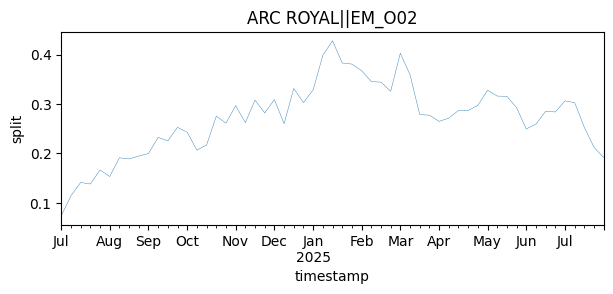

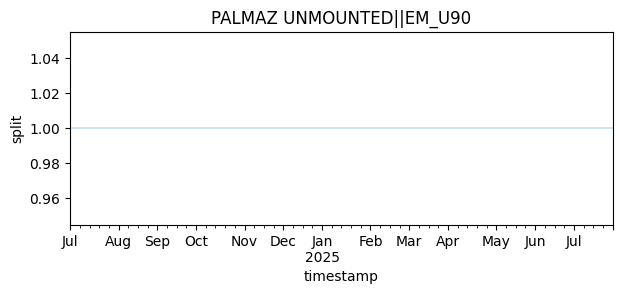

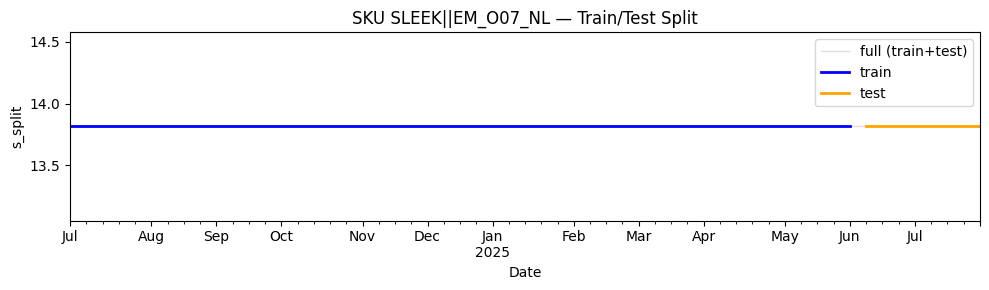

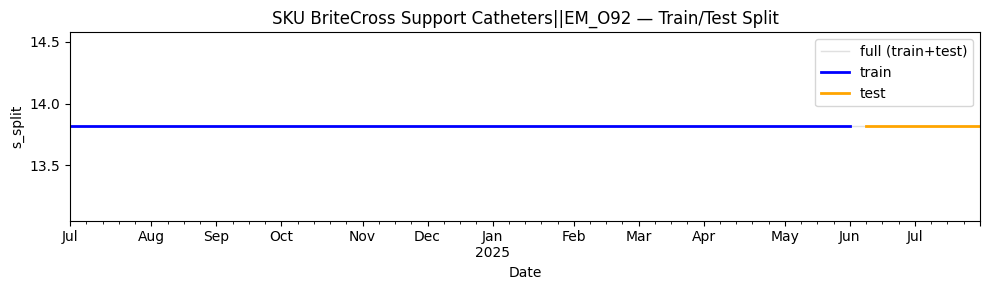

In [23]:
plot_series(df_input, column='split')
plot_train_test_split(series_dict_train, series_dict_test, ylabel='s_split')

In [7]:
forecaster = create_forecaster()
forecaster

============================== 
ForecasterRecursiveMultiSeries 
============================== 
Regressor: LGBMRegressor 
Lags: [1 2 3 4] 
Window features: None 
Window size: 4 
Series encoding: ordinal 
Series names (levels): None 
Exogenous included: False 
Exogenous names: None 
Transformer for series: None 
Transformer for exog: None 
Weight function included: False 
Series weights: None 
Differentiation order: None 
Training range: None 
Training index type: None 
Training index frequency: None 
Regressor parameters: 
    {'boosting_type': 'gbdt', 'class_weight': None, 'colsample_bytree': 0.8,
    'importance_type': 'split', 'learning_rate': 0.05, 'max_depth': -1,
    'min_child_samples': 20, 'min_child_weight': 0.001, 'min_split_gain': 0.0,
    'n_estimators': 600, 'n_jobs': -1, 'num_leaves': 63, 'objective': None,
    'random_state': 42, 'reg_alpha': 0.0, 'reg_lambda': 0.0, 'subsample': 0.8,
    'subsample_for_bin': 200000, 'subsample_freq': 0} 
fit_kwargs: {} 
Creation date: 2025-09-25 13:52:25 
Last fit date: None 
Skforecast version: 0.17.0 
Python version: 3.13.5 
Forecaster id: None

In [8]:
best_params, best_lags = tune_forecaster(series_dict_train, exog_dict_train)

  0%|          | 0/20 [00:00<?, ?it/s]

[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=0.8 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] lambda_l1 is set=1.0, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0
[LightGBM] [Warning] lambda_l2 is set=0.9, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.9
[LightGBM] [Warning] bagging_fraction is set=0.6, subsample=0.8 will be ignored. Current value: bagging_fraction=0.6
[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=0.8 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] lambda_l1 is set=1.0, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0
[LightGBM] [Warning] lambda_l2 is set=0.9, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.9
[LightGBM] [Warning] bagging_fraction is set=0.6, subsample=0.8 will be ignored. Current value: bagging_fraction=0.6
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000203 seconds.


Best trial: 0. Best value: 0.193401:   5%|▌         | 1/20 [00:00<00:08,  2.29it/s]

[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=0.8 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] lambda_l1 is set=0.5, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5
[LightGBM] [Warning] lambda_l2 is set=0.8, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.8
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=0.8 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=0.8 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] lambda_l1 is set=0.5, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5
[LightGBM] [Warning] lambda_l2 is set=0.8, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.8
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=0.8 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000584 seconds.


Best trial: 0. Best value: 0.193401:  10%|█         | 2/20 [00:01<00:09,  1.91it/s]

[LightGBM] [Warning] feature_fraction is set=1.0, colsample_bytree=0.8 will be ignored. Current value: feature_fraction=1.0
[LightGBM] [Warning] lambda_l1 is set=0.1, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1
[LightGBM] [Warning] lambda_l2 is set=0.7000000000000001, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.7000000000000001
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=0.8 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] feature_fraction is set=1.0, colsample_bytree=0.8 will be ignored. Current value: feature_fraction=1.0
[LightGBM] [Warning] lambda_l1 is set=0.1, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1
[LightGBM] [Warning] lambda_l2 is set=0.7000000000000001, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.7000000000000001
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=0.8 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Info] Auto-choosing col-wise mul

Best trial: 0. Best value: 0.193401:  15%|█▌        | 3/20 [00:01<00:09,  1.80it/s]

[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=0.8 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] lambda_l1 is set=1.0, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0
[LightGBM] [Warning] lambda_l2 is set=0.8, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.8
[LightGBM] [Warning] bagging_fraction is set=0.6, subsample=0.8 will be ignored. Current value: bagging_fraction=0.6
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=0.8 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] lambda_l1 is set=1.0, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0
[LightGBM] [Warning] lambda_l2 is set=0.8, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.8
[LightGBM] [Warning] bagging_fraction is set=0.6, subsample=0.8 will be ignored. Current value: bagging_fraction=0.6
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000199 seconds.


Best trial: 4. Best value: 0.0801199:  20%|██        | 4/20 [00:02<00:08,  1.81it/s]

[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=0.8 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] lambda_l1 is set=0.30000000000000004, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.30000000000000004
[LightGBM] [Warning] lambda_l2 is set=0.30000000000000004, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.30000000000000004
[LightGBM] [Warning] bagging_fraction is set=1.0, subsample=0.8 will be ignored. Current value: bagging_fraction=1.0
[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=0.8 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] lambda_l1 is set=0.30000000000000004, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.30000000000000004
[LightGBM] [Warning] lambda_l2 is set=0.30000000000000004, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.30000000000000004
[LightGBM] [Warning] bagging_fraction is set=1.0, subsample=0.8 will be ignored. Current valu

Best trial: 4. Best value: 0.0801199:  25%|██▌       | 5/20 [00:02<00:07,  1.99it/s]

[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=0.8 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] lambda_l1 is set=0.8, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8
[LightGBM] [Warning] lambda_l2 is set=0.0, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=0.8 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=0.8 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] lambda_l1 is set=0.8, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8
[LightGBM] [Warning] lambda_l2 is set=0.0, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=0.8 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000183 seconds.


Best trial: 4. Best value: 0.0801199:  30%|███       | 6/20 [00:03<00:07,  1.93it/s]

[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=0.8 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] lambda_l1 is set=0.5, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5
[LightGBM] [Warning] lambda_l2 is set=0.1, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.1
[LightGBM] [Warning] bagging_fraction is set=1.0, subsample=0.8 will be ignored. Current value: bagging_fraction=1.0
[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=0.8 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] lambda_l1 is set=0.5, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5
[LightGBM] [Warning] lambda_l2 is set=0.1, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.1
[LightGBM] [Warning] bagging_fraction is set=1.0, subsample=0.8 will be ignored. Current value: bagging_fraction=1.0
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000209 seconds.


Best trial: 4. Best value: 0.0801199:  35%|███▌      | 7/20 [00:03<00:06,  1.91it/s]

[LightGBM] [Warning] feature_fraction is set=0.6, colsample_bytree=0.8 will be ignored. Current value: feature_fraction=0.6
[LightGBM] [Warning] lambda_l1 is set=0.30000000000000004, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.30000000000000004
[LightGBM] [Warning] lambda_l2 is set=0.5, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.5
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=0.8 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] feature_fraction is set=0.6, colsample_bytree=0.8 will be ignored. Current value: feature_fraction=0.6
[LightGBM] [Warning] lambda_l1 is set=0.30000000000000004, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.30000000000000004
[LightGBM] [Warning] lambda_l2 is set=0.5, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.5
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=0.8 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Info] Auto-choosing col-wise

Best trial: 4. Best value: 0.0801199:  40%|████      | 8/20 [00:04<00:06,  1.93it/s]

[LightGBM] [Warning] feature_fraction is set=1.0, colsample_bytree=0.8 will be ignored. Current value: feature_fraction=1.0
[LightGBM] [Warning] lambda_l1 is set=0.9, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9
[LightGBM] [Warning] lambda_l2 is set=0.8, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.8
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=0.8 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] feature_fraction is set=1.0, colsample_bytree=0.8 will be ignored. Current value: feature_fraction=1.0
[LightGBM] [Warning] lambda_l1 is set=0.9, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9
[LightGBM] [Warning] lambda_l2 is set=0.8, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.8
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=0.8 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000170 seconds.


Best trial: 4. Best value: 0.0801199:  45%|████▌     | 9/20 [00:04<00:05,  2.03it/s]

[LightGBM] [Warning] feature_fraction is set=1.0, colsample_bytree=0.8 will be ignored. Current value: feature_fraction=1.0
[LightGBM] [Warning] lambda_l1 is set=0.0, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0
[LightGBM] [Warning] lambda_l2 is set=0.5, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.5
[LightGBM] [Warning] bagging_fraction is set=1.0, subsample=0.8 will be ignored. Current value: bagging_fraction=1.0
[LightGBM] [Warning] feature_fraction is set=1.0, colsample_bytree=0.8 will be ignored. Current value: feature_fraction=1.0
[LightGBM] [Warning] lambda_l1 is set=0.0, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0
[LightGBM] [Warning] lambda_l2 is set=0.5, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.5
[LightGBM] [Warning] bagging_fraction is set=1.0, subsample=0.8 will be ignored. Current value: bagging_fraction=1.0
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000156 seconds.


Best trial: 4. Best value: 0.0801199:  50%|█████     | 10/20 [00:05<00:05,  1.95it/s]

[LightGBM] [Warning] feature_fraction is set=0.6, colsample_bytree=0.8 will be ignored. Current value: feature_fraction=0.6
[LightGBM] [Warning] lambda_l1 is set=0.30000000000000004, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.30000000000000004
[LightGBM] [Warning] lambda_l2 is set=0.30000000000000004, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.30000000000000004
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=0.8 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] feature_fraction is set=0.6, colsample_bytree=0.8 will be ignored. Current value: feature_fraction=0.6
[LightGBM] [Warning] lambda_l1 is set=0.30000000000000004, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.30000000000000004
[LightGBM] [Warning] lambda_l2 is set=0.30000000000000004, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.30000000000000004
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=0.8 will be ignored. Current valu

Best trial: 4. Best value: 0.0801199:  55%|█████▌    | 11/20 [00:05<00:04,  1.90it/s]

[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=0.8 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] lambda_l1 is set=0.0, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0
[LightGBM] [Warning] lambda_l2 is set=0.4, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.4
[LightGBM] [Warning] bagging_fraction is set=1.0, subsample=0.8 will be ignored. Current value: bagging_fraction=1.0
[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=0.8 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] lambda_l1 is set=0.0, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0
[LightGBM] [Warning] lambda_l2 is set=0.4, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.4
[LightGBM] [Warning] bagging_fraction is set=1.0, subsample=0.8 will be ignored. Current value: bagging_fraction=1.0
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000193 seconds.


Best trial: 4. Best value: 0.0801199:  60%|██████    | 12/20 [00:06<00:04,  1.81it/s]

[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=0.8 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] lambda_l1 is set=0.2, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2
[LightGBM] [Warning] lambda_l2 is set=0.30000000000000004, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.30000000000000004
[LightGBM] [Warning] bagging_fraction is set=1.0, subsample=0.8 will be ignored. Current value: bagging_fraction=1.0
[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=0.8 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] lambda_l1 is set=0.2, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2
[LightGBM] [Warning] lambda_l2 is set=0.30000000000000004, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.30000000000000004
[LightGBM] [Warning] bagging_fraction is set=1.0, subsample=0.8 will be ignored. Current value: bagging_fraction=1.0
[LightGBM] [Info] Auto-choosing col-wise

Best trial: 4. Best value: 0.0801199:  65%|██████▌   | 13/20 [00:06<00:03,  1.85it/s]

[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=0.8 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] lambda_l1 is set=0.2, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2
[LightGBM] [Warning] lambda_l2 is set=0.2, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.2
[LightGBM] [Warning] bagging_fraction is set=1.0, subsample=0.8 will be ignored. Current value: bagging_fraction=1.0
[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=0.8 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] lambda_l1 is set=0.2, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2
[LightGBM] [Warning] lambda_l2 is set=0.2, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.2
[LightGBM] [Warning] bagging_fraction is set=1.0, subsample=0.8 will be ignored. Current value: bagging_fraction=1.0
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000174 seconds.


Best trial: 4. Best value: 0.0801199:  70%|███████   | 14/20 [00:07<00:03,  1.85it/s]

[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=0.8 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] lambda_l1 is set=0.7000000000000001, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7000000000000001
[LightGBM] [Warning] lambda_l2 is set=0.2, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.2
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=0.8 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=0.8 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] lambda_l1 is set=0.7000000000000001, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7000000000000001
[LightGBM] [Warning] lambda_l2 is set=0.2, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.2
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=0.8 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Info] Auto-choosing col-wise mul

Best trial: 4. Best value: 0.0801199:  75%|███████▌  | 15/20 [00:07<00:02,  1.93it/s]

[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=0.8 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] lambda_l1 is set=0.4, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4
[LightGBM] [Warning] lambda_l2 is set=0.0, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=0.8 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=0.8 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] lambda_l1 is set=0.4, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4
[LightGBM] [Warning] lambda_l2 is set=0.0, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=0.8 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000152 seconds.


Best trial: 4. Best value: 0.0801199:  80%|████████  | 16/20 [00:08<00:02,  1.78it/s]

[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=0.8 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] lambda_l1 is set=0.2, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2
[LightGBM] [Warning] lambda_l2 is set=0.2, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.2
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=0.8 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=0.8 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] lambda_l1 is set=0.2, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2
[LightGBM] [Warning] lambda_l2 is set=0.2, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.2
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=0.8 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000266 seconds.


Best trial: 4. Best value: 0.0801199:  85%|████████▌ | 17/20 [00:09<00:01,  1.73it/s]

[LightGBM] [Warning] feature_fraction is set=0.6, colsample_bytree=0.8 will be ignored. Current value: feature_fraction=0.6
[LightGBM] [Warning] lambda_l1 is set=0.6000000000000001, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=0.6000000000000001, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.6000000000000001
[LightGBM] [Warning] bagging_fraction is set=1.0, subsample=0.8 will be ignored. Current value: bagging_fraction=1.0
[LightGBM] [Warning] feature_fraction is set=0.6, colsample_bytree=0.8 will be ignored. Current value: feature_fraction=0.6
[LightGBM] [Warning] lambda_l1 is set=0.6000000000000001, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=0.6000000000000001, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.6000000000000001
[LightGBM] [Warning] bagging_fraction is set=1.0, subsample=0.8 will be ignored. Current value: baggi

Best trial: 4. Best value: 0.0801199:  90%|█████████ | 18/20 [00:09<00:01,  1.66it/s]

[LightGBM] [Warning] feature_fraction is set=0.6, colsample_bytree=0.8 will be ignored. Current value: feature_fraction=0.6
[LightGBM] [Warning] lambda_l1 is set=0.6000000000000001, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=0.6000000000000001, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.6000000000000001
[LightGBM] [Warning] bagging_fraction is set=1.0, subsample=0.8 will be ignored. Current value: bagging_fraction=1.0
[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=0.8 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] lambda_l1 is set=0.30000000000000004, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.30000000000000004
[LightGBM] [Warning] lambda_l2 is set=0.30000000000000004, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.30000000000000004
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=0.8 will be ignored. Current value: b

Best trial: 4. Best value: 0.0801199:  95%|█████████▌| 19/20 [00:10<00:00,  1.67it/s]

[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=0.8 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] lambda_l1 is set=0.1, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1
[LightGBM] [Warning] lambda_l2 is set=0.1, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.1
[LightGBM] [Warning] bagging_fraction is set=1.0, subsample=0.8 will be ignored. Current value: bagging_fraction=1.0
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=0.8 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] lambda_l1 is set=0.1, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1
[LightGBM] [Warning] lambda_l2 is set=0.1, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.1
[LightGBM] [Warning] bagging_fraction is set=1.0, subsample=0.8 will be ignored. Current value: bagging_fraction=1.0
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000187 seconds.


Best trial: 4. Best value: 0.0801199: 100%|██████████| 20/20 [00:10<00:00,  1.83it/s]
c:\Users\maria.diazalba\OneDrive - Cordis US Corp\0 MARIA\SKU Demand\venv_psr\Lib\site-packages\optuna\distributions.py:518: UserWarning: Choices for a categorical distribution should be a tuple of None, bool, int, float and str for persistent storage but contains [1, 2, 3, 4] which is of type list.
  warnings.warn(message)
c:\Users\maria.diazalba\OneDrive - Cordis US Corp\0 MARIA\SKU Demand\venv_psr\Lib\site-packages\optuna\distributions.py:518: UserWarning: Choices for a categorical distribution should be a tuple of None, bool, int, float and str for persistent storage but contains [1, 2, 3, 4, 8] which is of type list.
  warnings.warn(message)
c:\Users\maria.diazalba\OneDrive - Cordis US Corp\0 MARIA\SKU Demand\venv_psr\Lib\site-packages\optuna\distributions.py:518: UserWarning: Choices for a categorical distribution should be a tuple of None, bool, int, float and str for persistent storage but con

[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=0.8 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] lambda_l1 is set=0.30000000000000004, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.30000000000000004
[LightGBM] [Warning] lambda_l2 is set=0.30000000000000004, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.30000000000000004
[LightGBM] [Warning] bagging_fraction is set=1.0, subsample=0.8 will be ignored. Current value: bagging_fraction=1.0
[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=0.8 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] lambda_l1 is set=0.30000000000000004, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.30000000000000004
[LightGBM] [Warning] lambda_l2 is set=0.30000000000000004, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.30000000000000004
[LightGBM] [Warning] bagging_fraction is set=1.0, subsample=0.8 will be ignored. Current valu

In [47]:
## MANUAL SELECTION FOR FASTER RUNNING (TEMPORAL)
best_lags= [1, 2, 3, 4]
#best_params= {'n_estimators': 300, 'max_depth': 6, 'num_leaves': 47, 'min_child_samples': 90, 'learning_rate': 0.056600578449100186, 'feature_fraction': 0.7, 'bagging_fraction': 0.8, 'lambda_l1': 0.7000000000000001, 'lambda_l2': 0.30000000000000004}

best_params = {'n_estimators': 200, 'max_depth': 5, 'num_leaves': 47, 'min_child_samples': 90, 'learning_rate': 0.06107135917674153, 'feature_fraction': 0.7, 'bagging_fraction': 1.0, 'lambda_l1': 0.7000000000000001, 'lambda_l2': 0.30000000000000004}


In [9]:
final_forecaster = create_final_forecaster(best_params, best_lags)
final_forecaster

============================== 
ForecasterRecursiveMultiSeries 
============================== 
Regressor: LGBMRegressor 
Lags: [1 2 3 4] 
Window features: ['roll_mean_4', 'roll_mean_7'] 
Window size: 7 
Series encoding: ordinal 
Series names (levels): None 
Exogenous included: False 
Exogenous names: None 
Transformer for series: None 
Transformer for exog: None 
Weight function included: False 
Series weights: None 
Differentiation order: None 
Training range: None 
Training index type: None 
Training index frequency: None 
Regressor parameters: 
    {'boosting_type': 'gbdt', 'class_weight': None, 'colsample_bytree': 1.0,
    'importance_type': 'split', 'learning_rate': 0.08384868504100158,
    'max_depth': 4, 'min_child_samples': 70, 'min_child_weight': 0.001,
    'min_split_gain': 0.0, 'n_estimators': 200, 'n_jobs': None, 'num_leaves':
    15, 'objective': None, 'random_state': 42, 'reg_alpha': 0.0, 'reg_lambda':
    0.0, 'subsample': 1.0, 'subsample_for_bin': 200000, 'subsample_freq': 0,
    'feature_fraction': 0.7, 'bagging_fraction': 1.0, 'lambda_l1':
    0.30000000000000004, 'lambda_l2': 0.30000000000000004} 
fit_kwargs: {} 
Creation date: 2025-09-25 15:53:46 
Last fit date: None 
Skforecast version: 0.17.0 
Python version: 3.13.5 
Forecaster id: None

In [17]:
metrics_levels, backtest_predictions = backtest_forecaster(final_forecaster, 
                                                           series_dict_train, 
                                                           exog_dict_train, 
                                                           steps=8)

Backtesting setup:
- Steps: 8
- Folds: 3
- Validation weeks: 24
- Initial train size: 25
Information of folds
--------------------
Number of observations used for initial training: 25
Number of observations used for backtesting: 24
    Number of folds: 3
    Number skipped folds: 0 
    Number of steps per fold: 8
    Number of steps to exclude between last observed data (last window) and predictions (gap): 0

Fold: 0
    Training:   2024-07-03 00:00:00 -- 2024-12-18 00:00:00  (n=25)
    Validation: 2024-12-25 00:00:00 -- 2025-02-12 00:00:00  (n=8)
Fold: 1
    Training:   2024-08-28 00:00:00 -- 2025-02-12 00:00:00  (n=25)
    Validation: 2025-02-19 00:00:00 -- 2025-04-09 00:00:00  (n=8)
Fold: 2
    Training:   2024-10-23 00:00:00 -- 2025-04-09 00:00:00  (n=25)
    Validation: 2025-04-16 00:00:00 -- 2025-06-04 00:00:00  (n=8)

[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] lambda_l1 is set=

  0%|          | 0/3 [00:00<?, ?it/s]

[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] lambda_l1 is set=0.30000000000000004, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.30000000000000004
[LightGBM] [Warning] lambda_l2 is set=0.30000000000000004, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.30000000000000004
[LightGBM] [Warning] bagging_fraction is set=1.0, subsample=1.0 will be ignored. Current value: bagging_fraction=1.0
[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] lambda_l1 is set=0.30000000000000004, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.30000000000000004
[LightGBM] [Warning] lambda_l2 is set=0.30000000000000004, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.30000000000000004
[LightGBM] [Warning] bagging_fraction is set=1.0, subsample=1.0 will be ignored. Current valu

 67%|██████▋   | 2/3 [00:00<00:00,  4.72it/s]

[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] lambda_l1 is set=0.30000000000000004, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.30000000000000004
[LightGBM] [Warning] lambda_l2 is set=0.30000000000000004, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.30000000000000004
[LightGBM] [Warning] bagging_fraction is set=1.0, subsample=1.0 will be ignored. Current value: bagging_fraction=1.0
[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] lambda_l1 is set=0.30000000000000004, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.30000000000000004
[LightGBM] [Warning] lambda_l2 is set=0.30000000000000004, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.30000000000000004
[LightGBM] [Warning] bagging_fraction is set=1.0, subsample=1.0 will be ignored. Current valu

100%|██████████| 3/3 [00:00<00:00,  3.95it/s]

[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] lambda_l1 is set=0.30000000000000004, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.30000000000000004
[LightGBM] [Warning] lambda_l2 is set=0.30000000000000004, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.30000000000000004
[LightGBM] [Warning] bagging_fraction is set=1.0, subsample=1.0 will be ignored. Current value: bagging_fraction=1.0
[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] lambda_l1 is set=0.30000000000000004, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.30000000000000004
[LightGBM] [Warning] lambda_l2 is set=0.30000000000000004, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.30000000000000004
[LightGBM] [Warning] bagging_fraction is set=1.0, subsample=1.0 will be ignored. Current valu


Backtesting Results:
                series_id  mean_absolute_error
0            ADROIT||E00A             0.507649
1            ADROIT||E00B             0.515529
2      ANGIOGUARD||EM_L81             0.022640
3       AQUATRACK||EM_L71             0.022640
4    ARC ROYAL||EM_O01_NL             0.423053
..                    ...                  ...
137     WIZDOM||EM_K60_NL             1.378214
138        ZEPHYR||EM_O89             0.041098
139               average             0.193153
140      weighted_average             0.193153
141               pooling             0.193153

[142 rows x 2 columns]

Predictions Sample:
                       series_id       pred
2024-12-25          ADROIT||E00A  -2.533080
2024-12-25          ADROIT||E00B   3.167994
2024-12-25    ANGIOGUARD||EM_L81  13.774491
2024-12-25     AQUATRACK||EM_L71  13.774491
2024-12-25  ARC ROYAL||EM_O01_NL  -1.521756


- y_s = split_s
- y = split

In [18]:
f_backtest_predictions = format_results(backtest_predictions, 
                                        series_dict_train,
                                        df_full,
                                        'v2')
f_backtest_predictions

Global Errors:
Scaled MAE global: 0.1932
MAE global: 0.0086


,timestamp,series_id,pred_s,y_s,abs_error_s,mae_s,pred,y,abs_error,mae
0,2024-12-25,ADROIT||E00A,-2.533080,-2.874765,0.341685,0.507649,7.120849e-02,0.053415,1.779328e-02,0.019453
1,2024-12-25,ADROIT||E00B,3.167994,2.874765,0.293229,0.515529,9.287915e-01,0.946585,1.779328e-02,0.019453
2,2024-12-25,ANGIOGUARD||EM_L81,13.774491,13.815510,0.041018,0.022640,1.000000e+00,1.000000,0.000000e+00,0.000000
3,2024-12-25,AQUATRACK||EM_L71,13.774491,13.815510,0.041018,0.022640,1.000000e+00,1.000000,0.000000e+00,0.000000
4,2024-12-25,ARC ROYAL||EM_O01_NL,-1.521756,-1.633594,0.111838,0.423053,1.790797e-01,0.163339,1.574107e-02,0.048246
...,...,...,...,...,...,...,...,...,...,...
3331,2025-06-04,VISTA BRITE TIP||E02B,-2.176707,-2.237302,0.060595,0.062475,9.636272e-02,0.096450,8.765177e-05,0.006223
3332,2025-06-04,VISTA BRITE TIP||E02C,-5.482128,-2.723891,2.758237,0.628538,3.919556e-03,0.061578,5.765869e-02,0.023974
3333,2025-06-04,WIZDOM||EM_K60,13.846101,13.815510,0.030592,1.317978,9.999992e-01,1.000000,8.447184e-07,0.003657
3334,2025-06-04,WIZDOM||EM_K60_NL,-13.984262,-13.815510,0.168752,1.378214,8.447184e-07,0.000000,8.447184e-07,0.003657


Serie: TEMPO||C03F
             y      pred  abs_error
118   0.322275  0.317522   0.004753
257   0.310117  0.317522   0.007406
396   0.305709  0.317522   0.011813
535   0.302618  0.317240   0.014623
674   0.303154  0.317240   0.014086
813   0.306168  0.317240   0.011072
952   0.329200  0.317240   0.011960
1091  0.339342  0.317240   0.022102
1230  0.317301  0.330788   0.013487
1369  0.319419  0.329974   0.010555
1508  0.321465  0.329974   0.008509
1647  0.325933  0.329974   0.004041
1786  0.333008  0.329974   0.003034
1925  0.309212  0.329974   0.020762
2064  0.335210  0.329974   0.005236
2203  0.337302  0.329974   0.007328
2342  0.343542  0.326687   0.016855
2481  0.351106  0.326687   0.024419
2620  0.346920  0.327883   0.019038
2759  0.348538  0.326645   0.021893
2898  0.354927  0.326645   0.028282
3037  0.355642  0.327003   0.028638
3176  0.348659  0.326369   0.022291
3315  0.347833  0.326369   0.021464
MAE 0.014735158871349399


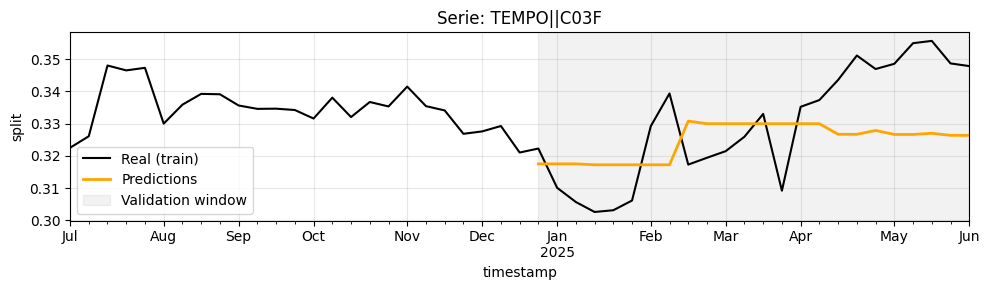

In [20]:
plot_results(predictions_df=f_backtest_predictions, 
             n_val_weeks = 24, 
             real_serie=series_train,
             n_plots=2, 
             specific_series='TEMPO||C03F',
             col='split')

In [21]:
predictions = fit_predict(final_forecaster, series_dict_train, series_dict_test, 
                          exog_dict_train= exog_dict_train, exog_dict_test=exog_dict_test, 
                          steps=8)
predictions

[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] lambda_l1 is set=0.30000000000000004, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.30000000000000004
[LightGBM] [Warning] lambda_l2 is set=0.30000000000000004, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.30000000000000004
[LightGBM] [Warning] bagging_fraction is set=1.0, subsample=1.0 will be ignored. Current value: bagging_fraction=1.0
[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] lambda_l1 is set=0.30000000000000004, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.30000000000000004
[LightGBM] [Warning] lambda_l2 is set=0.30000000000000004, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.30000000000000004
[LightGBM] [Warning] bagging_fraction is set=1.0, subsample=1.0 will be ignored. Current valu

,series_id,pred
2025-06-11,ADROIT||E00A,-4.738467
2025-06-11,ADROIT||E00B,4.683146
2025-06-11,ANGIOGUARD||EM_L81,13.804456
2025-06-11,AQUATRACK||EM_L71,13.804456
2025-06-11,ARC ROYAL||EM_O01_NL,-2.097592
...,...,...
2025-07-30,VISTA BRITE TIP||E02B,-2.267687
2025-07-30,VISTA BRITE TIP||E02C,-2.954559
2025-07-30,WIZDOM||EM_K60,13.879408
2025-07-30,WIZDOM||EM_K60_NL,-13.951886


In [22]:
f_predictions = format_results(predictions,
                               series_dict_test,
                               df_full,
                               'v2')
f_predictions

Global Errors:
Scaled MAE global: 0.1512
MAE global: 0.0063


,timestamp,series_id,pred_s,y_s,abs_error_s,mae_s,pred,y,abs_error,mae
0,2025-06-11,ADROIT||E00A,-4.738467,-4.957418,0.218952,0.604315,8.680365e-03,0.006982,1.698400e-03,3.858915e-03
1,2025-06-11,ADROIT||E00B,4.683146,4.957418,0.274272,0.795420,9.913196e-01,0.993018,1.698400e-03,3.858915e-03
2,2025-06-11,ANGIOGUARD||EM_L81,13.804456,13.815510,0.011054,0.012878,1.000000e+00,1.000000,0.000000e+00,0.000000e+00
3,2025-06-11,AQUATRACK||EM_L71,13.804456,13.815510,0.011054,0.012878,1.000000e+00,1.000000,0.000000e+00,0.000000e+00
4,2025-06-11,ARC ROYAL||EM_O01_NL,-2.097592,-2.107223,0.009631,0.190173,1.075036e-01,0.108397,8.931558e-04,1.571111e-02
...,...,...,...,...,...,...,...,...,...,...
1107,2025-07-30,VISTA BRITE TIP||E02B,-2.267687,-2.219082,0.048605,0.088449,9.915152e-02,0.098050,1.101599e-03,5.271218e-03
1108,2025-07-30,VISTA BRITE TIP||E02C,-2.954559,-3.048787,0.094229,0.160136,5.232748e-02,0.045270,7.057623e-03,9.114100e-03
1109,2025-07-30,WIZDOM||EM_K60,13.879408,13.815510,0.063899,0.076193,9.999991e-01,1.000000,8.725141e-07,8.853618e-07
1110,2025-07-30,WIZDOM||EM_K60_NL,-13.951886,-13.815510,0.136377,0.121790,8.725141e-07,0.000000,8.725141e-07,8.853618e-07


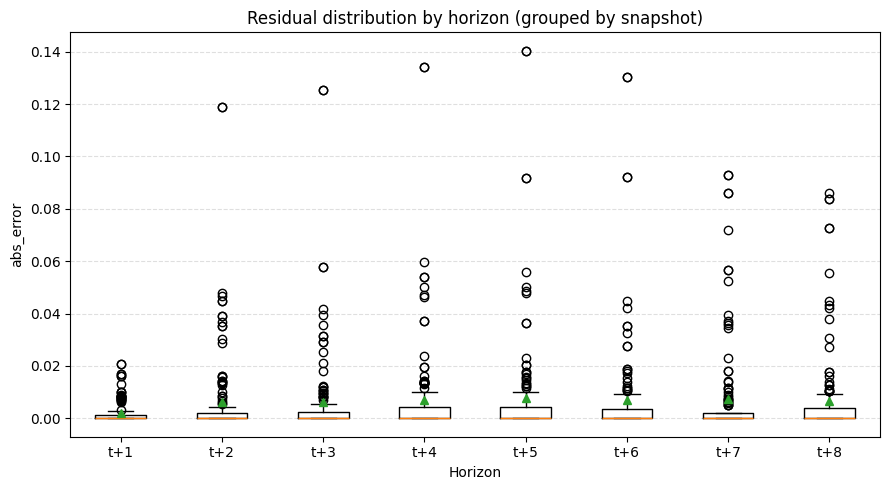

           n      mean  median       std
horizon                                 
t+1      139  0.002186     0.0  0.004481
t+2      139  0.006416     0.0  0.017483
t+3      139  0.006108     0.0  0.017864
t+4      139  0.007064     0.0  0.019470
t+5      139  0.007705     0.0  0.021762
t+6      139  0.006901     0.0  0.020209
t+7      139  0.007242     0.0  0.018738
t+8      139  0.006648     0.0  0.017106


In [27]:
residuals(f_predictions, error_col='abs_error')


Serie: ADROIT||E00A
            y      pred  abs_error
0    0.006982  0.008680   0.001698
139  0.006403  0.008063   0.001660
278  0.004740  0.008936   0.004196
417  0.004539  0.008717   0.004178
556  0.004532  0.008941   0.004409
695  0.004033  0.008837   0.004804
834  0.003920  0.008943   0.005023
973  0.004038  0.008943   0.004905
MAE 0.003859


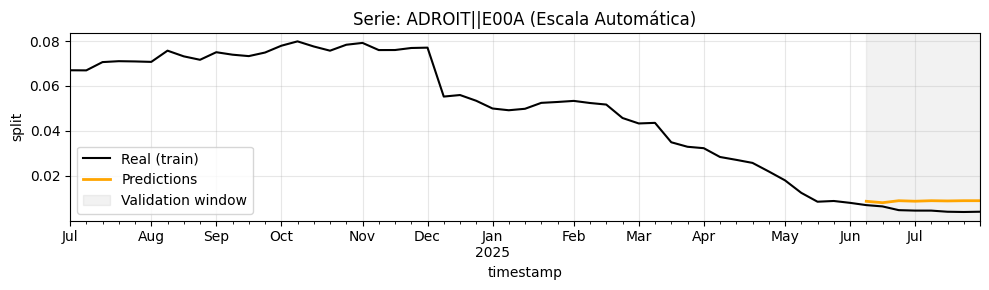

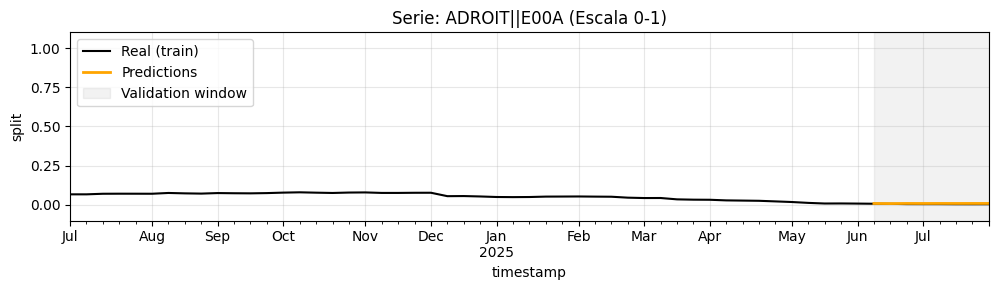


Serie: ADROIT||E00B
            y      pred  abs_error
1    0.993018  0.991320   0.001698
140  0.993597  0.991937   0.001660
279  0.995260  0.991064   0.004196
418  0.995461  0.991283   0.004178
557  0.995468  0.991059   0.004409
696  0.995967  0.991163   0.004804
835  0.996080  0.991057   0.005023
974  0.995962  0.991057   0.004905
MAE 0.003859


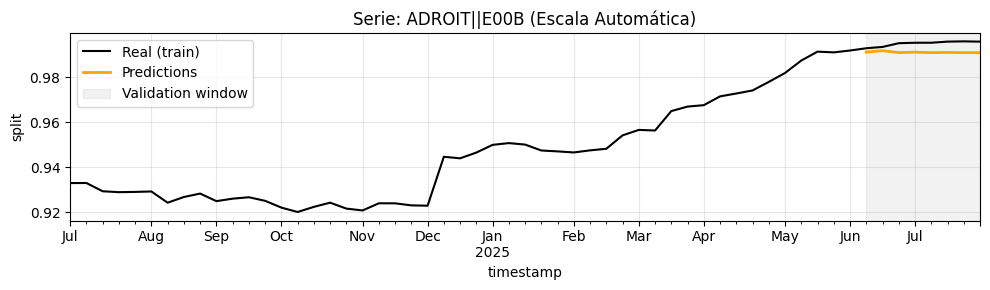

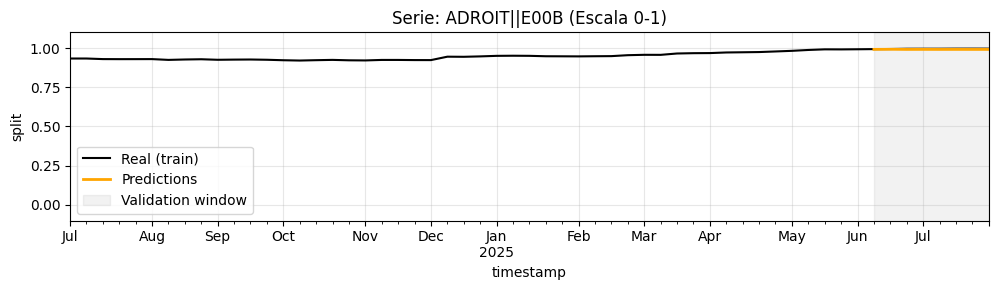


Serie: ANGIOGUARD||EM_L81
       y  pred  abs_error
2    1.0   1.0        0.0
141  1.0   1.0        0.0
280  1.0   1.0        0.0
419  1.0   1.0        0.0
558  1.0   1.0        0.0
697  1.0   1.0        0.0
836  1.0   1.0        0.0
975  1.0   1.0        0.0
MAE 0.000000


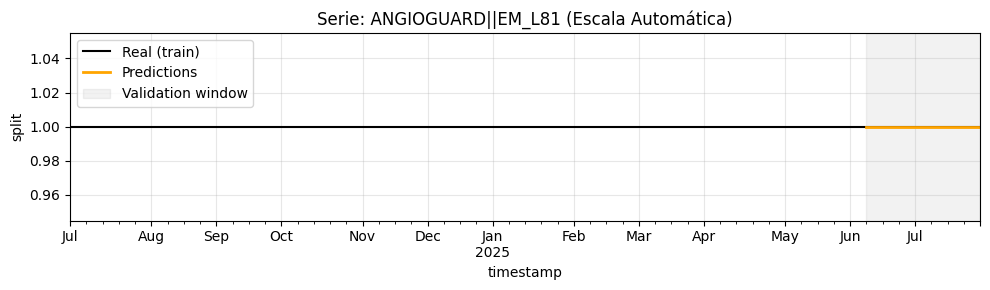

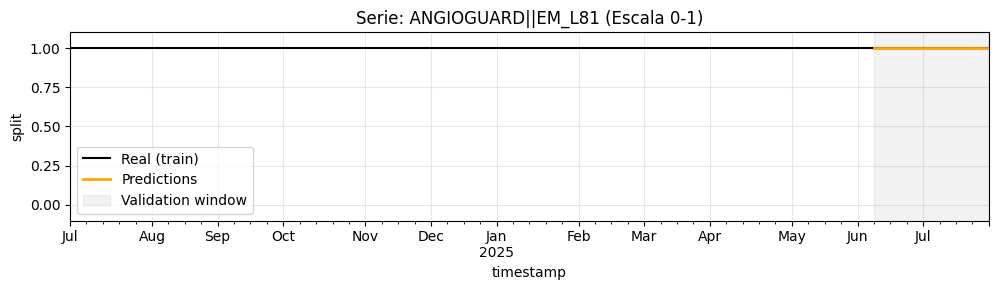


Serie: AQUATRACK||EM_L71
       y  pred  abs_error
3    1.0   1.0        0.0
142  1.0   1.0        0.0
281  1.0   1.0        0.0
420  1.0   1.0        0.0
559  1.0   1.0        0.0
698  1.0   1.0        0.0
837  1.0   1.0        0.0
976  1.0   1.0        0.0
MAE 0.000000


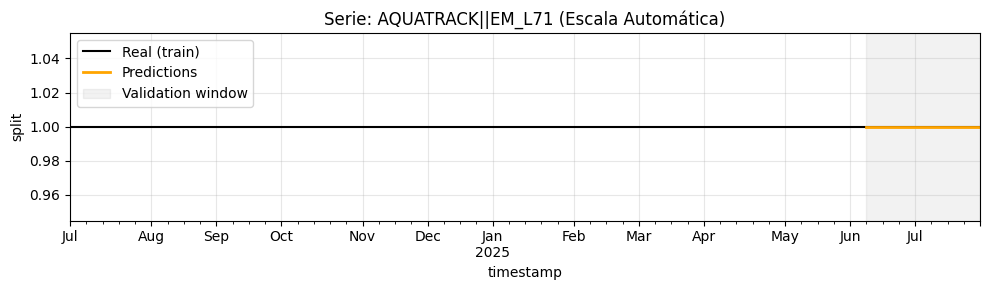

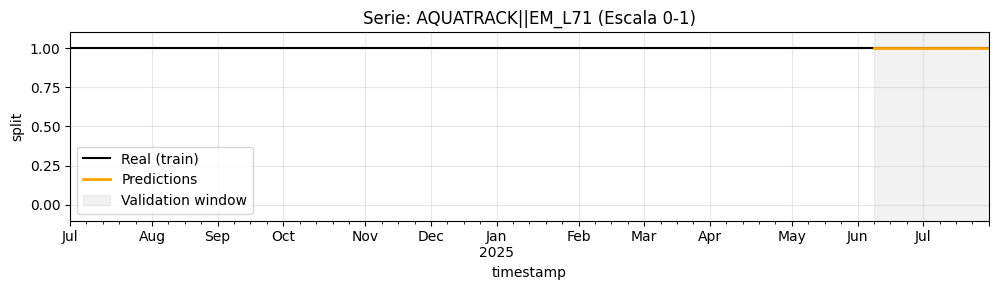


Serie: ARC ROYAL||EM_O01_NL
            y      pred  abs_error
4    0.108397  0.107504   0.000893
143  0.100271  0.108105   0.007833
282  0.097717  0.108134   0.010417
421  0.094940  0.108345   0.013405
560  0.101198  0.108345   0.007146
699  0.090374  0.108345   0.017971
838  0.071060  0.108345   0.037285
977  0.077606  0.108345   0.030739
MAE 0.015711


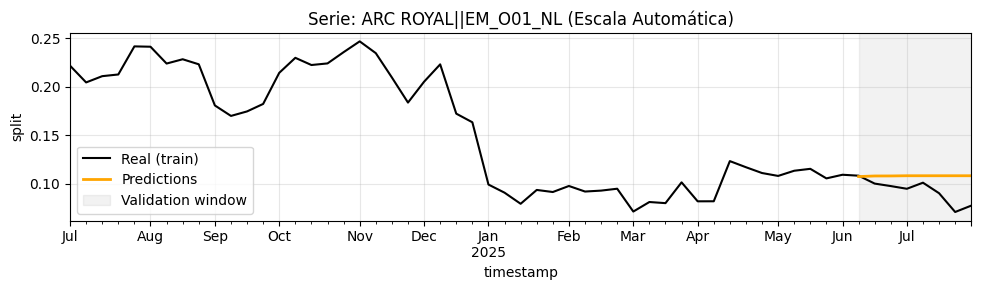

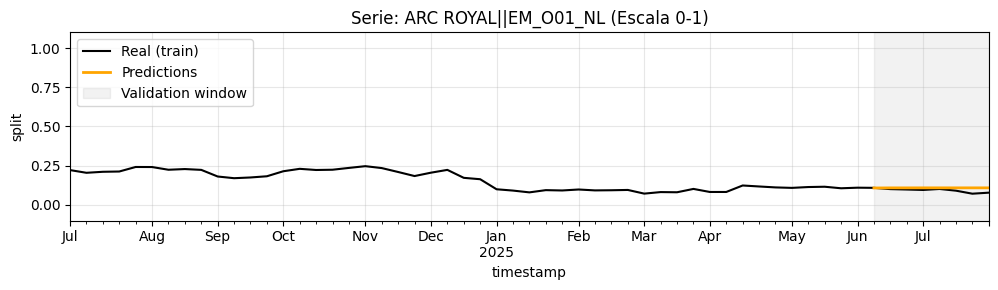


Serie: ARC ROYAL||EM_O02
            y      pred  abs_error
5    0.259510  0.252193   0.007317
144  0.285393  0.248749   0.036644
283  0.283991  0.248329   0.035662
422  0.306466  0.246863   0.059603
561  0.302728  0.246863   0.055866
700  0.252586  0.246863   0.005723
839  0.212242  0.246863   0.034621
978  0.191411  0.246863   0.055452
MAE 0.036361


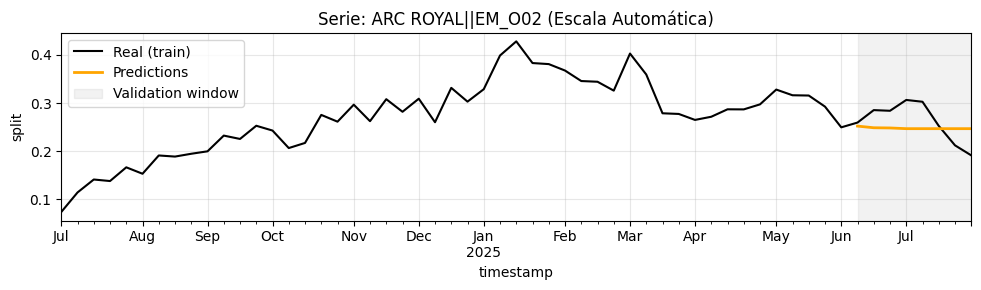

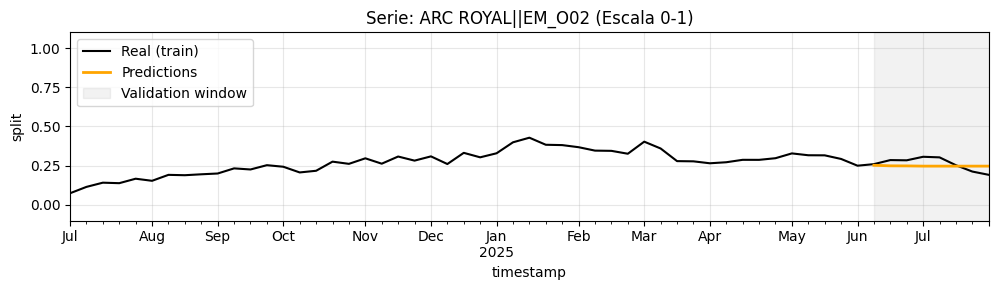


Serie: ARC ROYAL||EM_O02_NL
            y      pred  abs_error
6    0.632093  0.640303   0.008210
145  0.614336  0.643147   0.028811
284  0.618292  0.643537   0.025245
423  0.598594  0.644792   0.046198
562  0.596073  0.644792   0.048719
701  0.657041  0.644792   0.012248
840  0.716698  0.644792   0.071905
979  0.730983  0.644792   0.086190
MAE 0.040941


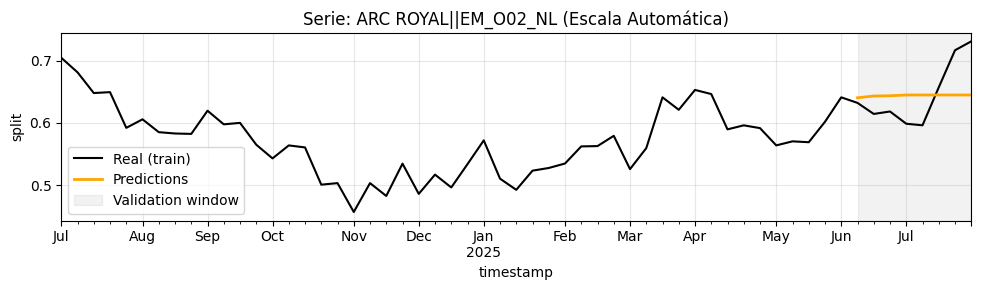

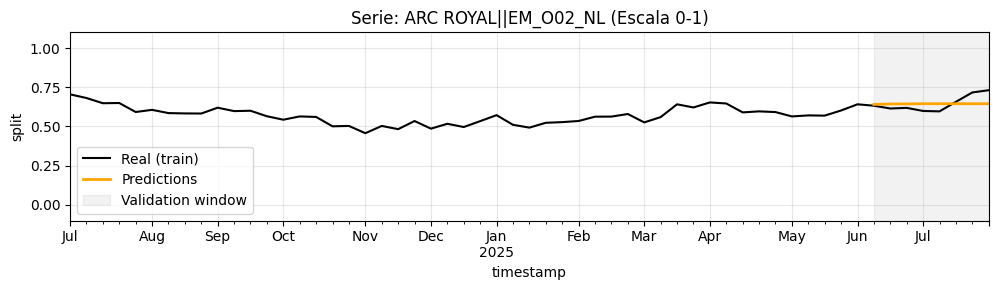


Serie: ATW WIRE||EM_L51
            y      pred  abs_error
9    0.999189  0.999711   0.000522
148  0.999189  0.999730   0.000541
287  0.999201  0.999704   0.000503
426  0.999592  0.999704   0.000113
565  0.999594  0.999704   0.000111
704  0.999619  0.999704   0.000085
843  0.999499  0.999705   0.000207
982  0.999568  0.999705   0.000137
MAE 0.000277


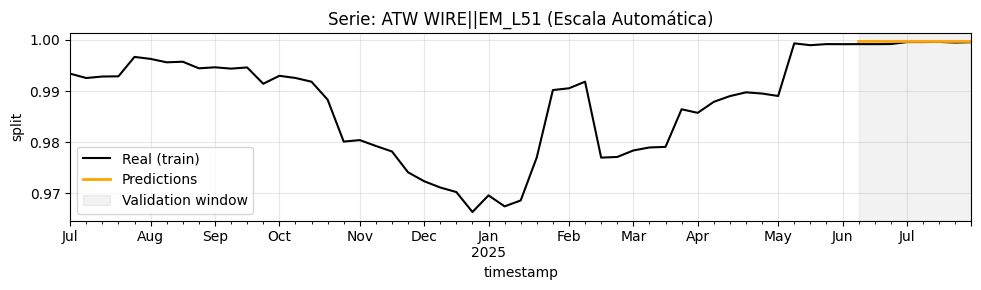

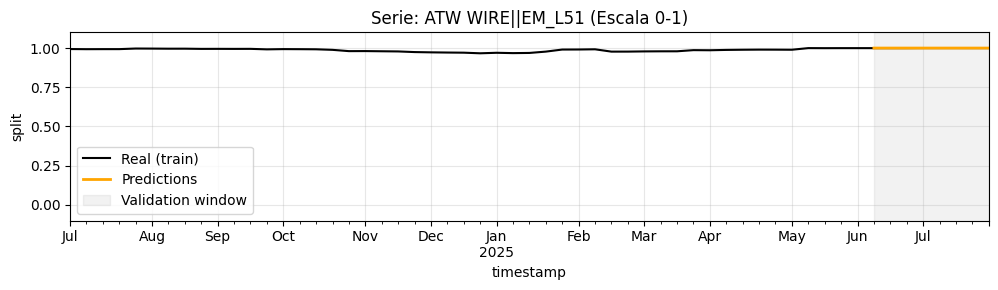


Serie: ATW WIRE||EM_L51_NL
            y      pred  abs_error
10   0.000811  0.000289   0.000522
149  0.000811  0.000270   0.000541
288  0.000799  0.000296   0.000503
427  0.000408  0.000296   0.000113
566  0.000406  0.000296   0.000111
705  0.000381  0.000296   0.000085
844  0.000501  0.000295   0.000207
983  0.000432  0.000295   0.000137
MAE 0.000277


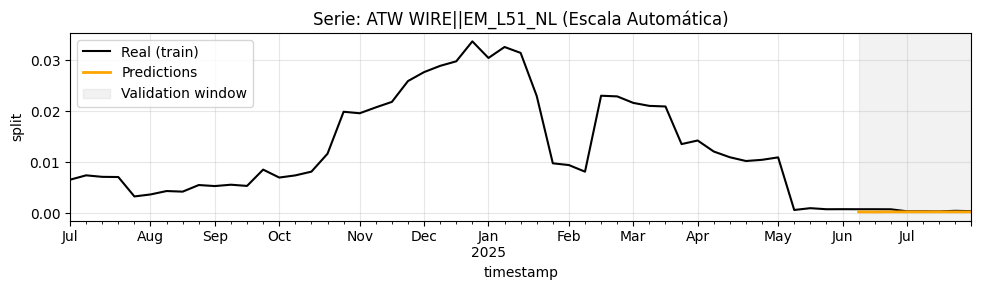

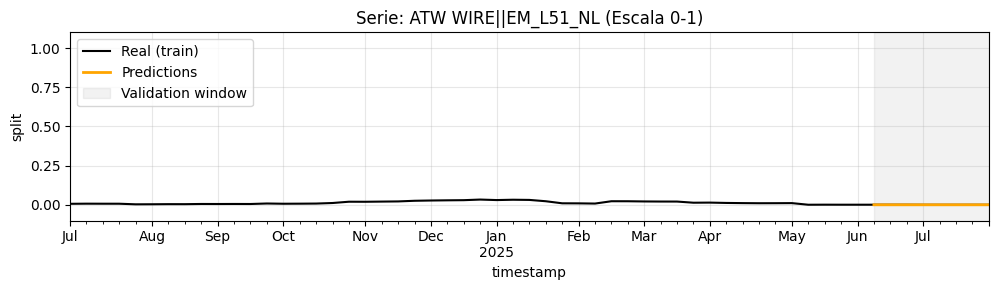


Serie: ATW WIRE MARKER||EM_L51
       y      pred  abs_error
7    1.0  0.999999   0.000001
146  1.0  0.999999   0.000001
285  1.0  0.999999   0.000001
424  1.0  0.999999   0.000001
563  1.0  0.999999   0.000001
702  1.0  0.999999   0.000001
841  1.0  0.999999   0.000001
980  1.0  0.999999   0.000001
MAE 0.000001


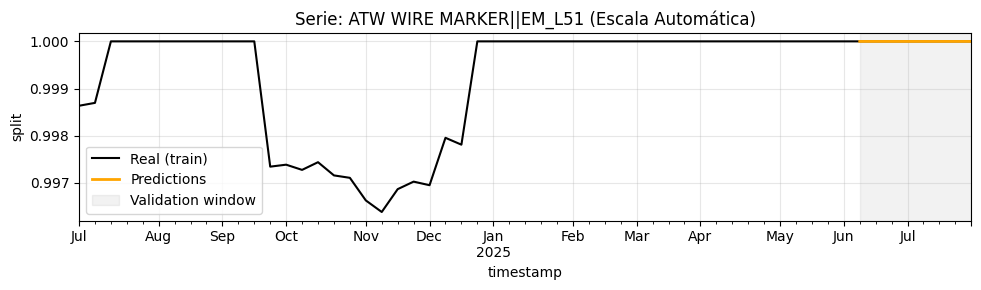

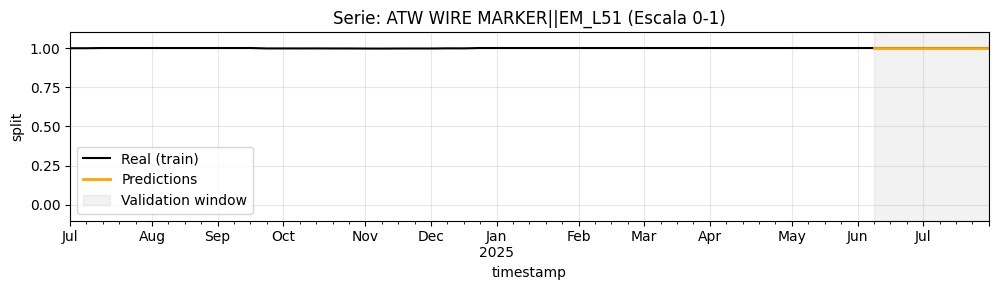


Serie: ATW WIRE MARKER||EM_L51_NL
       y      pred  abs_error
8    0.0  0.000001   0.000001
147  0.0  0.000001   0.000001
286  0.0  0.000001   0.000001
425  0.0  0.000001   0.000001
564  0.0  0.000001   0.000001
703  0.0  0.000001   0.000001
842  0.0  0.000001   0.000001
981  0.0  0.000001   0.000001
MAE 0.000001


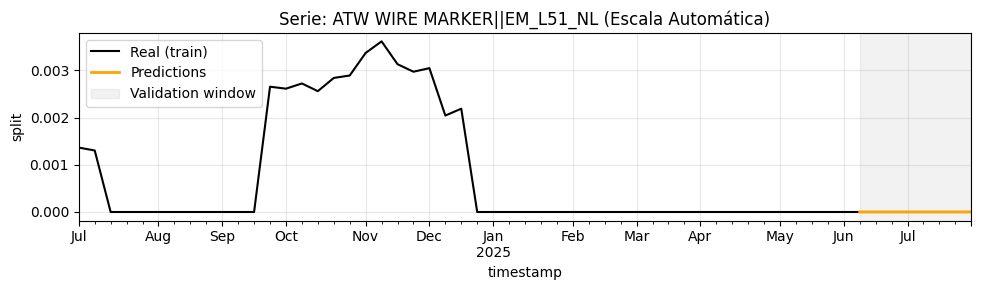

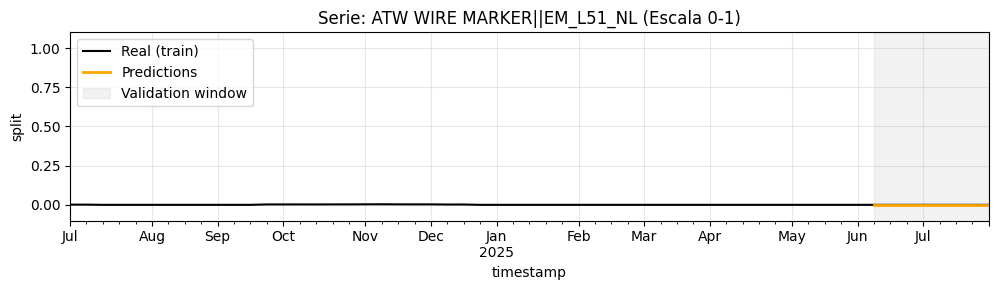


Serie: AVANTI PLUS||A00B
            y      pred  abs_error
11   0.013935  0.015006   0.001071
150  0.013740  0.015006   0.001266
289  0.014249  0.016386   0.002137
428  0.013653  0.016666   0.003013
567  0.014227  0.016679   0.002451
706  0.014022  0.016679   0.002657
845  0.015969  0.016679   0.000710
984  0.015682  0.016679   0.000997
MAE 0.001788


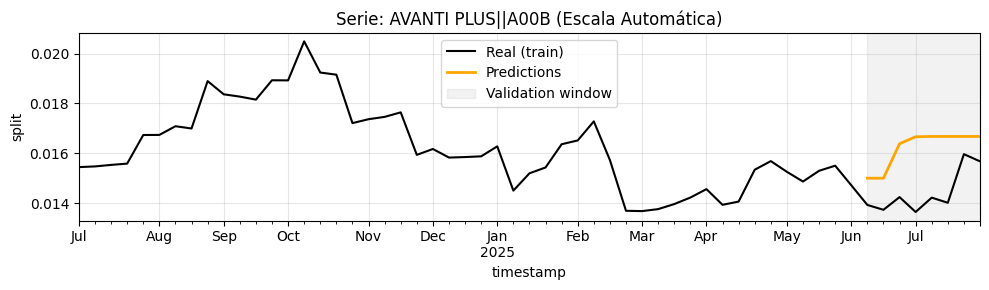

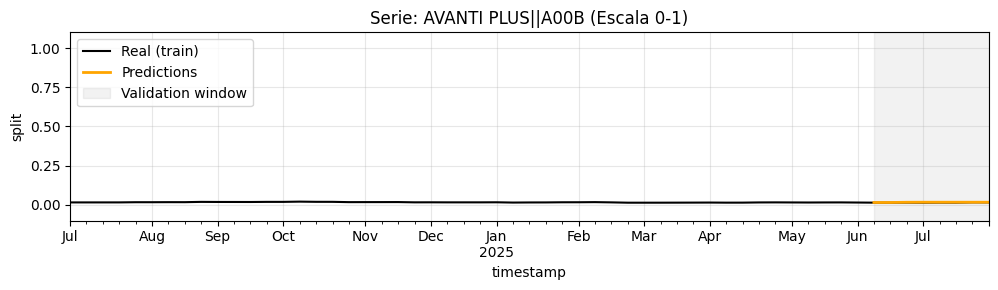


Serie: AVANTI PLUS||A02B
            y      pred  abs_error
12   0.176394  0.182551   0.006157
151  0.230372  0.182551   0.047821
290  0.223678  0.181933   0.041745
429  0.231899  0.181881   0.050018
568  0.232230  0.182020   0.050210
707  0.226759  0.182020   0.044739
846  0.218484  0.182020   0.036463
985  0.225330  0.182020   0.043309
MAE 0.040058


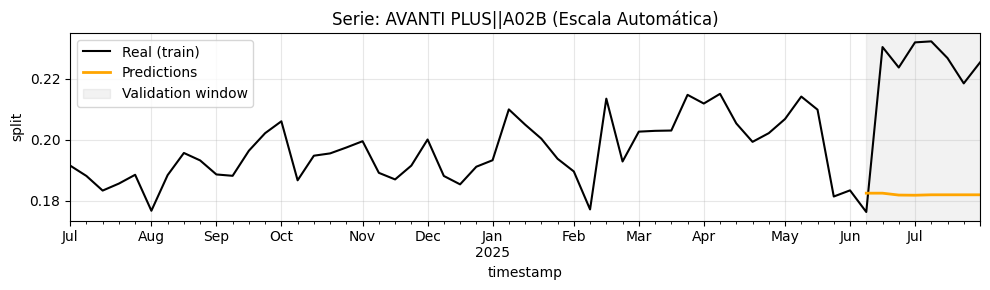

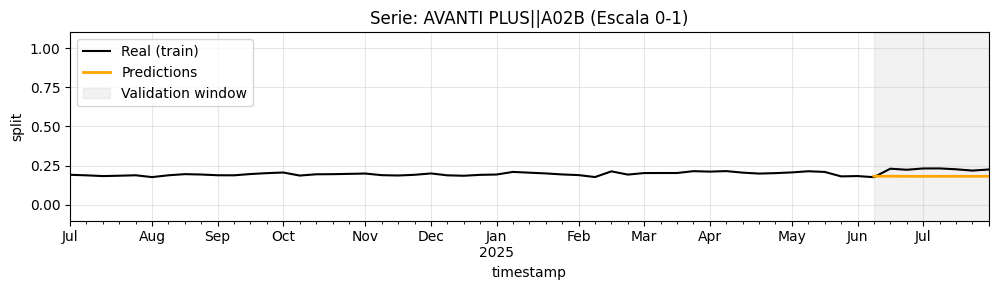


Serie: AVANTI PLUS||A02C
            y      pred  abs_error
13   0.809671  0.802443   0.007228
152  0.755888  0.802443   0.046556
291  0.762073  0.801682   0.039608
430  0.754448  0.801453   0.047005
569  0.753543  0.801301   0.047758
708  0.759219  0.801301   0.042082
847  0.765547  0.801301   0.035753
986  0.758989  0.801301   0.042312
MAE 0.038538


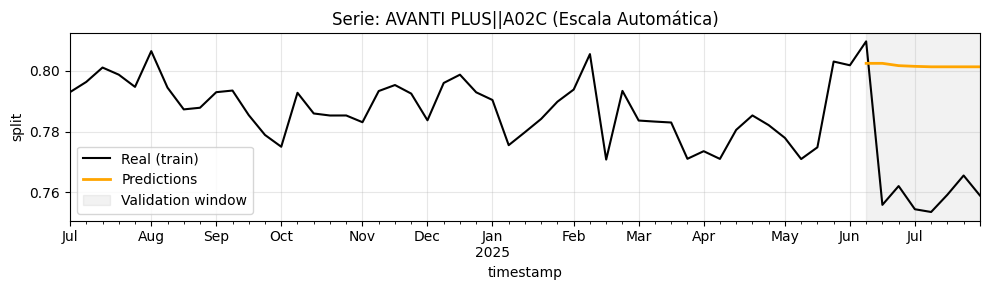

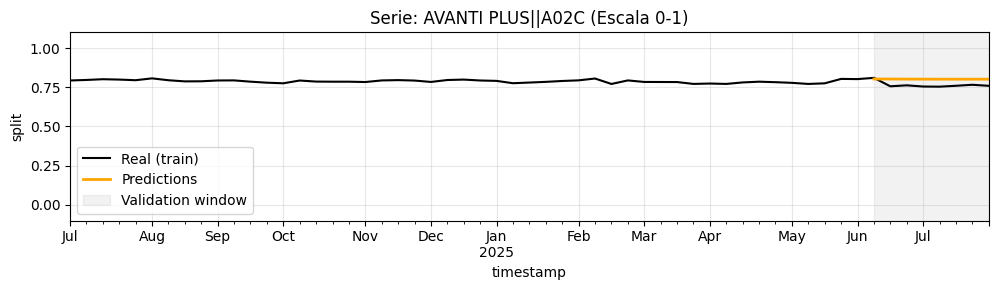


Serie: AVIATOR PLUS||EM_D03
       y  pred  abs_error
14   1.0   1.0        0.0
153  1.0   1.0        0.0
292  1.0   1.0        0.0
431  1.0   1.0        0.0
570  1.0   1.0        0.0
709  1.0   1.0        0.0
848  1.0   1.0        0.0
987  1.0   1.0        0.0
MAE 0.000000


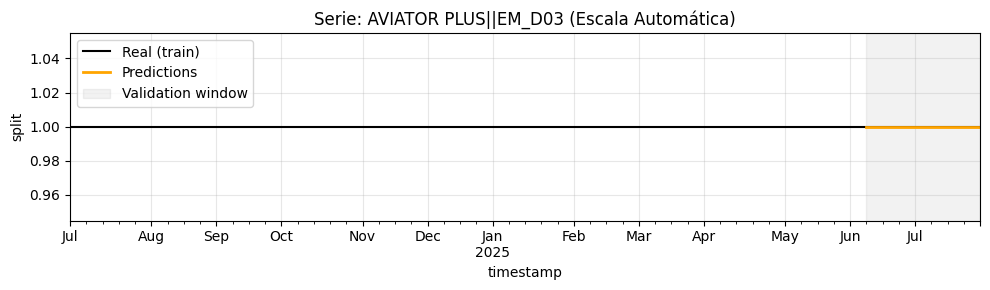

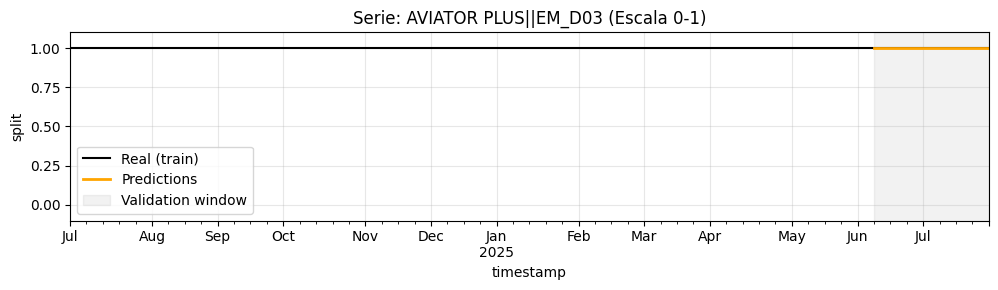


Serie: BIOPSY FORCEPS STD||EM_F20
       y  pred  abs_error
15   1.0   1.0        0.0
154  1.0   1.0        0.0
293  1.0   1.0        0.0
432  1.0   1.0        0.0
571  1.0   1.0        0.0
710  1.0   1.0        0.0
849  1.0   1.0        0.0
988  1.0   1.0        0.0
MAE 0.000000


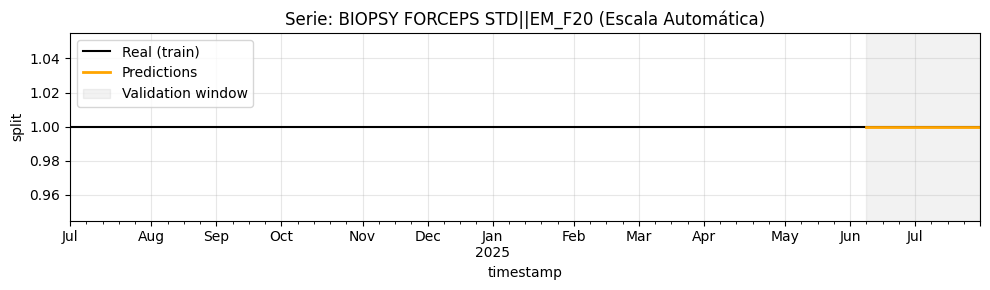

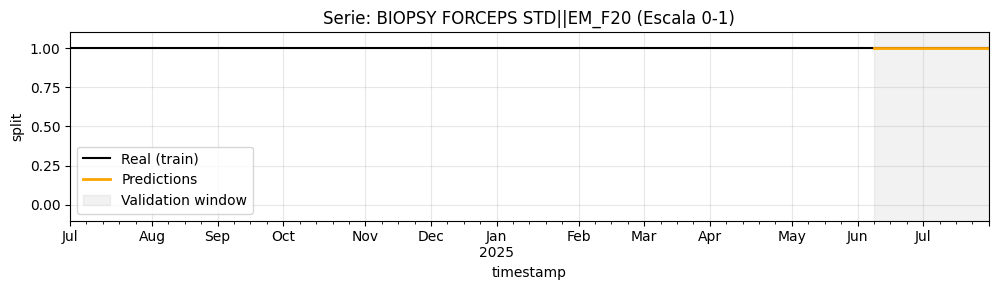


Serie: BIPAL||EM_F10
       y  pred  abs_error
16   1.0   1.0        0.0
155  1.0   1.0        0.0
294  1.0   1.0        0.0
433  1.0   1.0        0.0
572  1.0   1.0        0.0
711  1.0   1.0        0.0
850  1.0   1.0        0.0
989  1.0   1.0        0.0
MAE 0.000000


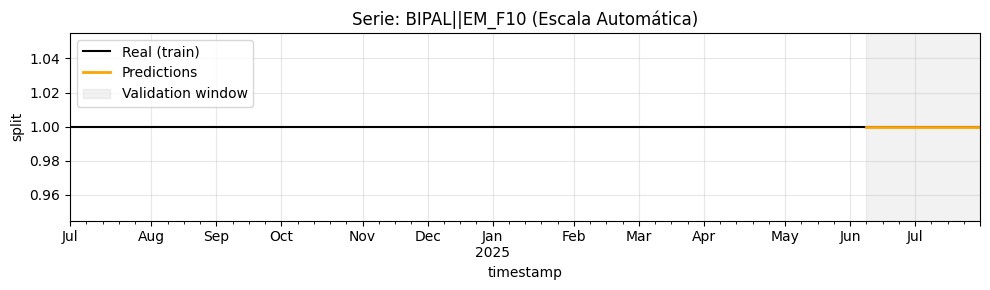

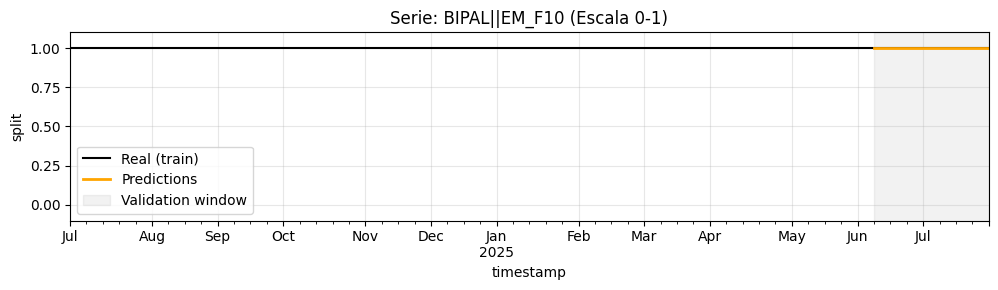


Serie: BLUE on AVIATOR||EM_D03
       y  pred  abs_error
17   1.0   1.0        0.0
156  1.0   1.0        0.0
295  1.0   1.0        0.0
434  1.0   1.0        0.0
573  1.0   1.0        0.0
712  1.0   1.0        0.0
851  1.0   1.0        0.0
990  1.0   1.0        0.0
MAE 0.000000


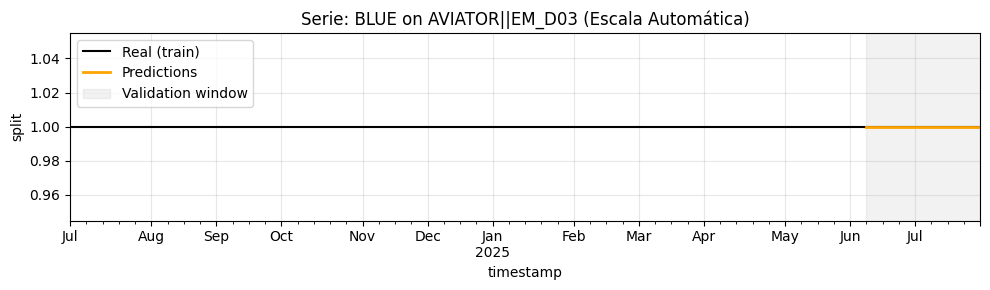

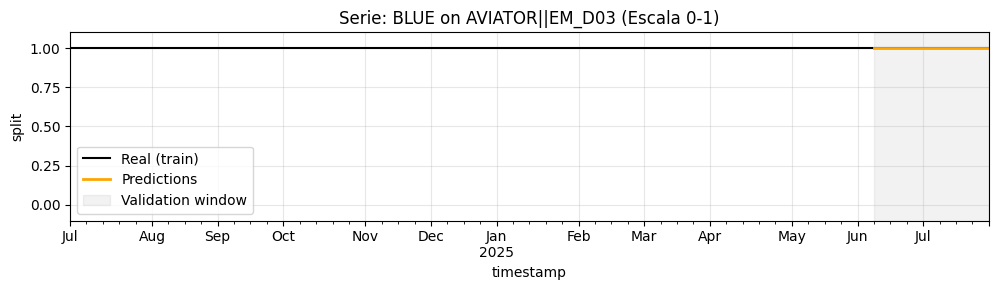


Serie: BLUE on SLALOM||EM_D03
       y  pred  abs_error
18   1.0   1.0        0.0
157  1.0   1.0        0.0
296  1.0   1.0        0.0
435  1.0   1.0        0.0
574  1.0   1.0        0.0
713  1.0   1.0        0.0
852  1.0   1.0        0.0
991  1.0   1.0        0.0
MAE 0.000000


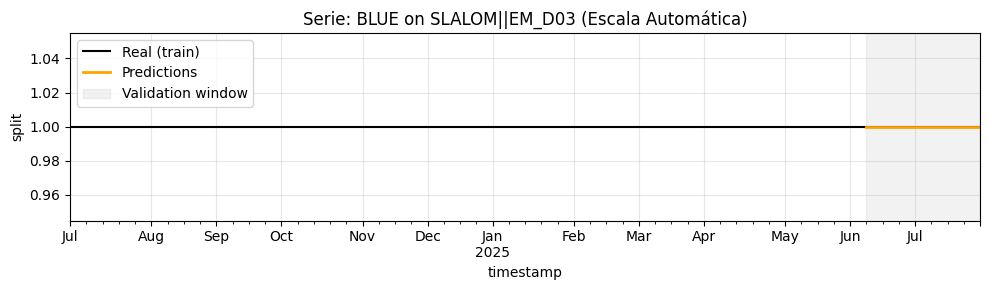

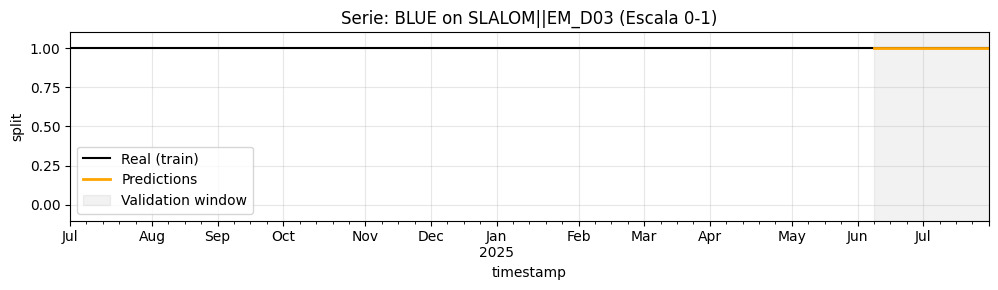


Serie: BRITE TIP||A00A
            y      pred  abs_error
22   0.280033  0.277464   0.002569
161  0.265958  0.280247   0.014289
300  0.265945  0.276768   0.010823
439  0.266719  0.280032   0.013313
578  0.271136  0.276768   0.005632
717  0.269281  0.280032   0.010751
856  0.270696  0.276768   0.006072
995  0.267288  0.280032   0.012744
MAE 0.009524


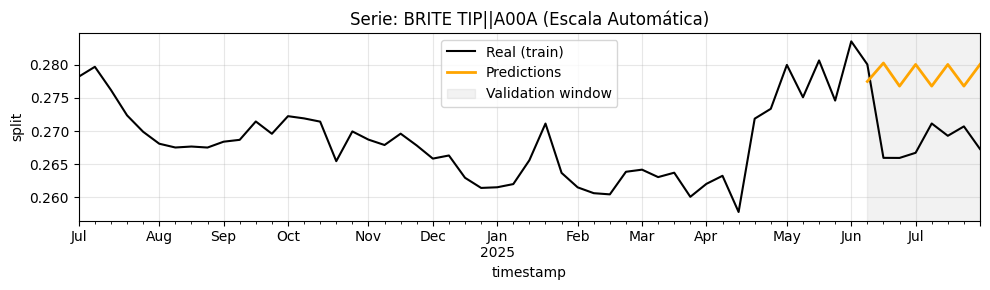

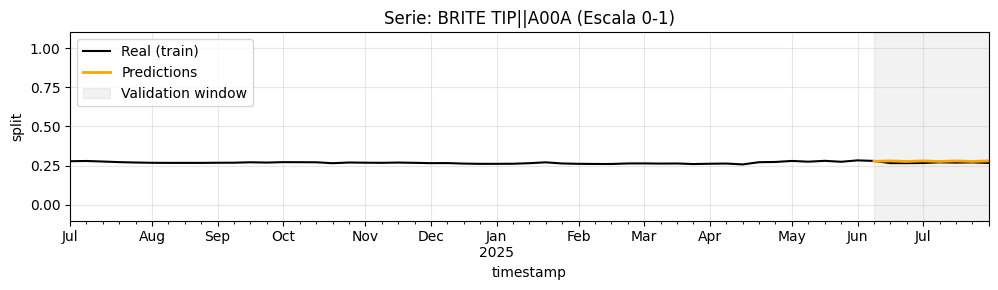


Serie: BRITE TIP||A02A
            y      pred  abs_error
23   0.719967  0.722536   0.002569
162  0.734042  0.719753   0.014289
301  0.734055  0.723232   0.010823
440  0.733281  0.719968   0.013313
579  0.728864  0.723232   0.005632
718  0.730719  0.719968   0.010751
857  0.729304  0.723232   0.006072
996  0.732712  0.719968   0.012744
MAE 0.009524


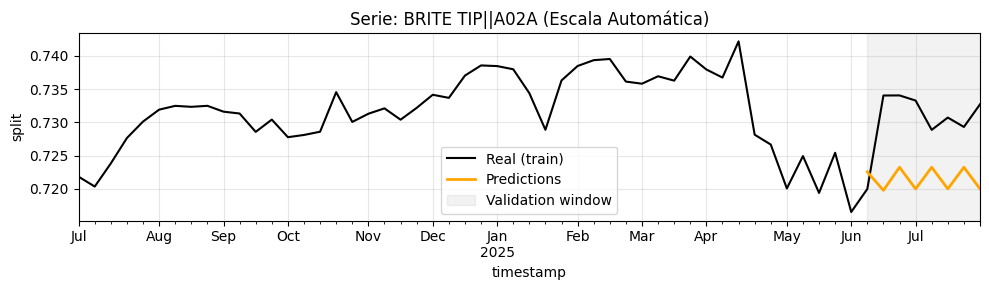

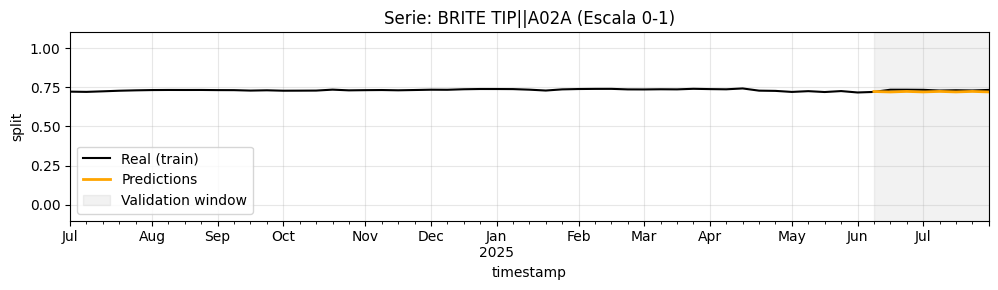


Serie: BRITE TIP (MODIFIED)||A00B
            y      pred  abs_error
19   0.860563  0.881213   0.020649
158  0.867733  0.881287   0.013554
297  0.882353  0.881760   0.000592
436  0.926045  0.872216   0.053829
575  0.973289  0.881507   0.091782
714  0.974277  0.882082   0.092195
853  0.974882  0.882082   0.092801
992  0.863905  0.881760   0.017855
MAE 0.047907


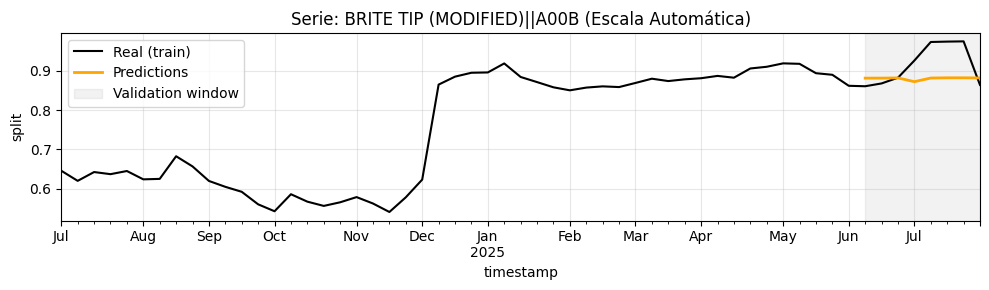

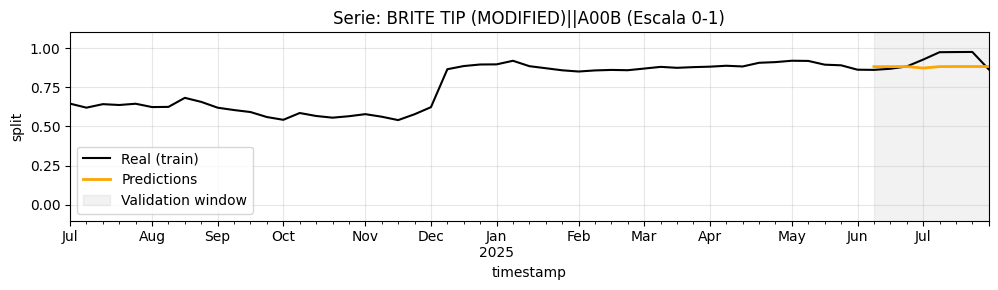


Serie: BRITE TIP (MODIFIED)||A02C
            y      pred  abs_error
20   0.139437  0.118787   0.020649
159  0.132267  0.118713   0.013554
298  0.117647  0.118240   0.000592
437  0.073955  0.127784   0.053829
576  0.026711  0.118493   0.091782
715  0.025723  0.117918   0.092195
854  0.025118  0.117918   0.092801
993  0.136095  0.118240   0.017855
MAE 0.047907


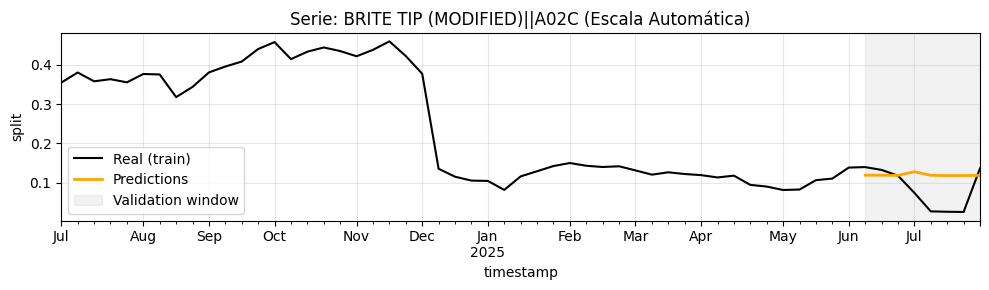

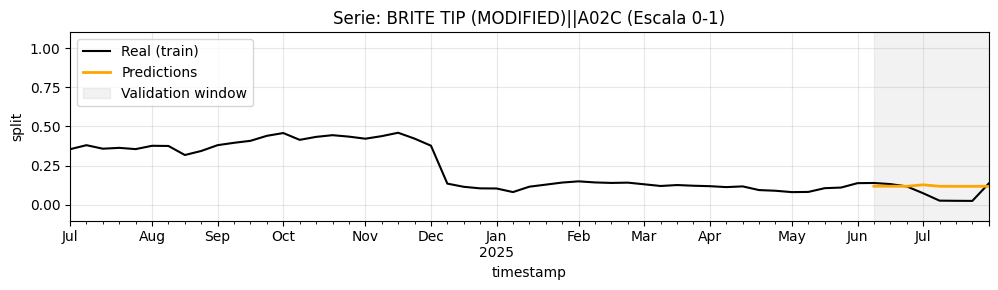


Serie: BRITE TIP RADIANZ||T03
       y  pred  abs_error
21   1.0   1.0        0.0
160  1.0   1.0        0.0
299  1.0   1.0        0.0
438  1.0   1.0        0.0
577  1.0   1.0        0.0
716  1.0   1.0        0.0
855  1.0   1.0        0.0
994  1.0   1.0        0.0
MAE 0.000000


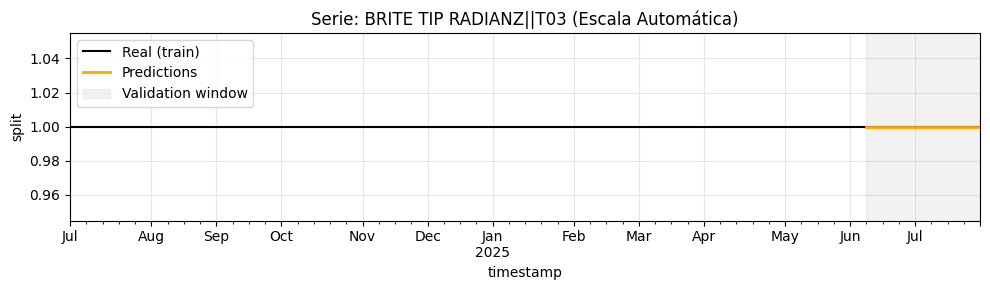

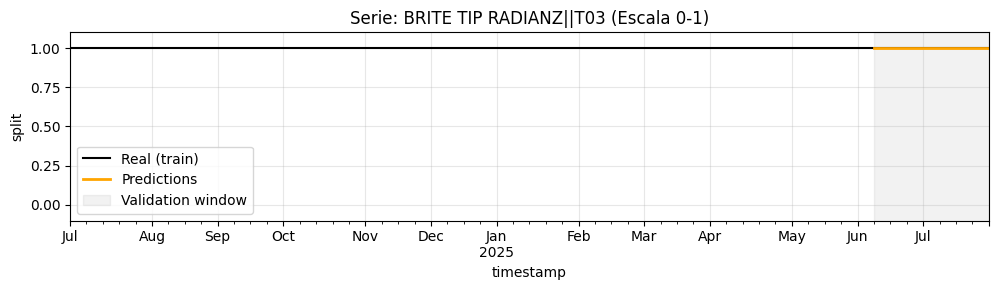


Serie: BriteCross Support Catheters||EM_O92
       y  pred  abs_error
24   1.0   1.0        0.0
163  1.0   1.0        0.0
302  1.0   1.0        0.0
441  1.0   1.0        0.0
580  1.0   1.0        0.0
719  1.0   1.0        0.0
858  1.0   1.0        0.0
997  1.0   1.0        0.0
MAE 0.000000


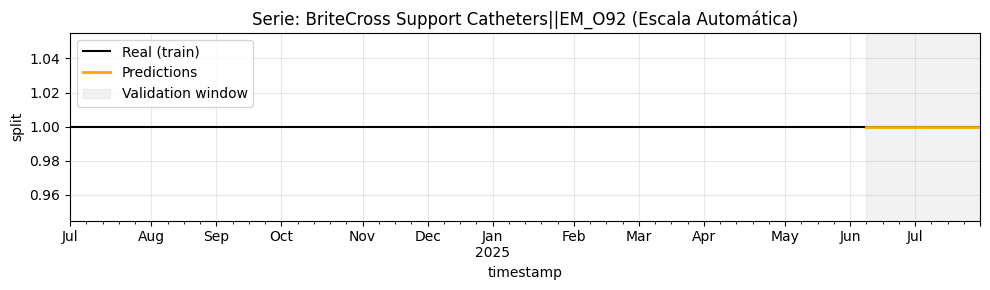

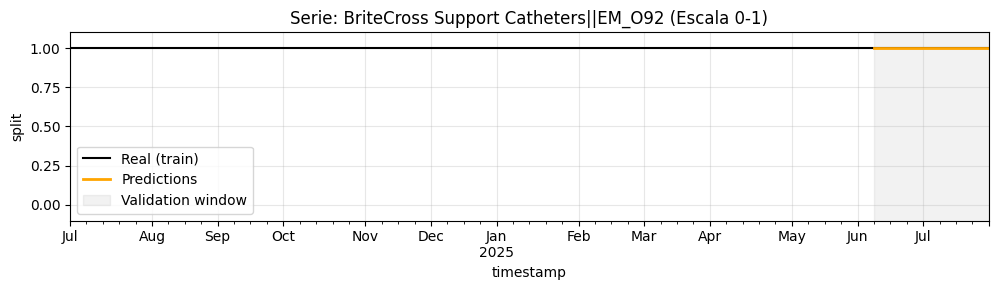


Serie: CATH EXT||C05
       y  pred  abs_error
25   1.0   1.0        0.0
164  1.0   1.0        0.0
303  1.0   1.0        0.0
442  1.0   1.0        0.0
581  1.0   1.0        0.0
720  1.0   1.0        0.0
859  1.0   1.0        0.0
998  1.0   1.0        0.0
MAE 0.000000


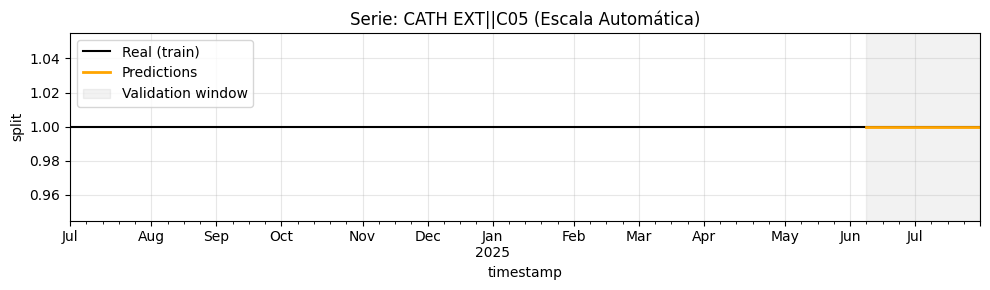

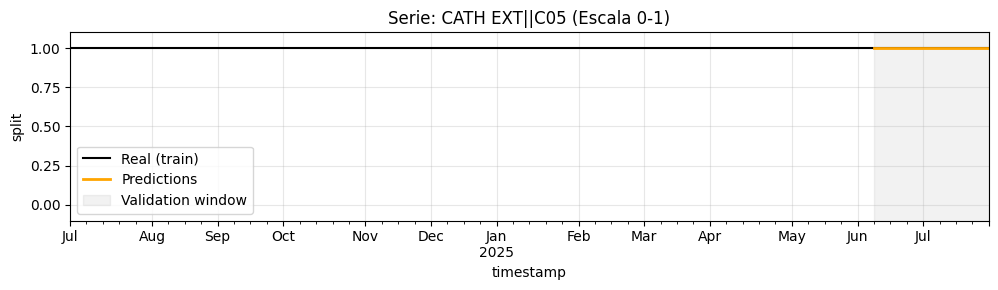


Serie: CORPACK||C04B
        y  pred  abs_error
27    1.0   1.0        0.0
166   1.0   1.0        0.0
305   1.0   1.0        0.0
444   1.0   1.0        0.0
583   1.0   1.0        0.0
722   1.0   1.0        0.0
861   1.0   1.0        0.0
1000  1.0   1.0        0.0
MAE 0.000000


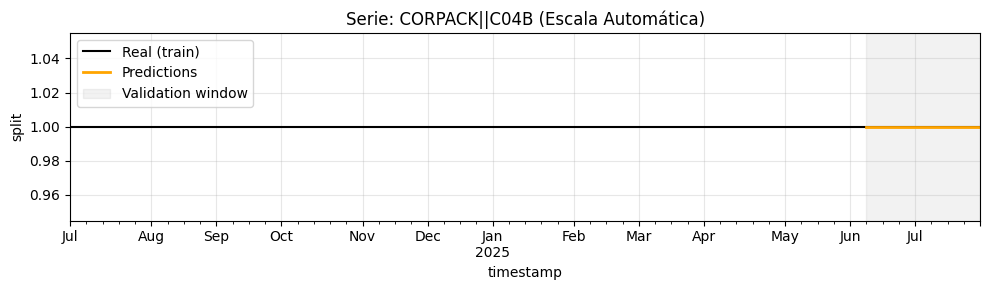

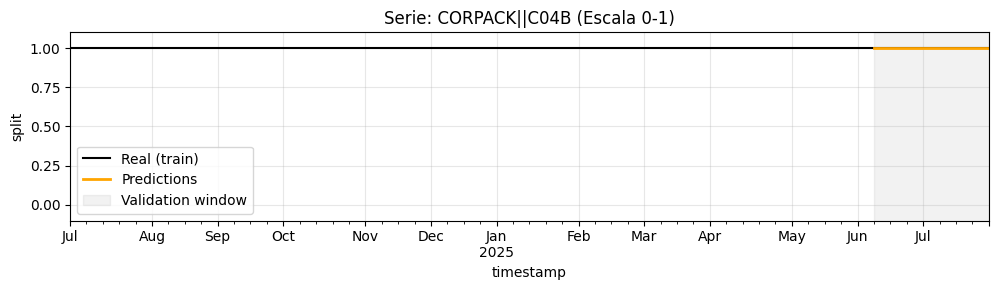


Serie: CORPACK (MODIFIED)||C04B
       y  pred  abs_error
26   1.0   1.0        0.0
165  1.0   1.0        0.0
304  1.0   1.0        0.0
443  1.0   1.0        0.0
582  1.0   1.0        0.0
721  1.0   1.0        0.0
860  1.0   1.0        0.0
999  1.0   1.0        0.0
MAE 0.000000


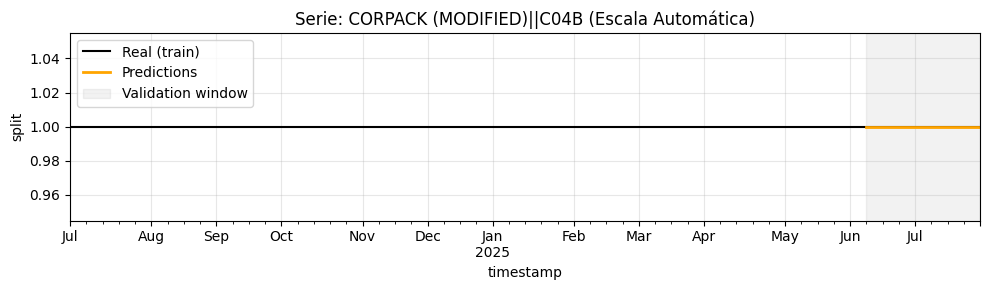

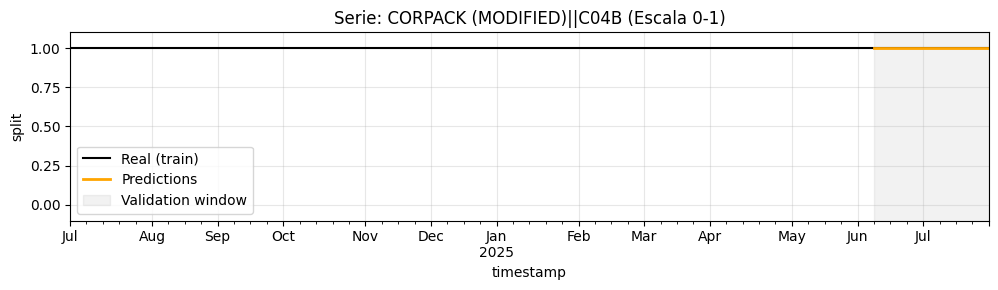


Serie: ELITECROSS||EM_X12
        y  pred  abs_error
28    1.0   1.0        0.0
167   1.0   1.0        0.0
306   1.0   1.0        0.0
445   1.0   1.0        0.0
584   1.0   1.0        0.0
723   1.0   1.0        0.0
862   1.0   1.0        0.0
1001  1.0   1.0        0.0
MAE 0.000000


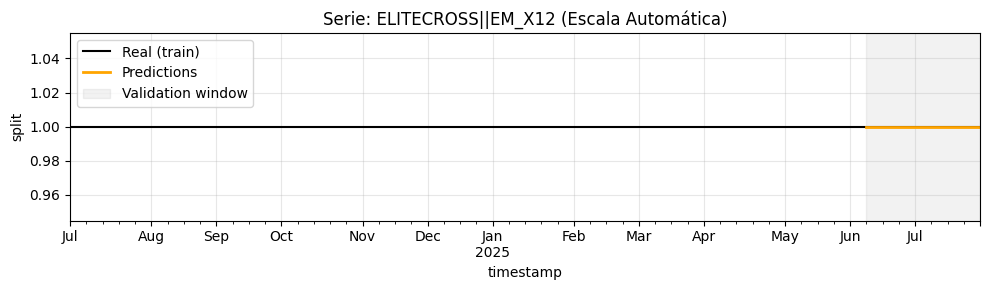

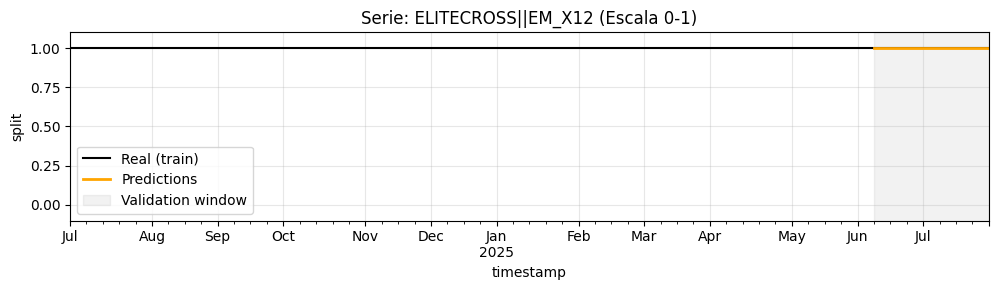


Serie: EMERALD||EM_L01
             y      pred  abs_error
29    0.850336  0.841797   0.008539
168   0.857978  0.841666   0.016312
307   0.851640  0.841813   0.009827
446   0.855463  0.841813   0.013651
585   0.854299  0.841813   0.012486
724   0.850974  0.841813   0.009161
863   0.840776  0.841813   0.001036
1002  0.842447  0.841813   0.000634
MAE 0.008956


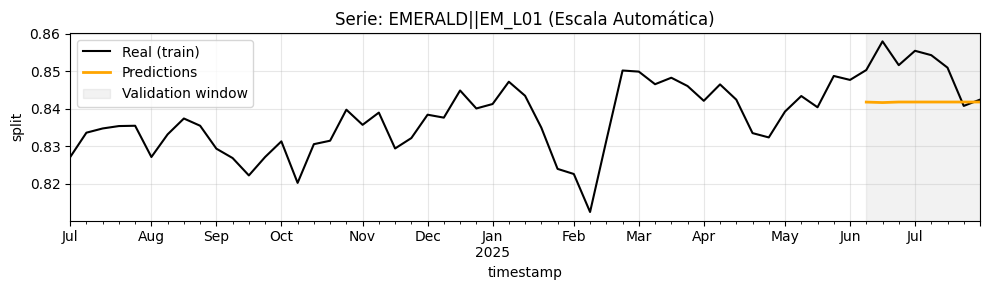

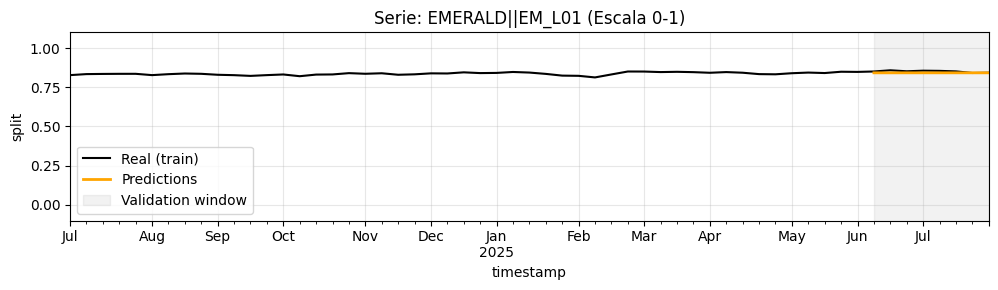


Serie: EMERALD||EM_L01_NL
             y      pred  abs_error
30    0.149664  0.158203   0.008539
169   0.142022  0.158334   0.016312
308   0.148360  0.158187   0.009827
447   0.144537  0.158187   0.013651
586   0.145701  0.158187   0.012486
725   0.149026  0.158187   0.009161
864   0.159224  0.158187   0.001036
1003  0.157553  0.158187   0.000634
MAE 0.008956


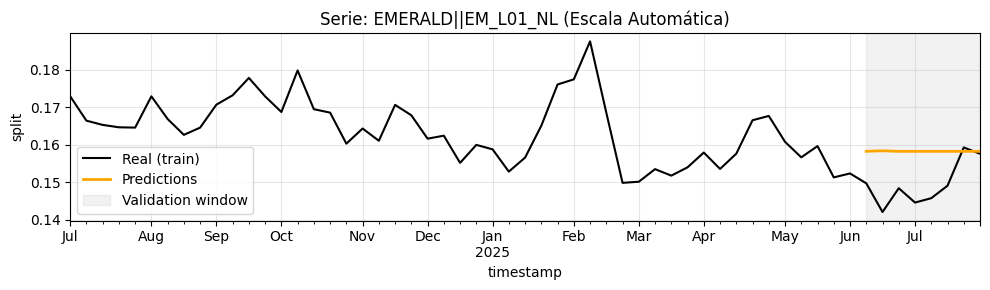

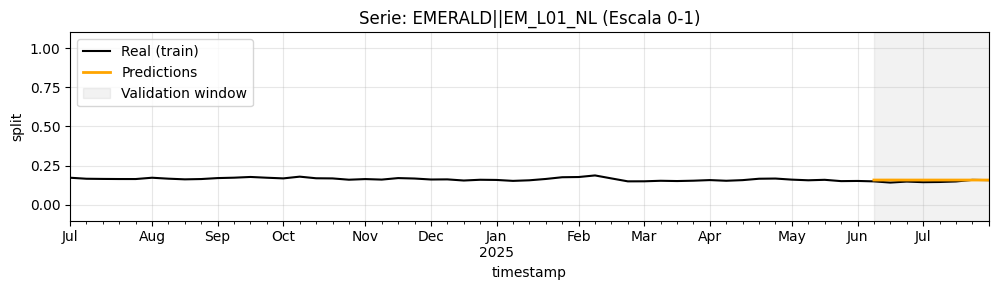


Serie: ENROUTE||T02B
        y  pred  abs_error
31    1.0   1.0        0.0
170   1.0   1.0        0.0
309   1.0   1.0        0.0
448   1.0   1.0        0.0
587   1.0   1.0        0.0
726   1.0   1.0        0.0
865   1.0   1.0        0.0
1004  1.0   1.0        0.0
MAE 0.000000


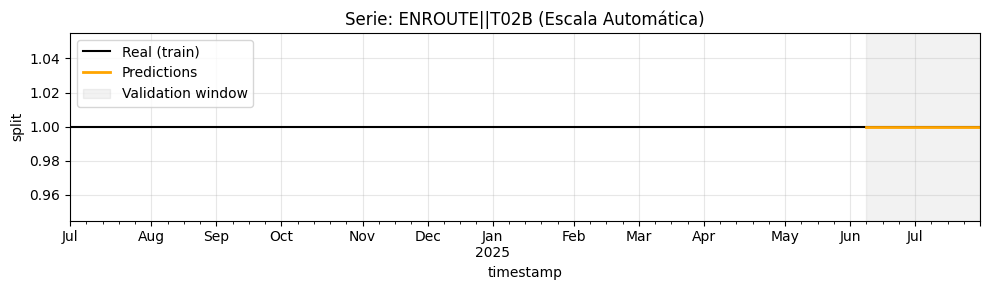

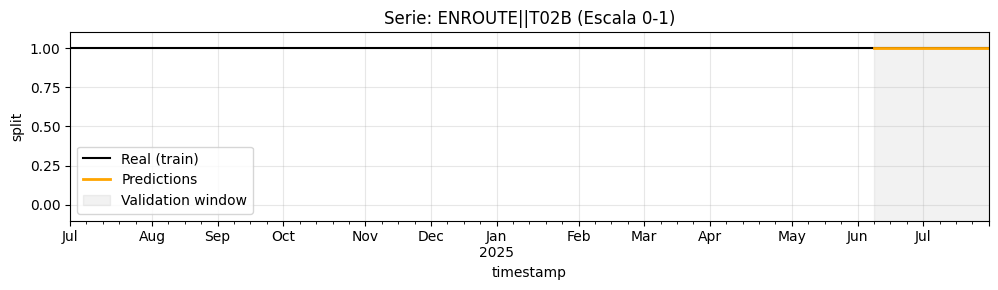


Serie: EXOSEAL||V00
        y  pred  abs_error
32    1.0   1.0        0.0
171   1.0   1.0        0.0
310   1.0   1.0        0.0
449   1.0   1.0        0.0
588   1.0   1.0        0.0
727   1.0   1.0        0.0
866   1.0   1.0        0.0
1005  1.0   1.0        0.0
MAE 0.000000


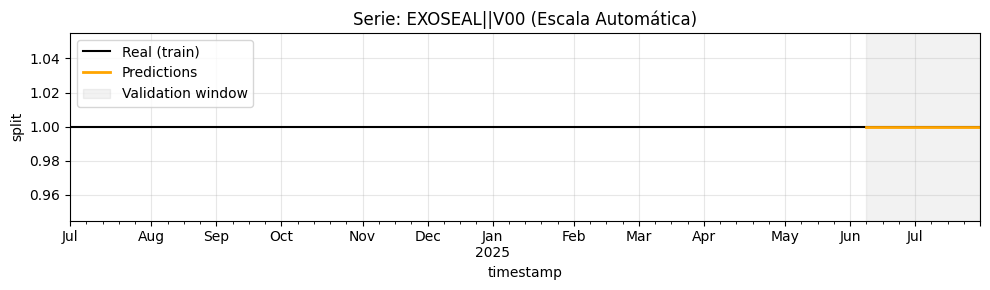

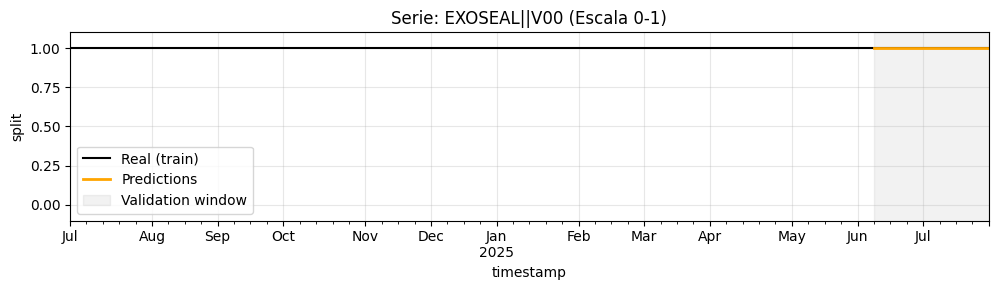


Serie: FRONTRUNNER||X00
        y  pred  abs_error
33    1.0   1.0        0.0
172   1.0   1.0        0.0
311   1.0   1.0        0.0
450   1.0   1.0        0.0
589   1.0   1.0        0.0
728   1.0   1.0        0.0
867   1.0   1.0        0.0
1006  1.0   1.0        0.0
MAE 0.000000


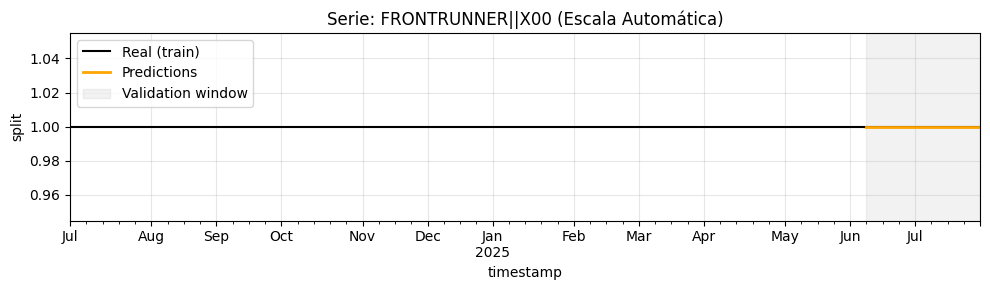

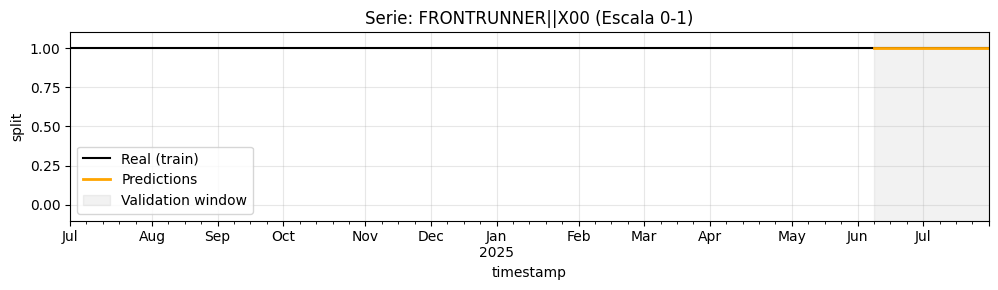


Serie: GENESIS UNMOUNTED||EM_D03
             y      pred  abs_error
34    0.321755  0.324200   0.002445
173   0.325279  0.324200   0.001079
312   0.381783  0.324014   0.057769
451   0.338374  0.324014   0.014360
590   0.344231  0.324014   0.020217
729   0.324165  0.324014   0.000151
868   0.267477  0.324014   0.056537
1007  0.251170  0.324014   0.072844
MAE 0.028175


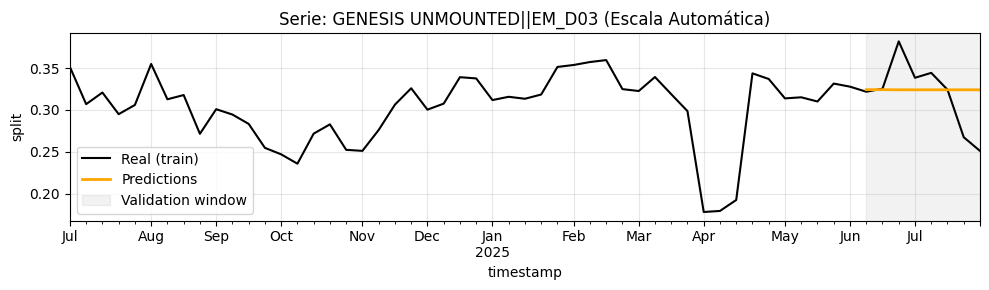

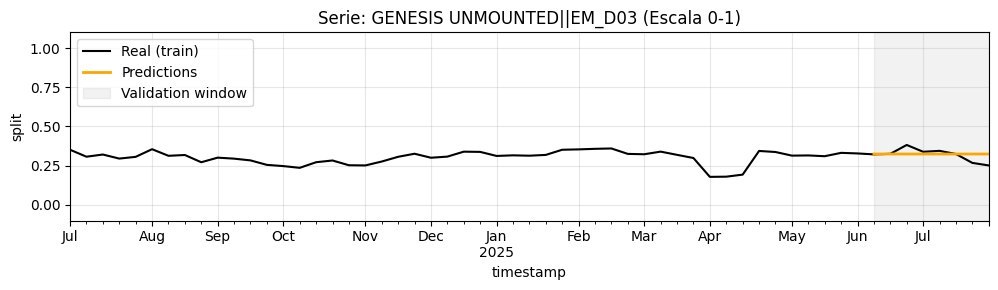


Serie: GENESIS UNMOUNTED||EM_U90
             y      pred  abs_error
35    0.678245  0.675800   0.002445
174   0.674721  0.675800   0.001079
313   0.618217  0.675986   0.057769
452   0.661626  0.675986   0.014360
591   0.655769  0.675986   0.020217
730   0.675835  0.675986   0.000151
869   0.732523  0.675986   0.056537
1008  0.748830  0.675986   0.072844
MAE 0.028175


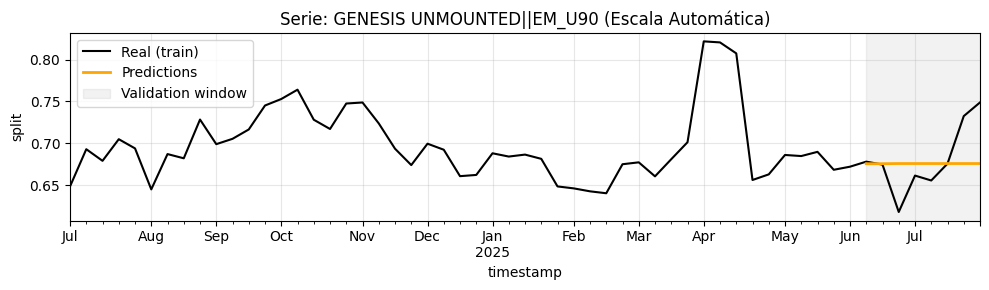

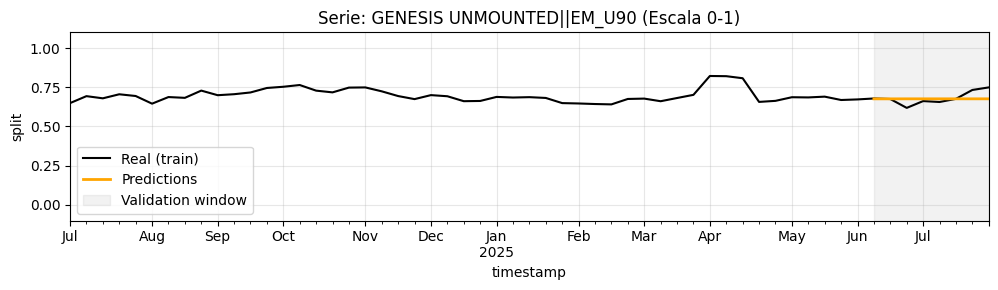


Serie: GENESIS on PRO||EM_D01
        y  pred  abs_error
36    1.0   1.0        0.0
175   1.0   1.0        0.0
314   1.0   1.0        0.0
453   1.0   1.0        0.0
592   1.0   1.0        0.0
731   1.0   1.0        0.0
870   1.0   1.0        0.0
1009  1.0   1.0        0.0
MAE 0.000000


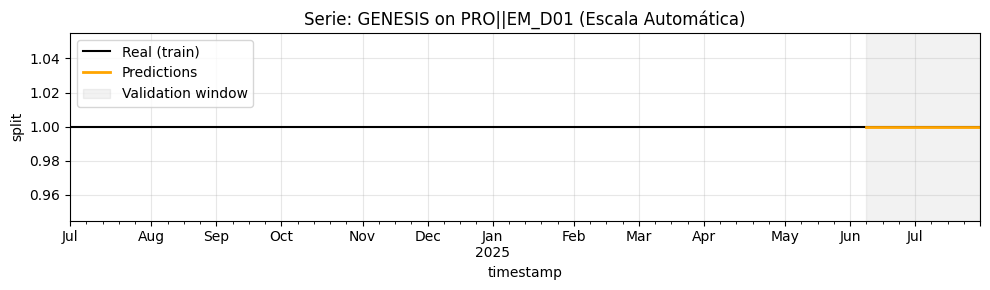

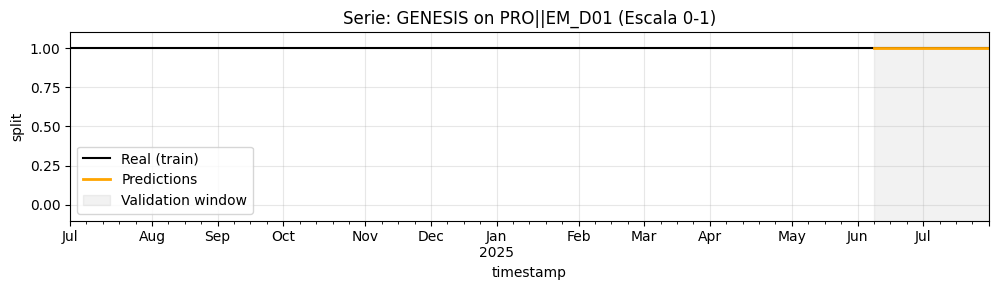


Serie: GENESIS on SLALOM||EM_D03
        y  pred  abs_error
37    1.0   1.0        0.0
176   1.0   1.0        0.0
315   1.0   1.0        0.0
454   1.0   1.0        0.0
593   1.0   1.0        0.0
732   1.0   1.0        0.0
871   1.0   1.0        0.0
1010  1.0   1.0        0.0
MAE 0.000000


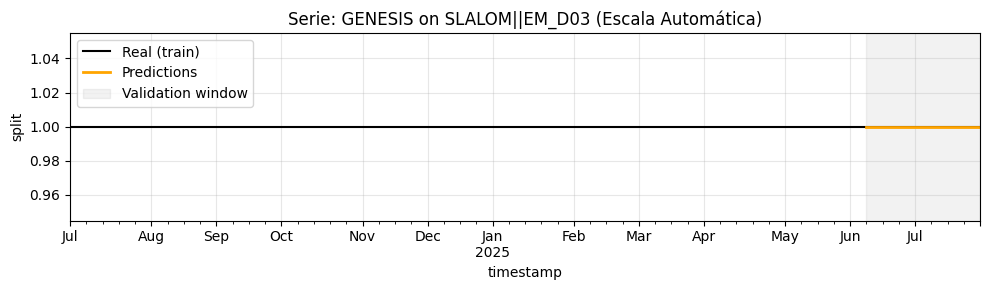

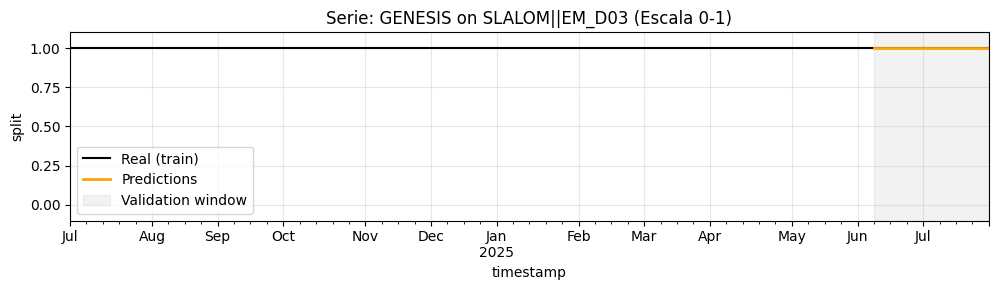


Serie: HIGH FLOW||C04D
        y  pred  abs_error
38    1.0   1.0        0.0
177   1.0   1.0        0.0
316   1.0   1.0        0.0
455   1.0   1.0        0.0
594   1.0   1.0        0.0
733   1.0   1.0        0.0
872   1.0   1.0        0.0
1011  1.0   1.0        0.0
MAE 0.000000


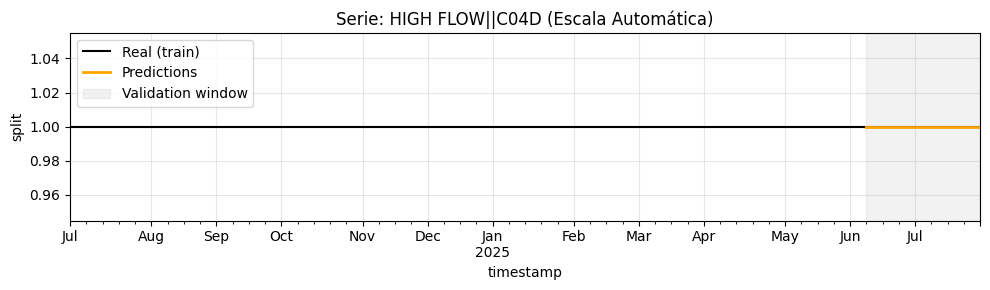

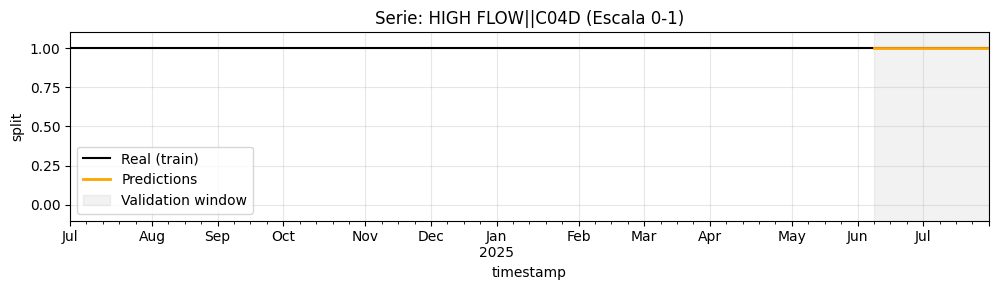


Serie: IKAZUCHI ZERO||EM_O84_NL_CN
        y  pred  abs_error
39    1.0   1.0        0.0
178   1.0   1.0        0.0
317   1.0   1.0        0.0
456   1.0   1.0        0.0
595   1.0   1.0        0.0
734   1.0   1.0        0.0
873   1.0   1.0        0.0
1012  1.0   1.0        0.0
MAE 0.000000


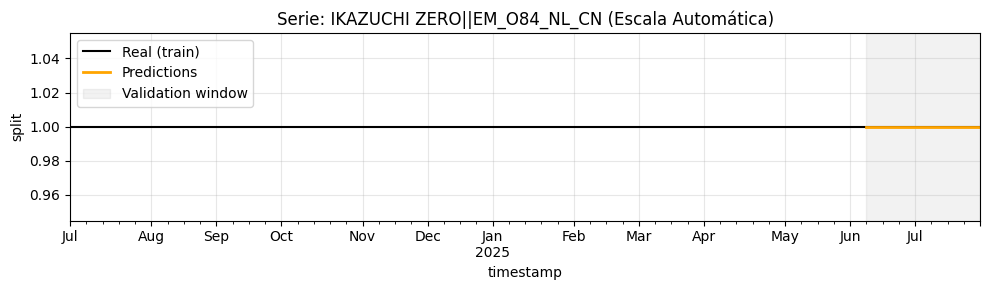

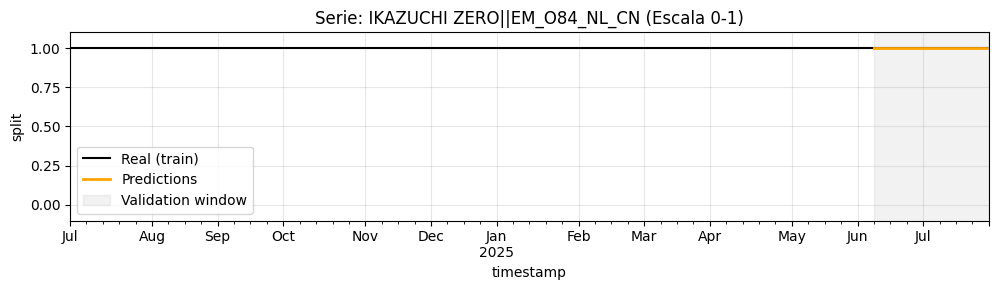


Serie: INCRAFT||N03A
             y      pred  abs_error
40    0.249807  0.266060   0.016252
179   0.221170  0.266122   0.044951
318   0.236672  0.265901   0.029228
457   0.257862  0.264400   0.006539
596   0.257504  0.264400   0.006896
735   0.264777  0.264400   0.000377
874   0.264750  0.264400   0.000350
1013  0.268632  0.264400   0.004232
MAE 0.013603


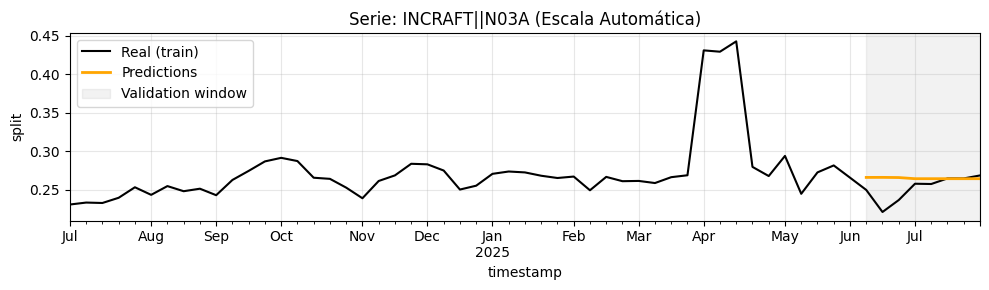

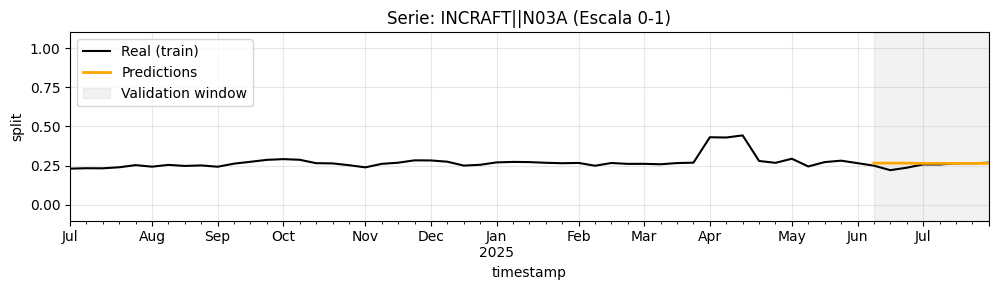


Serie: INCRAFT||N03B
             y      pred  abs_error
41    0.750193  0.733940   0.016252
180   0.778830  0.733878   0.044951
319   0.763328  0.734099   0.029228
458   0.742138  0.735600   0.006539
597   0.742496  0.735600   0.006896
736   0.735223  0.735600   0.000377
875   0.735250  0.735600   0.000350
1014  0.731368  0.735600   0.004232
MAE 0.013603


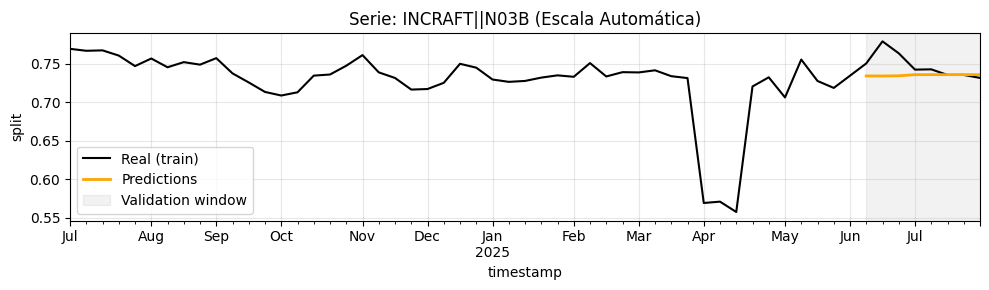

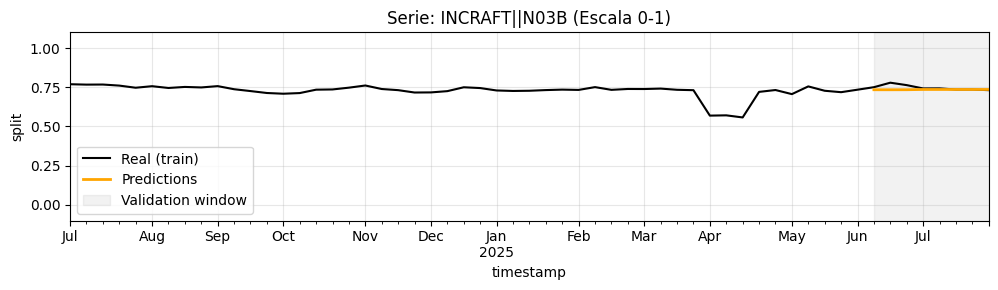


Serie: INFINITI||C04A
             y      pred  abs_error
45    0.004944  0.004848   0.000096
184   0.004632  0.004636   0.000004
323   0.005266  0.004853   0.000413
462   0.006404  0.005098   0.001306
601   0.006026  0.005105   0.000921
740   0.006091  0.005091   0.001000
879   0.006686  0.005131   0.001555
1018  0.005415  0.005129   0.000286
MAE 0.000698


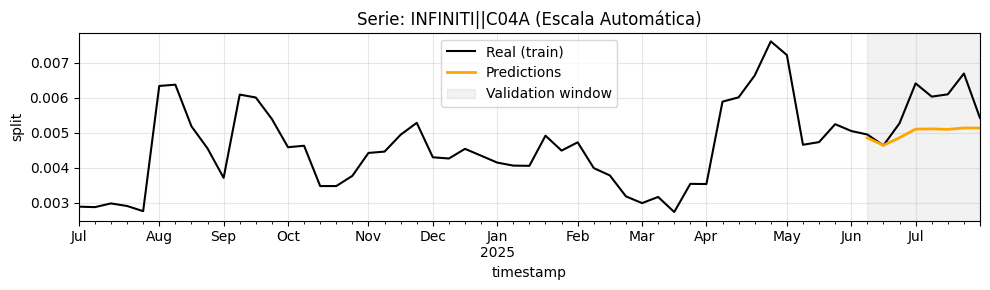

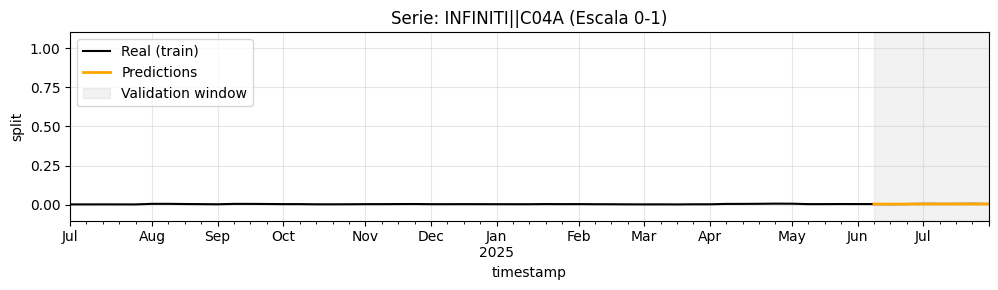


Serie: INFINITI||C04C
             y      pred  abs_error
46    0.027179  0.026588   0.000592
185   0.026248  0.024585   0.001663
324   0.026181  0.023008   0.003173
463   0.026473  0.021281   0.005191
602   0.027274  0.019905   0.007369
741   0.027117  0.013396   0.013721
880   0.026703  0.014975   0.011727
1019  0.025613  0.015330   0.010283
MAE 0.006715


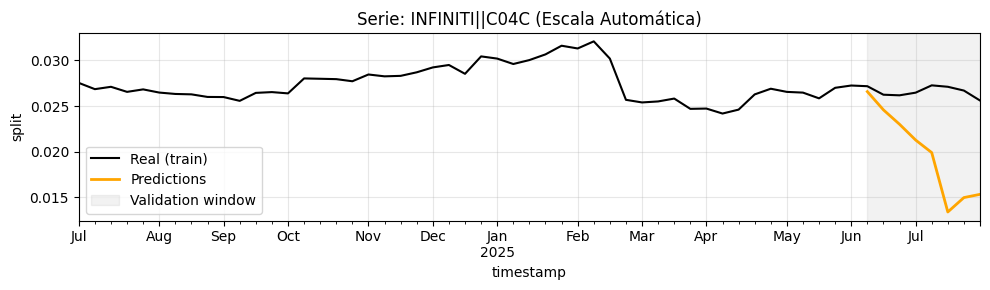

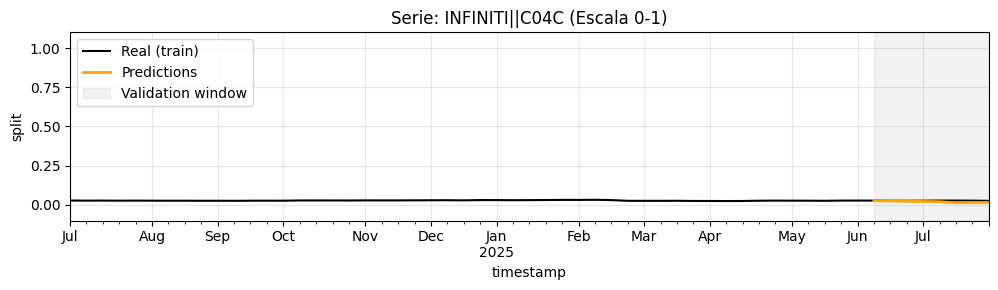


Serie: INFINITI||C04D
             y      pred  abs_error
47    0.073829  0.077037   0.003208
186   0.067051  0.077225   0.010173
325   0.068057  0.077187   0.009130
464   0.065535  0.077305   0.011770
603   0.067172  0.077414   0.010242
742   0.068949  0.077932   0.008983
881   0.077593  0.077803   0.000210
1020  0.074152  0.077775   0.003623
MAE 0.007167


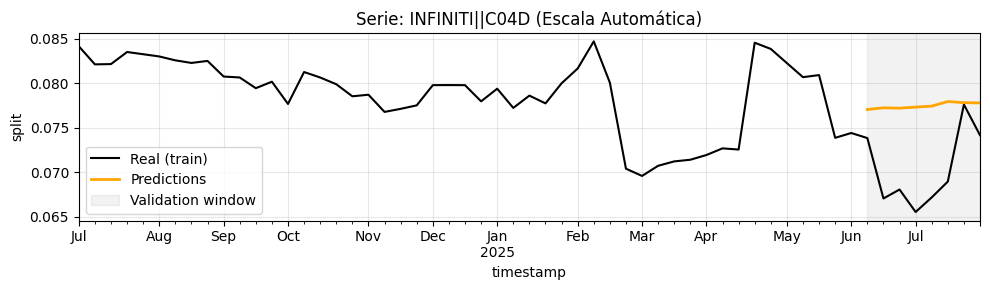

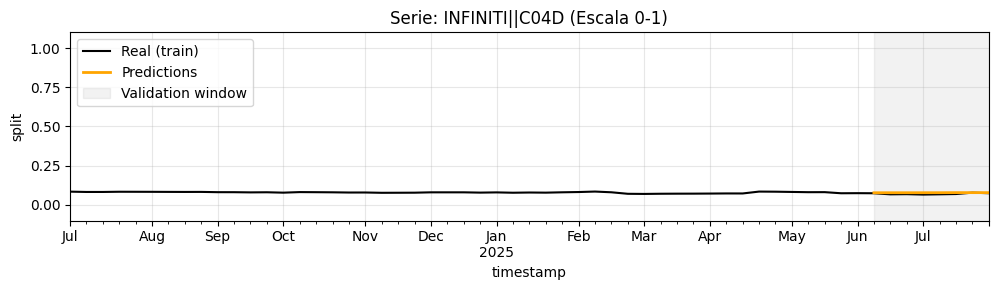


Serie: INFINITI||C12A
             y      pred  abs_error
48    0.503559  0.510133   0.006574
187   0.503648  0.509043   0.005395
326   0.507304  0.509904   0.002600
465   0.502101  0.510682   0.008581
604   0.499995  0.511400   0.011405
743   0.503136  0.514821   0.011685
882   0.553382  0.513972   0.039410
1021  0.551599  0.513787   0.037811
MAE 0.015433


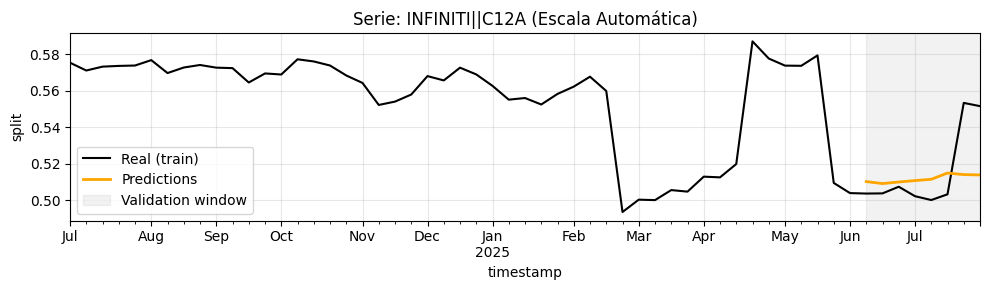

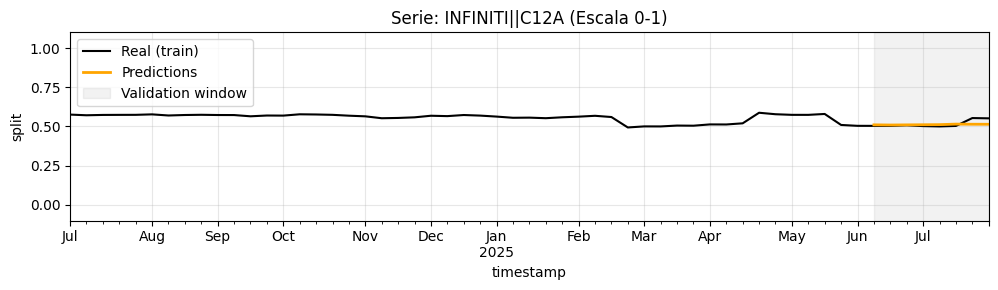


Serie: INFINITI||C12B
             y      pred  abs_error
49    0.390489  0.381394   0.009094
188   0.398420  0.384511   0.013909
327   0.393192  0.385047   0.008145
466   0.399488  0.385634   0.013854
605   0.399534  0.386176   0.013357
744   0.394707  0.388760   0.005947
883   0.335636  0.388119   0.052483
1022  0.343221  0.387979   0.044758
MAE 0.020193


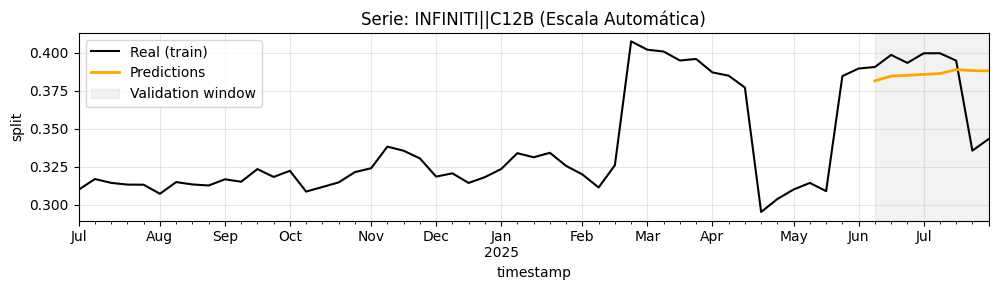

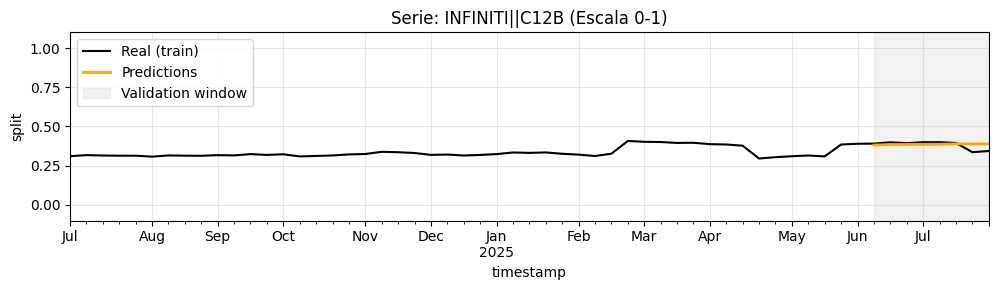


Serie: INFINITI (MODIFIED)||C05
        y  pred  abs_error
42    1.0   1.0        0.0
181   1.0   1.0        0.0
320   1.0   1.0        0.0
459   1.0   1.0        0.0
598   1.0   1.0        0.0
737   1.0   1.0        0.0
876   1.0   1.0        0.0
1015  1.0   1.0        0.0
MAE 0.000000


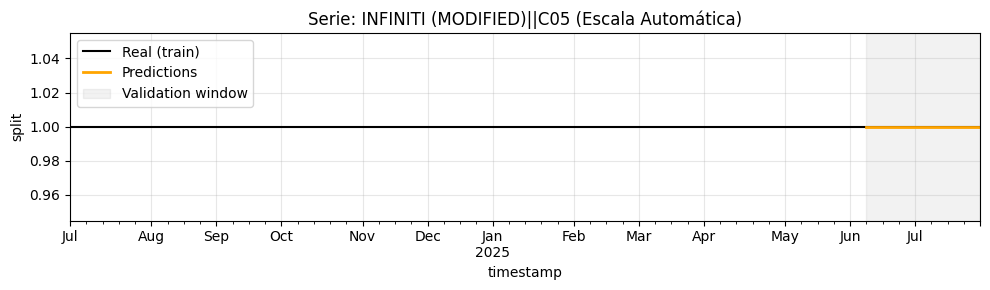

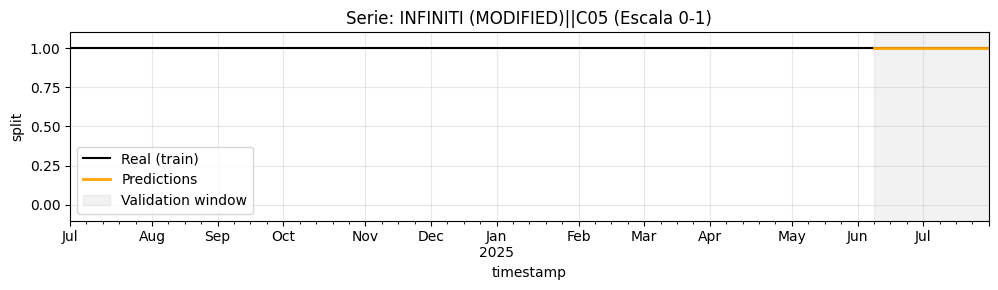


Serie: INFINITI AMBI||C12A
             y      pred  abs_error
43    0.859942  0.843173   0.016769
182   0.714796  0.833819   0.119023
321   0.713070  0.838313   0.125243
460   0.705732  0.839899   0.134167
599   0.701517  0.841889   0.140372
738   0.716949  0.847305   0.130356
877   0.761832  0.847923   0.086091
1016  0.763758  0.847525   0.083767
MAE 0.104474


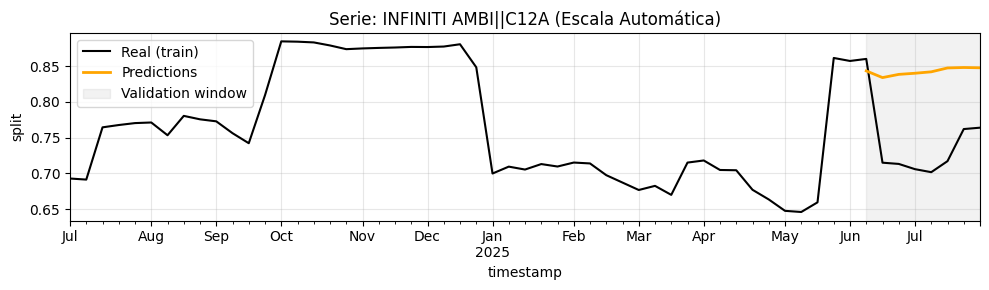

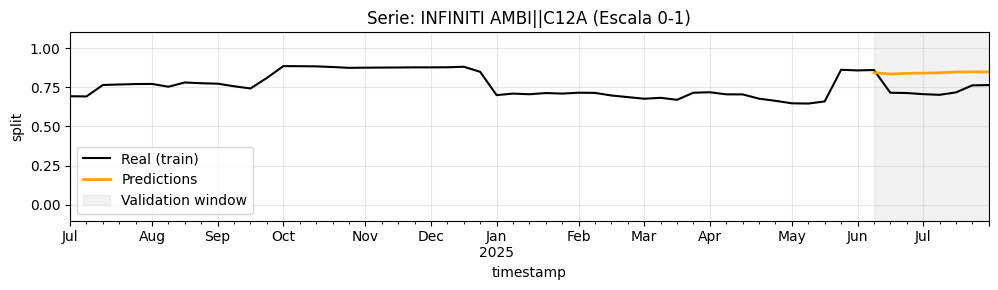


Serie: INFINITI AMBI||C12B
             y      pred  abs_error
44    0.140058  0.156827   0.016769
183   0.285204  0.166181   0.119023
322   0.286930  0.161687   0.125243
461   0.294268  0.160101   0.134167
600   0.298483  0.158111   0.140372
739   0.283051  0.152695   0.130356
878   0.238168  0.152077   0.086091
1017  0.236242  0.152475   0.083767
MAE 0.104474


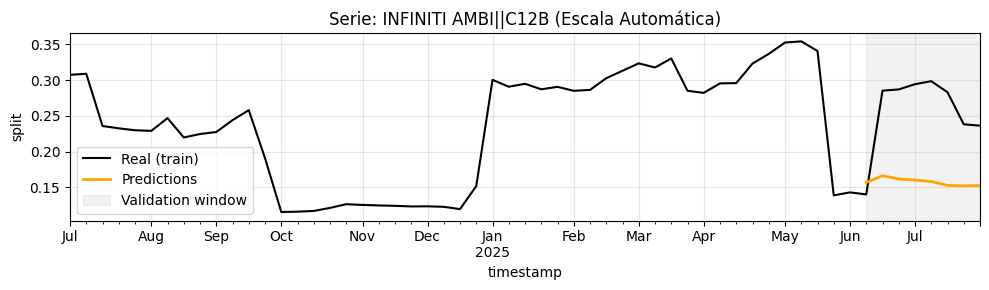

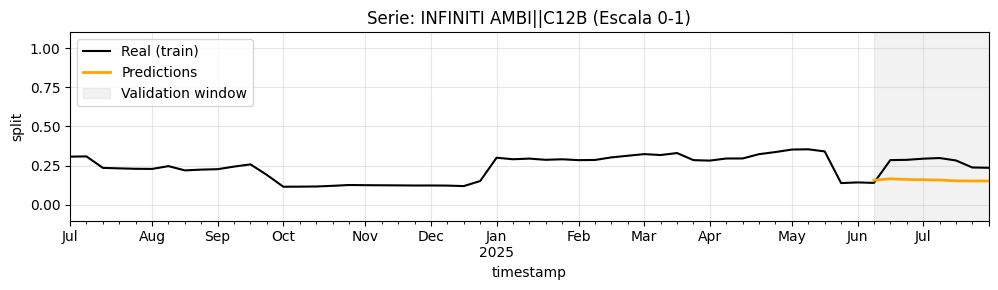


Serie: KOBI CAROTID||T02B
        y  pred  abs_error
50    1.0   1.0        0.0
189   1.0   1.0        0.0
328   1.0   1.0        0.0
467   1.0   1.0        0.0
606   1.0   1.0        0.0
745   1.0   1.0        0.0
884   1.0   1.0        0.0
1023  1.0   1.0        0.0
MAE 0.000000


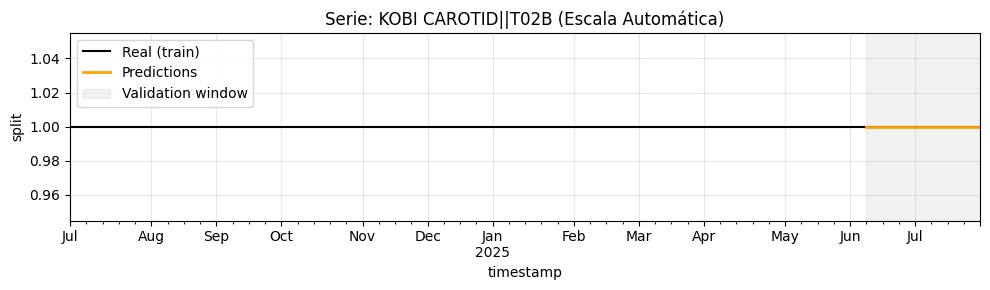

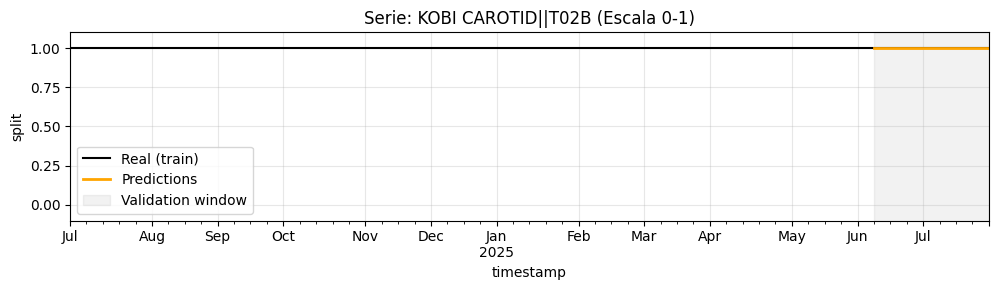


Serie: Long Sheath||A00A
        y  pred  abs_error
51    1.0   1.0        0.0
190   1.0   1.0        0.0
329   1.0   1.0        0.0
468   1.0   1.0        0.0
607   1.0   1.0        0.0
746   1.0   1.0        0.0
885   1.0   1.0        0.0
1024  1.0   1.0        0.0
MAE 0.000000


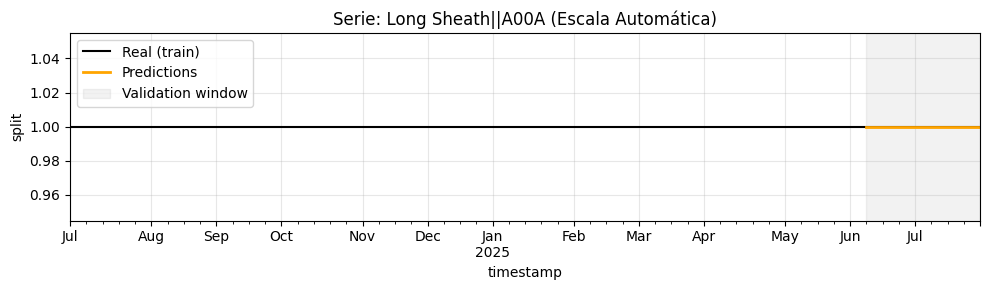

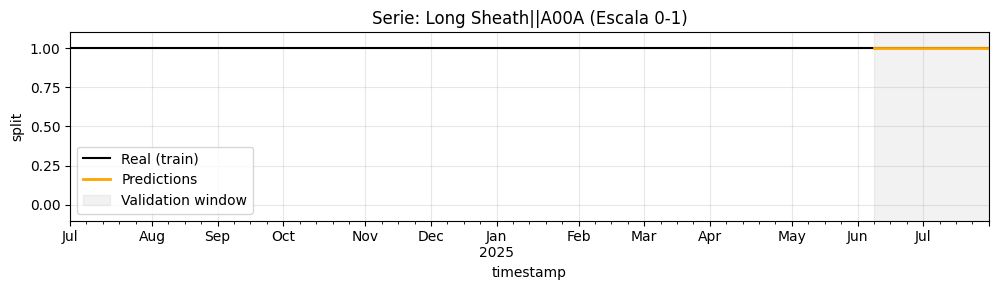


Serie: MAXI||EM_D05
        y  pred  abs_error
52    1.0   1.0        0.0
191   1.0   1.0        0.0
330   1.0   1.0        0.0
469   1.0   1.0        0.0
608   1.0   1.0        0.0
747   1.0   1.0        0.0
886   1.0   1.0        0.0
1025  1.0   1.0        0.0
MAE 0.000000


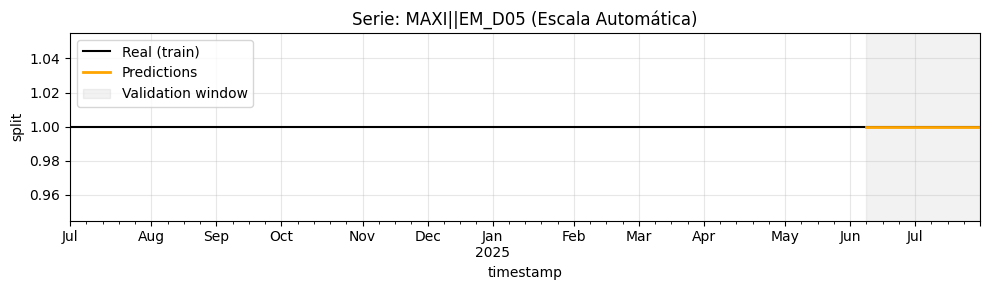

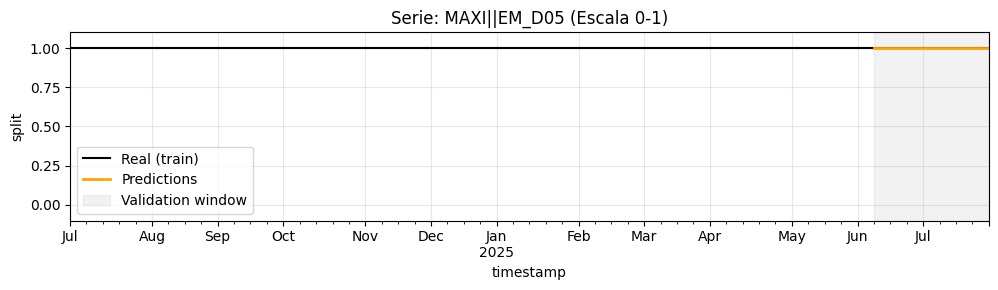


Serie: MULTIPACK||C04B
        y  pred  abs_error
55    1.0   1.0        0.0
194   1.0   1.0        0.0
333   1.0   1.0        0.0
472   1.0   1.0        0.0
611   1.0   1.0        0.0
750   1.0   1.0        0.0
889   1.0   1.0        0.0
1028  1.0   1.0        0.0
MAE 0.000000


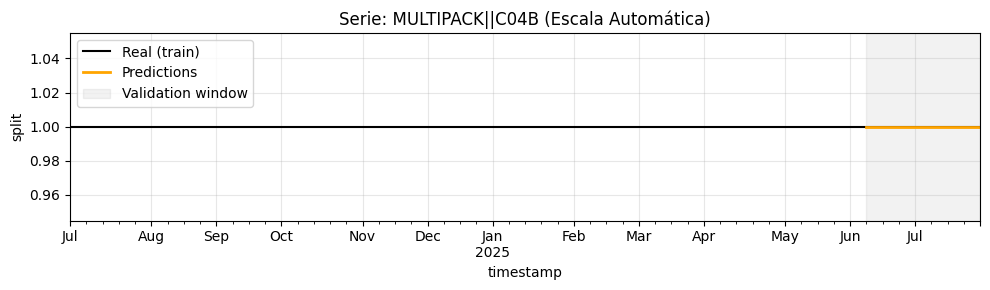

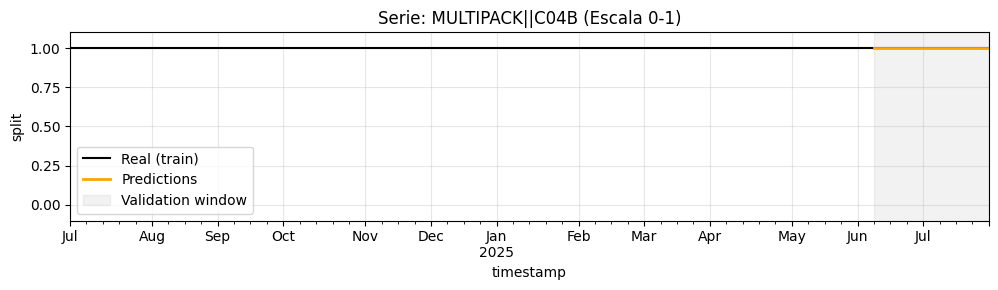


Serie: MULTIPACK (MODIFIED)||C04B
        y      pred     abs_error
53    1.0  0.999999  9.842222e-07
192   1.0  0.999999  9.658979e-07
331   1.0  0.999999  9.938832e-07
470   1.0  0.999999  9.938832e-07
609   1.0  0.999999  9.938832e-07
748   1.0  0.999999  9.938832e-07
887   1.0  0.999999  9.900568e-07
1026  1.0  0.999999  9.871795e-07
MAE 0.000001


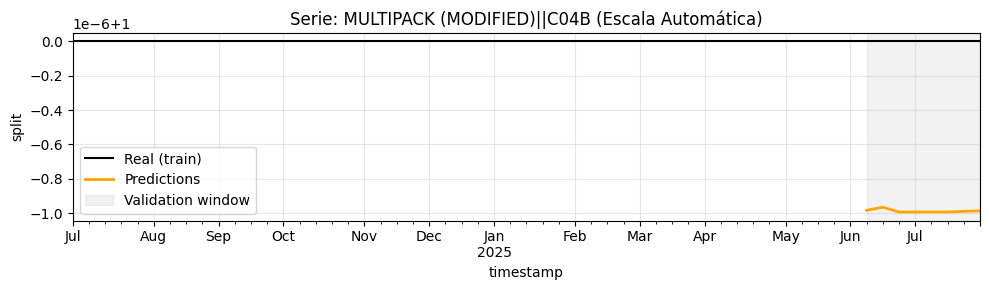

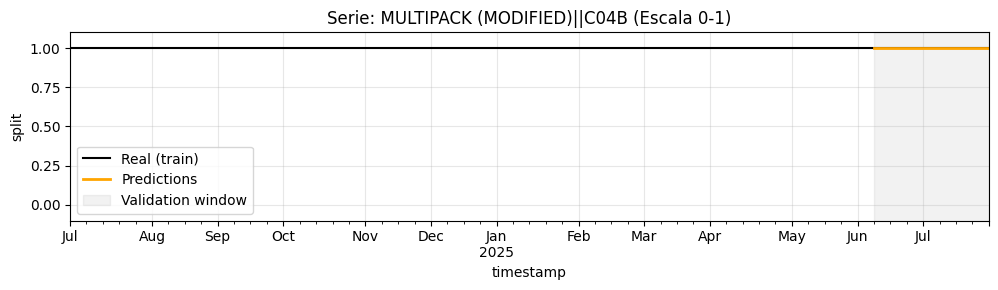


Serie: MULTIPACK (MODIFIED)||C05
        y          pred     abs_error
54    0.0  9.842222e-07  9.842222e-07
193   0.0  9.658979e-07  9.658979e-07
332   0.0  9.938832e-07  9.938832e-07
471   0.0  9.938832e-07  9.938832e-07
610   0.0  9.938832e-07  9.938832e-07
749   0.0  9.938832e-07  9.938832e-07
888   0.0  9.900568e-07  9.900568e-07
1027  0.0  9.871795e-07  9.871795e-07
MAE 0.000001


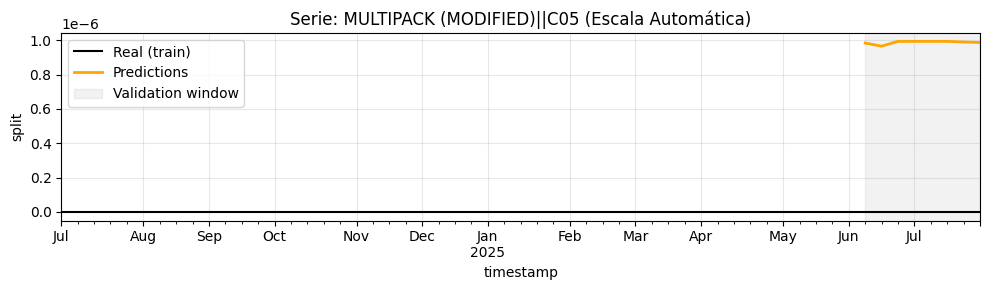

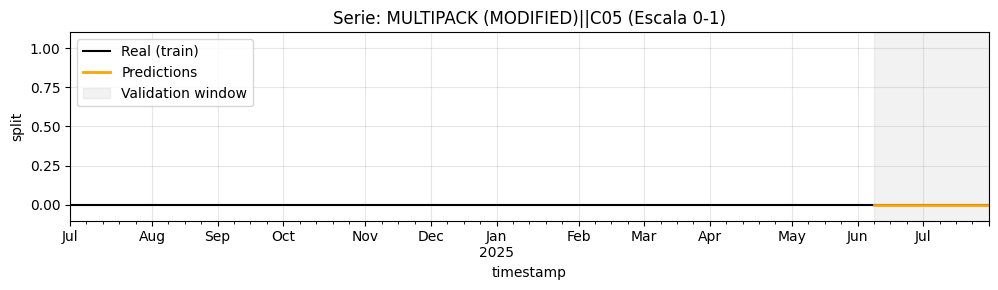


Serie: MYNX Control||ERR
        y  pred  abs_error
57    1.0   1.0        0.0
196   1.0   1.0        0.0
335   1.0   1.0        0.0
474   1.0   1.0        0.0
613   1.0   1.0        0.0
752   1.0   1.0        0.0
891   1.0   1.0        0.0
1030  1.0   1.0        0.0
MAE 0.000000


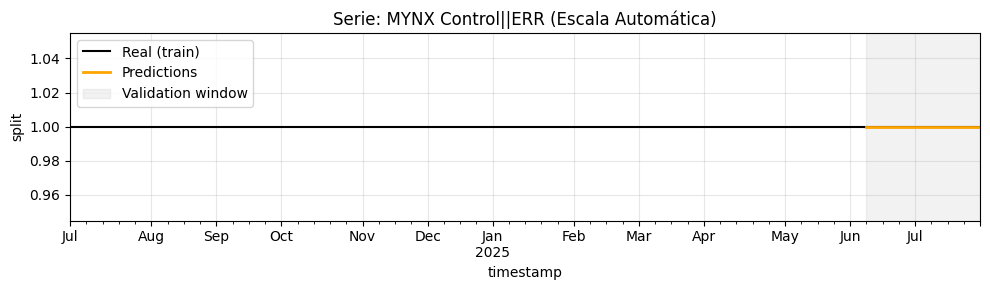

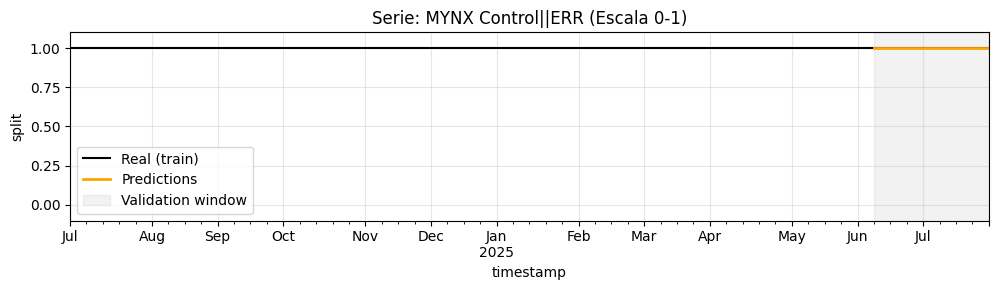


Serie: MYNX Control Venous||ERR
        y  pred  abs_error
56    1.0   1.0        0.0
195   1.0   1.0        0.0
334   1.0   1.0        0.0
473   1.0   1.0        0.0
612   1.0   1.0        0.0
751   1.0   1.0        0.0
890   1.0   1.0        0.0
1029  1.0   1.0        0.0
MAE 0.000000


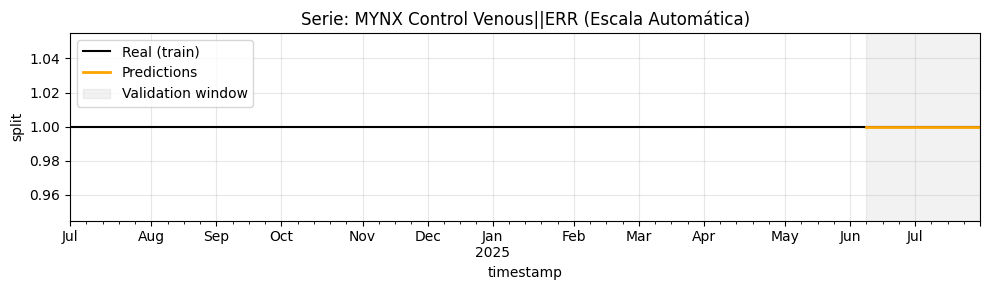

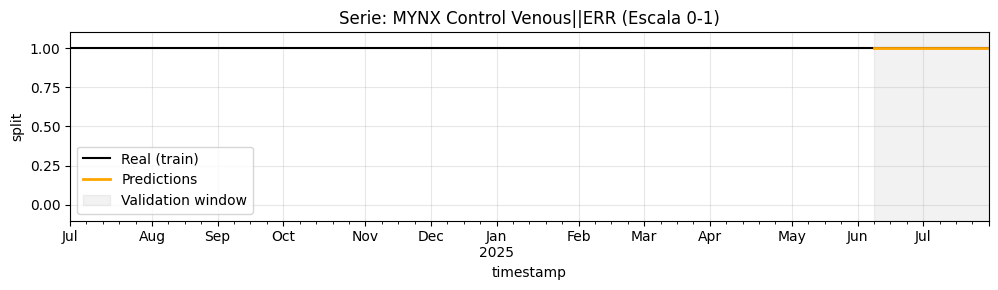


Serie: MYNX GRIP||ERR
        y  pred  abs_error
58    1.0   1.0        0.0
197   1.0   1.0        0.0
336   1.0   1.0        0.0
475   1.0   1.0        0.0
614   1.0   1.0        0.0
753   1.0   1.0        0.0
892   1.0   1.0        0.0
1031  1.0   1.0        0.0
MAE 0.000000


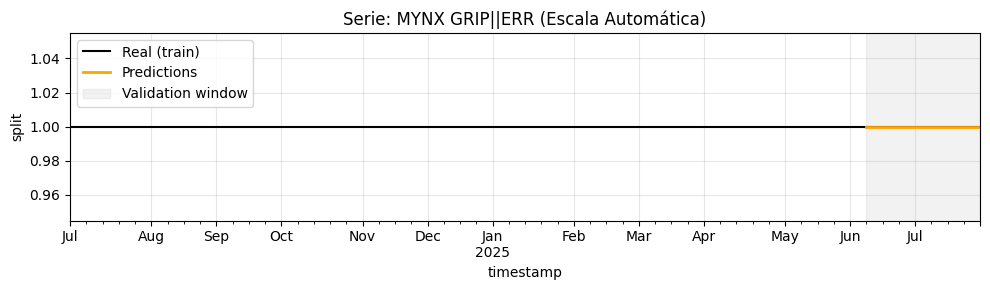

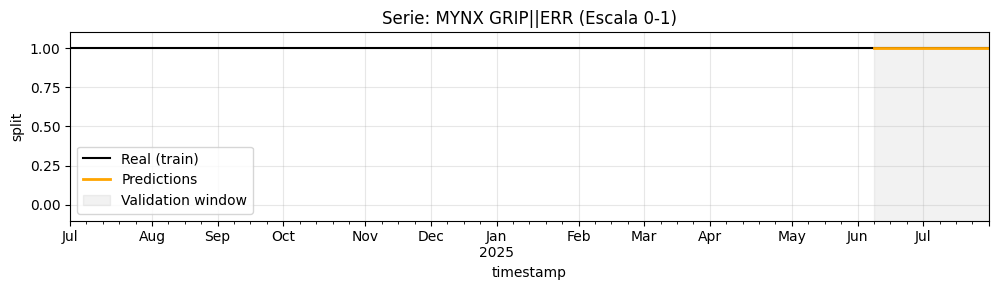


Serie: NEEDLE||EM_O02
             y      pred  abs_error
59    0.157950  0.148075   0.009875
198   0.181560  0.146167   0.035393
337   0.157471  0.145611   0.011860
476   0.125856  0.145611   0.019755
615   0.127786  0.145611   0.017825
754   0.117853  0.145611   0.027759
893   0.127999  0.145996   0.017997
1032  0.135379  0.145996   0.010616
MAE 0.018885


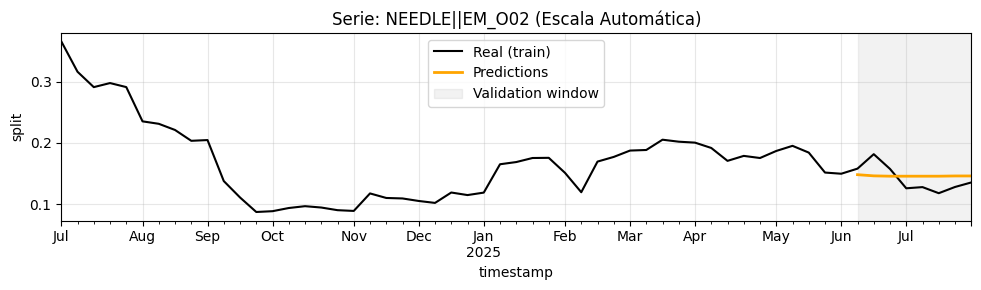

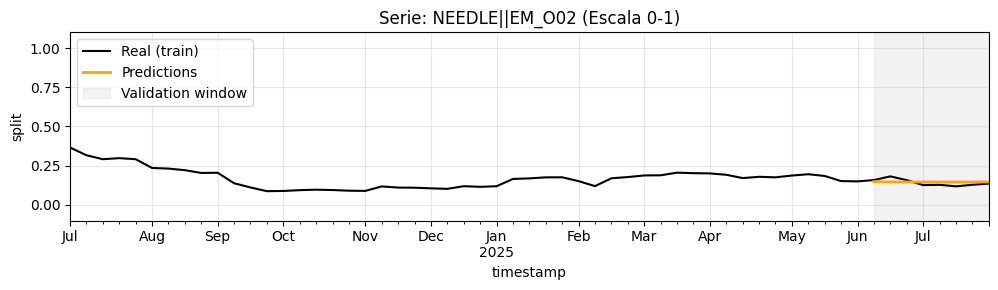


Serie: NEEDLE||EM_O02_NL
        y          pred     abs_error
60    0.0  9.647415e-07  9.647415e-07
199   0.0  9.345818e-07  9.345818e-07
338   0.0  9.599650e-07  9.599650e-07
477   0.0  9.599650e-07  9.599650e-07
616   0.0  9.599650e-07  9.599650e-07
755   0.0  9.599650e-07  9.599650e-07
894   0.0  9.587934e-07  9.587934e-07
1033  0.0  9.560070e-07  9.560070e-07
MAE 0.000001


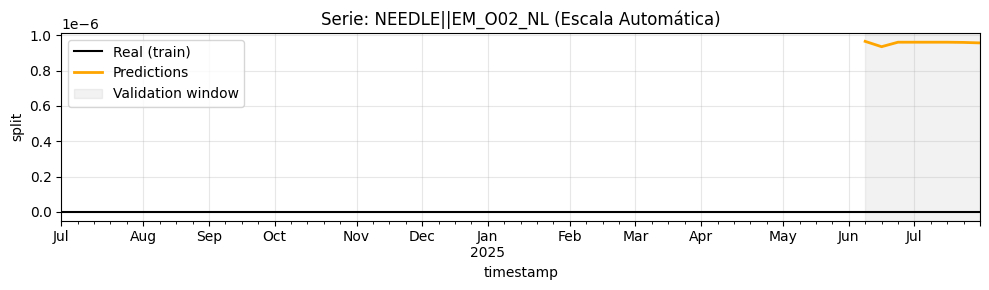

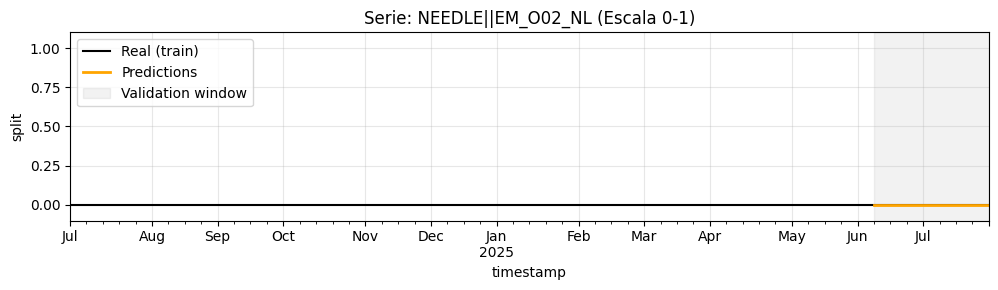


Serie: NEEDLE||EM_O04_NL
             y      pred  abs_error
61    0.842050  0.851924   0.009874
200   0.818440  0.853832   0.035392
339   0.842529  0.854388   0.011859
478   0.874144  0.854388   0.019756
617   0.872214  0.854388   0.017826
756   0.882147  0.854388   0.027760
895   0.872001  0.854003   0.017998
1034  0.864621  0.854003   0.010617
MAE 0.018885


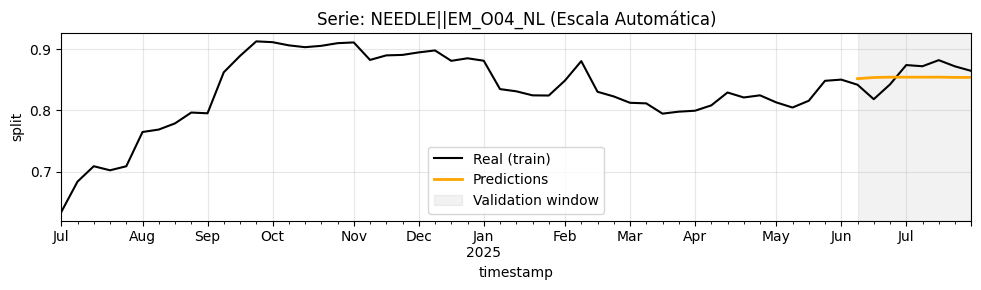

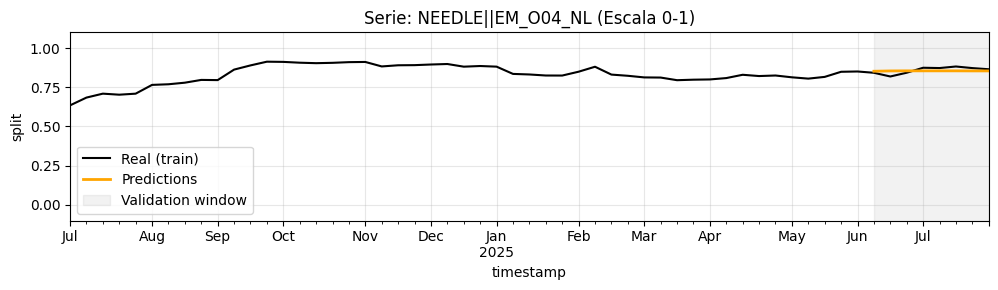


Serie: NEON||EM_O86_NL
        y  pred  abs_error
63    1.0   1.0        0.0
202   1.0   1.0        0.0
341   1.0   1.0        0.0
480   1.0   1.0        0.0
619   1.0   1.0        0.0
758   1.0   1.0        0.0
897   1.0   1.0        0.0
1036  1.0   1.0        0.0
MAE 0.000000


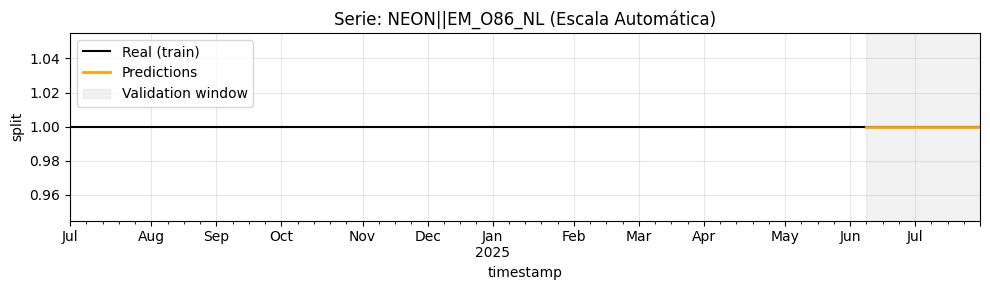

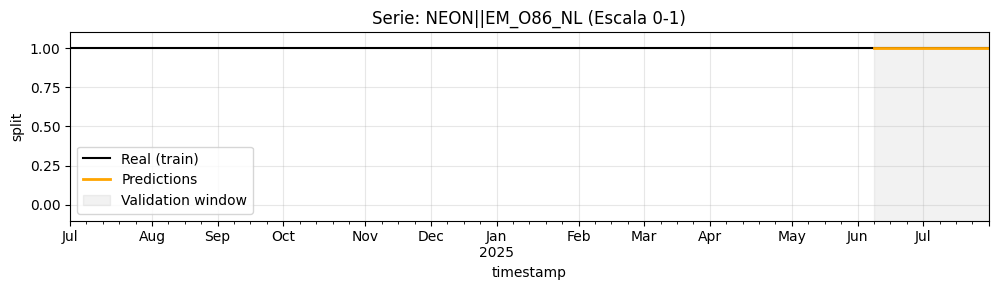


Serie: NEON NC||EM_O86_NL
        y  pred  abs_error
62    1.0   1.0        0.0
201   1.0   1.0        0.0
340   1.0   1.0        0.0
479   1.0   1.0        0.0
618   1.0   1.0        0.0
757   1.0   1.0        0.0
896   1.0   1.0        0.0
1035  1.0   1.0        0.0
MAE 0.000000


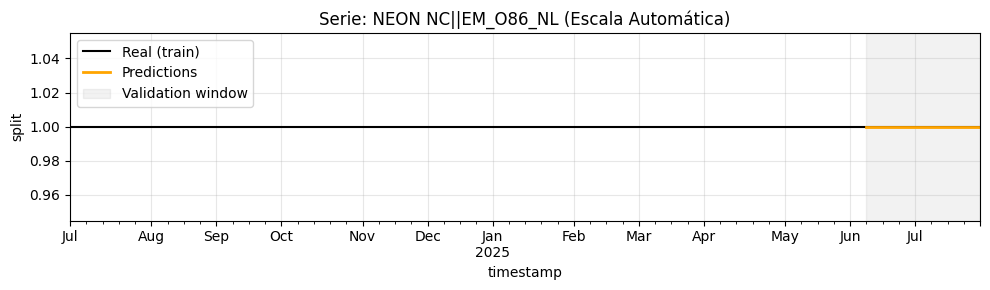

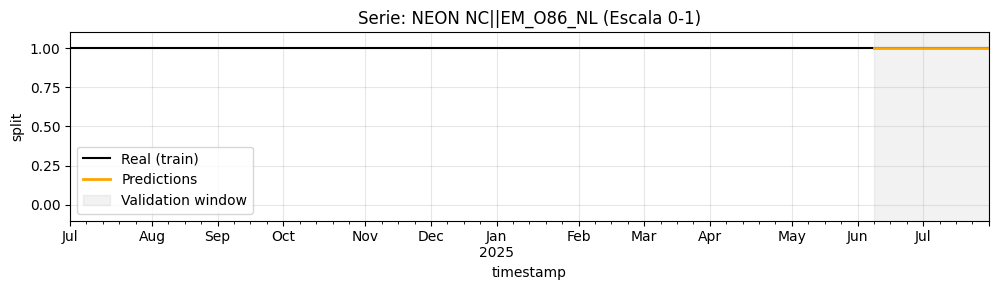


Serie: OPTA PRO||EM_D01
        y  pred  abs_error
64    1.0   1.0        0.0
203   1.0   1.0        0.0
342   1.0   1.0        0.0
481   1.0   1.0        0.0
620   1.0   1.0        0.0
759   1.0   1.0        0.0
898   1.0   1.0        0.0
1037  1.0   1.0        0.0
MAE 0.000000


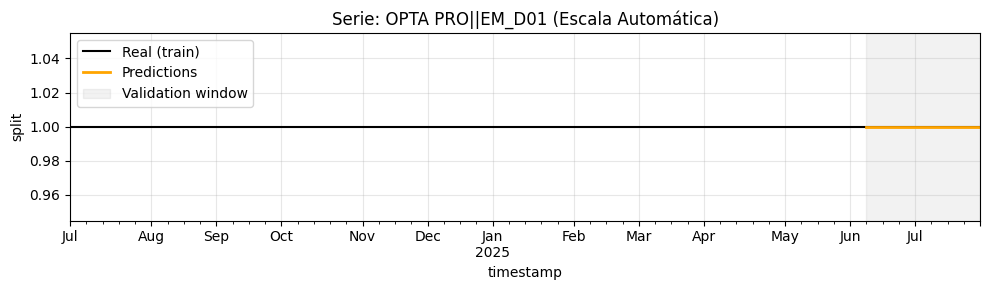

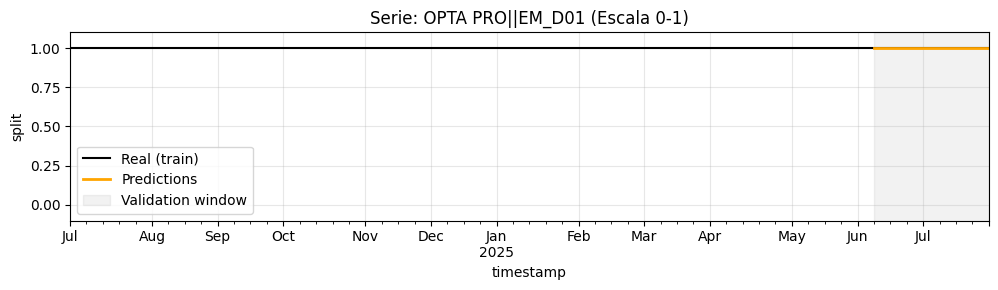


Serie: OPTEASE||P00
        y  pred  abs_error
66    1.0   1.0        0.0
205   1.0   1.0        0.0
344   1.0   1.0        0.0
483   1.0   1.0        0.0
622   1.0   1.0        0.0
761   1.0   1.0        0.0
900   1.0   1.0        0.0
1039  1.0   1.0        0.0
MAE 0.000000


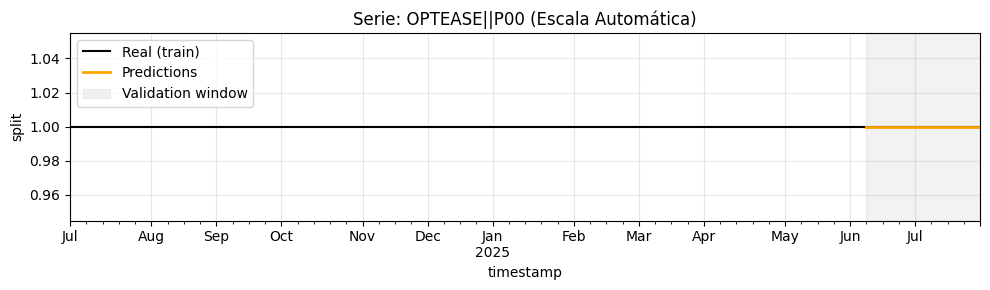

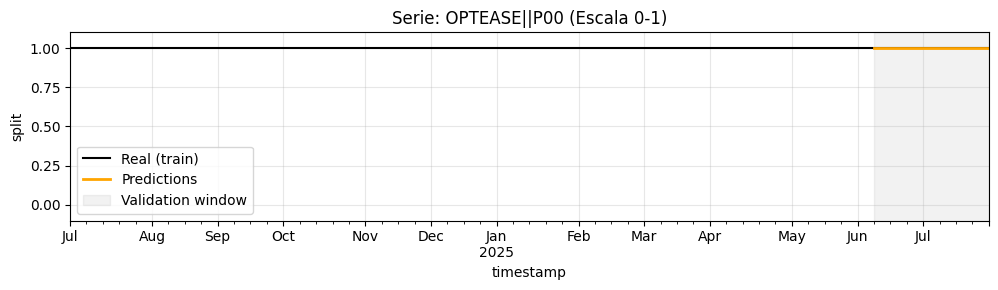


Serie: OPTEASE RETRIEVAL CATHETER||E00C
        y  pred  abs_error
65    1.0   1.0        0.0
204   1.0   1.0        0.0
343   1.0   1.0        0.0
482   1.0   1.0        0.0
621   1.0   1.0        0.0
760   1.0   1.0        0.0
899   1.0   1.0        0.0
1038  1.0   1.0        0.0
MAE 0.000000


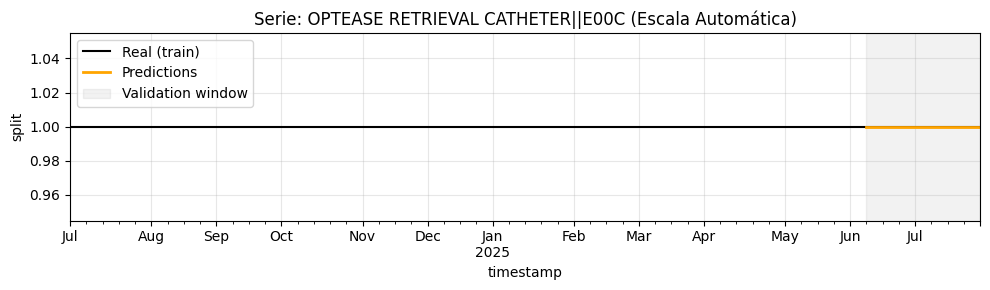

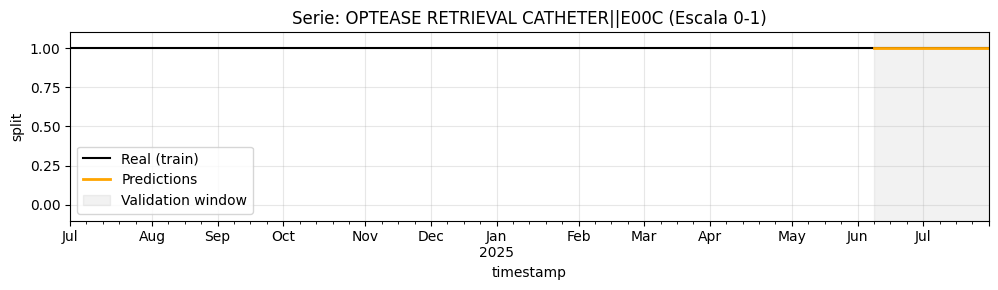


Serie: OUTBACK ELITE||X00
        y  pred  abs_error
67    1.0   1.0        0.0
206   1.0   1.0        0.0
345   1.0   1.0        0.0
484   1.0   1.0        0.0
623   1.0   1.0        0.0
762   1.0   1.0        0.0
901   1.0   1.0        0.0
1040  1.0   1.0        0.0
MAE 0.000000


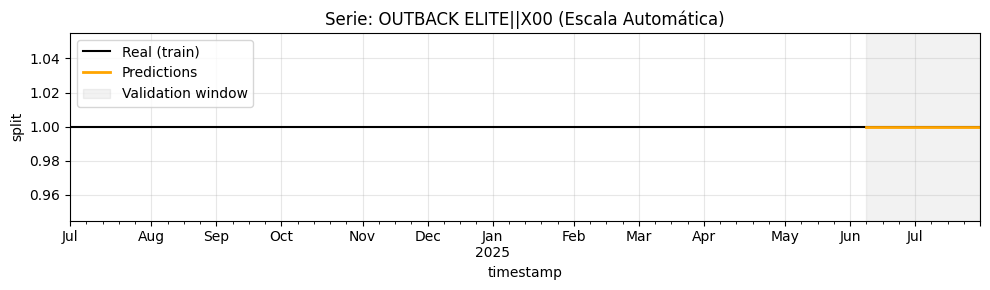

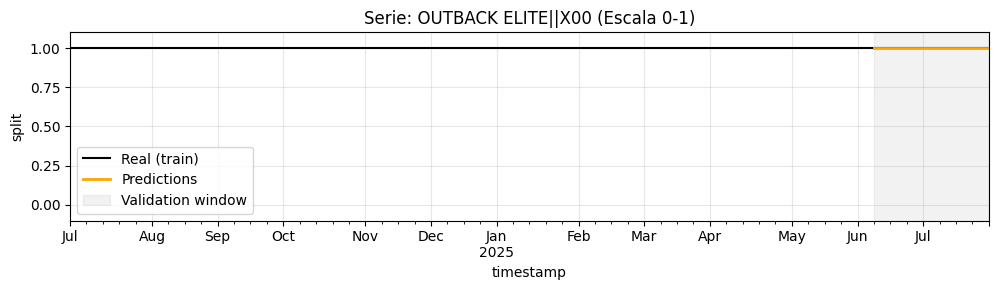


Serie: PALMAZ UNMOUNTED||EM_U90
        y  pred  abs_error
68    1.0   1.0        0.0
207   1.0   1.0        0.0
346   1.0   1.0        0.0
485   1.0   1.0        0.0
624   1.0   1.0        0.0
763   1.0   1.0        0.0
902   1.0   1.0        0.0
1041  1.0   1.0        0.0
MAE 0.000000


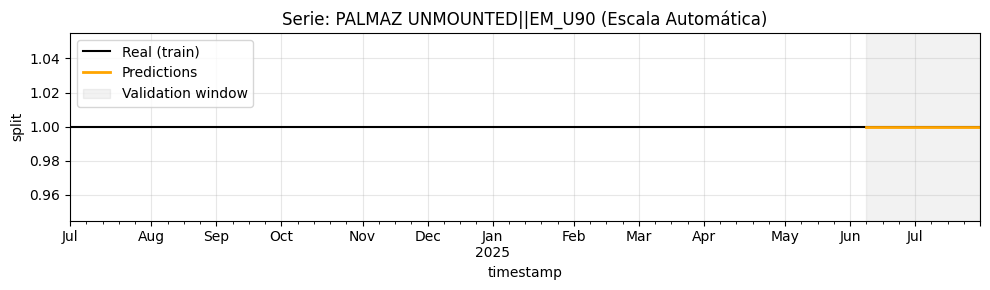

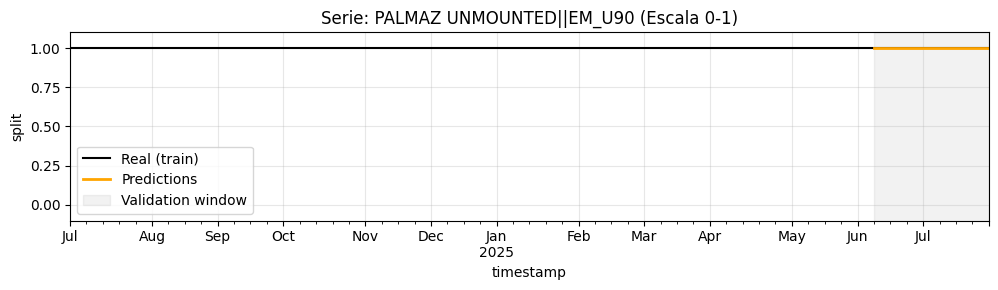


Serie: POWERFLEX EXTREME||EM_D01
        y  pred  abs_error
69    1.0   1.0        0.0
208   1.0   1.0        0.0
347   1.0   1.0        0.0
486   1.0   1.0        0.0
625   1.0   1.0        0.0
764   1.0   1.0        0.0
903   1.0   1.0        0.0
1042  1.0   1.0        0.0
MAE 0.000000


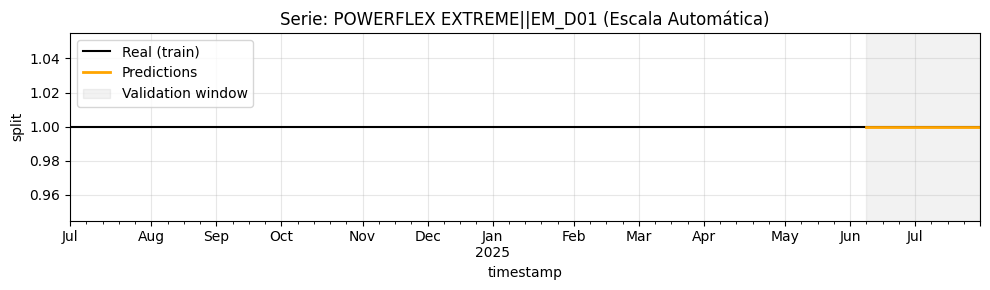

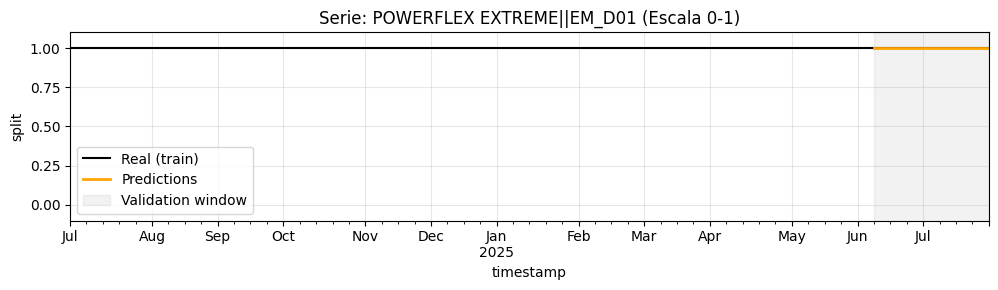


Serie: POWERFLEX P3||EM_D01
        y  pred  abs_error
70    1.0   1.0        0.0
209   1.0   1.0        0.0
348   1.0   1.0        0.0
487   1.0   1.0        0.0
626   1.0   1.0        0.0
765   1.0   1.0        0.0
904   1.0   1.0        0.0
1043  1.0   1.0        0.0
MAE 0.000000


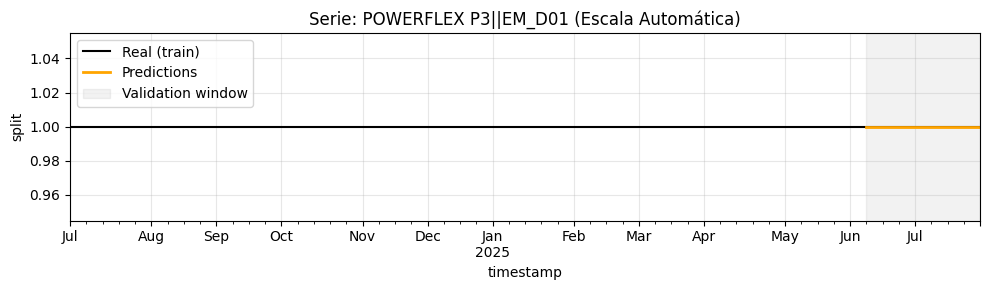

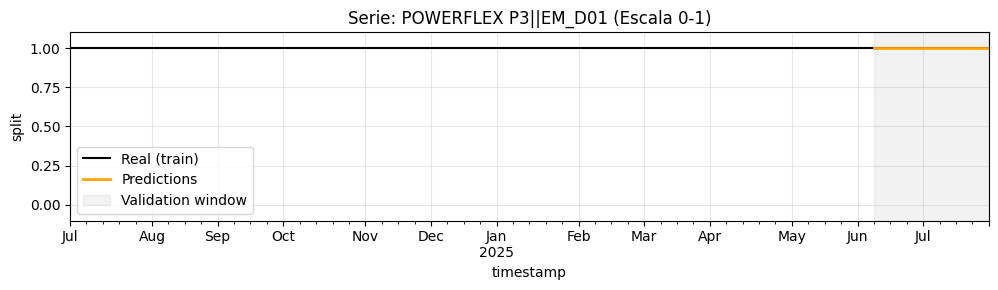


Serie: POWERFLEX PRO||EM_D02
        y  pred  abs_error
71    1.0   1.0        0.0
210   1.0   1.0        0.0
349   1.0   1.0        0.0
488   1.0   1.0        0.0
627   1.0   1.0        0.0
766   1.0   1.0        0.0
905   1.0   1.0        0.0
1044  1.0   1.0        0.0
MAE 0.000000


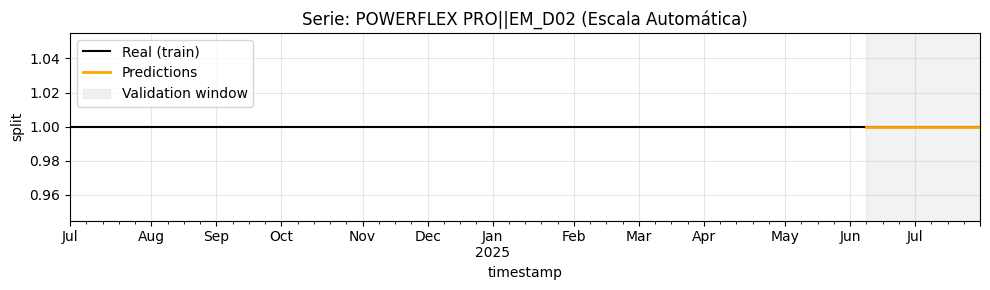

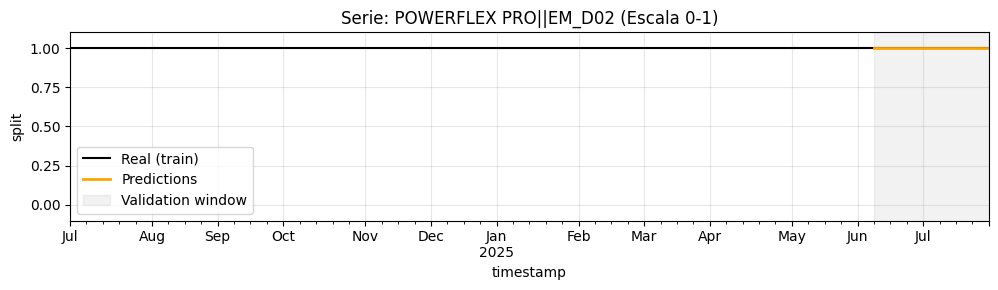


Serie: PRECISE PRO||T02A
        y  pred  abs_error
72    1.0   1.0        0.0
211   1.0   1.0        0.0
350   1.0   1.0        0.0
489   1.0   1.0        0.0
628   1.0   1.0        0.0
767   1.0   1.0        0.0
906   1.0   1.0        0.0
1045  1.0   1.0        0.0
MAE 0.000000


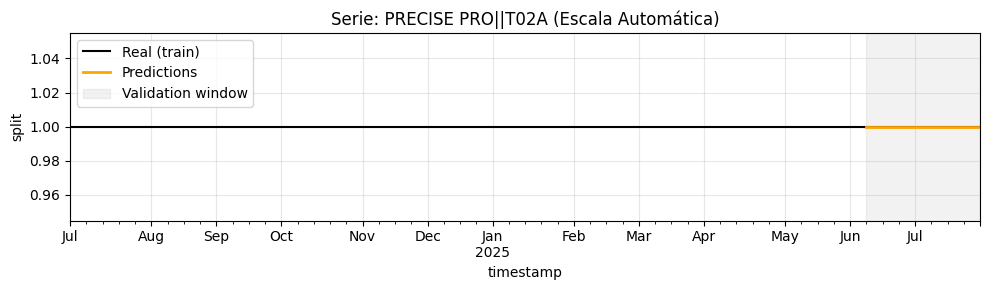

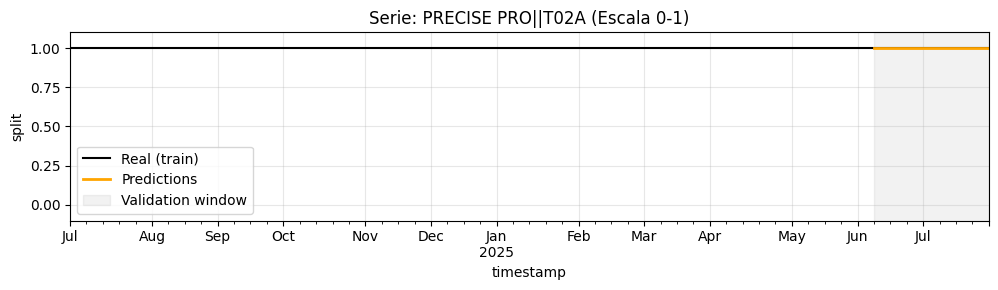


Serie: PREFACE||A01
        y  pred  abs_error
73    1.0   1.0        0.0
212   1.0   1.0        0.0
351   1.0   1.0        0.0
490   1.0   1.0        0.0
629   1.0   1.0        0.0
768   1.0   1.0        0.0
907   1.0   1.0        0.0
1046  1.0   1.0        0.0
MAE 0.000000


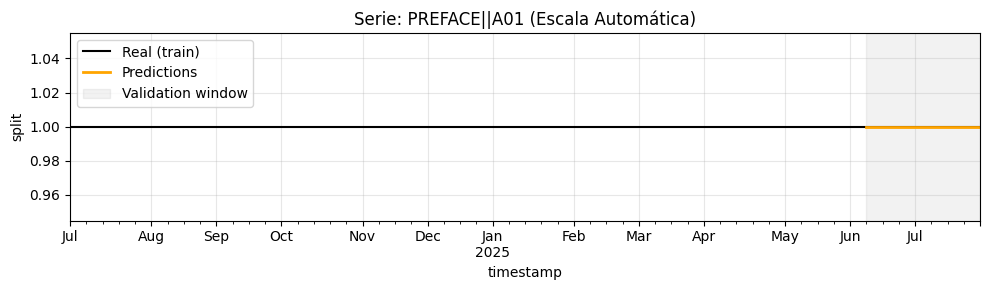

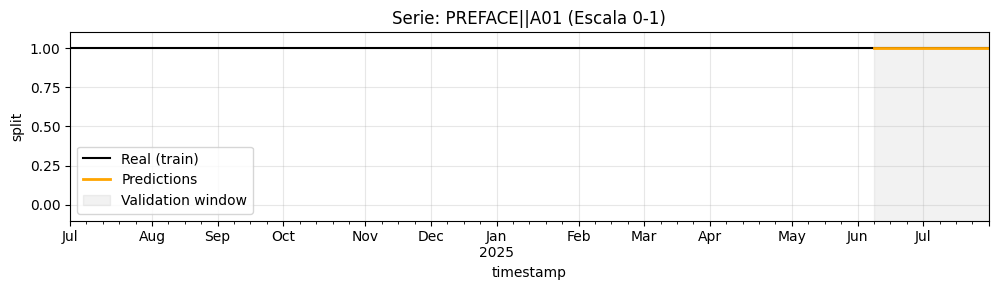


Serie: PRIMOPAC||C04B
        y  pred  abs_error
75    1.0   1.0        0.0
214   1.0   1.0        0.0
353   1.0   1.0        0.0
492   1.0   1.0        0.0
631   1.0   1.0        0.0
770   1.0   1.0        0.0
909   1.0   1.0        0.0
1048  1.0   1.0        0.0
MAE 0.000000


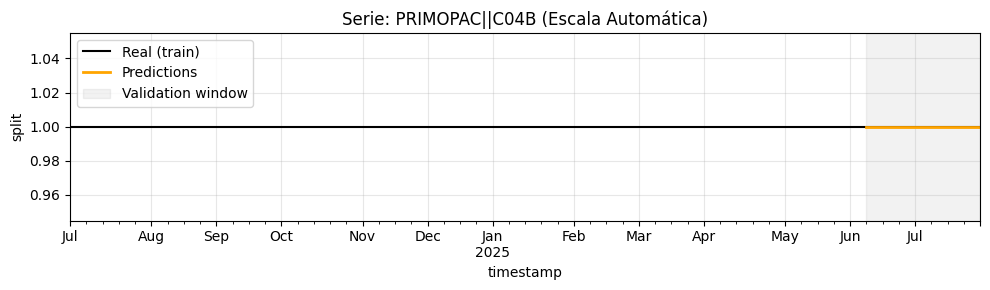

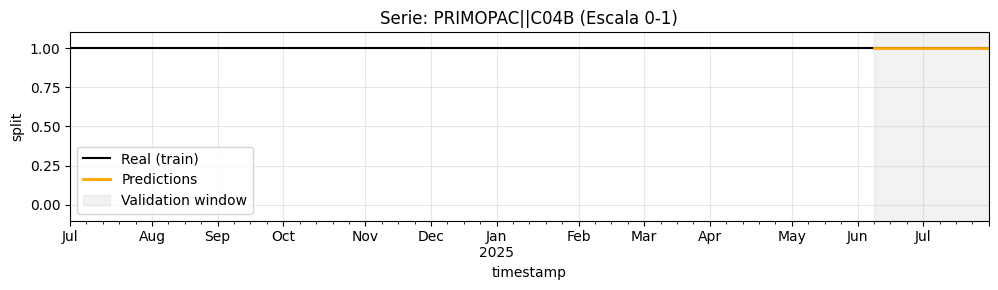


Serie: PRIMOPAC (MODIFIED)||C04B
        y  pred  abs_error
74    1.0   1.0        0.0
213   1.0   1.0        0.0
352   1.0   1.0        0.0
491   1.0   1.0        0.0
630   1.0   1.0        0.0
769   1.0   1.0        0.0
908   1.0   1.0        0.0
1047  1.0   1.0        0.0
MAE 0.000000


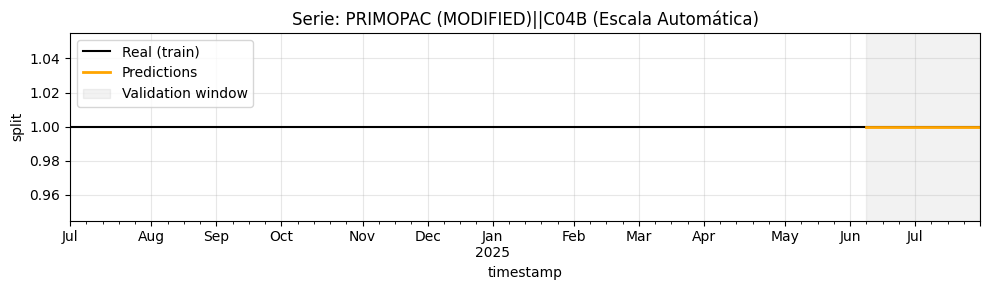

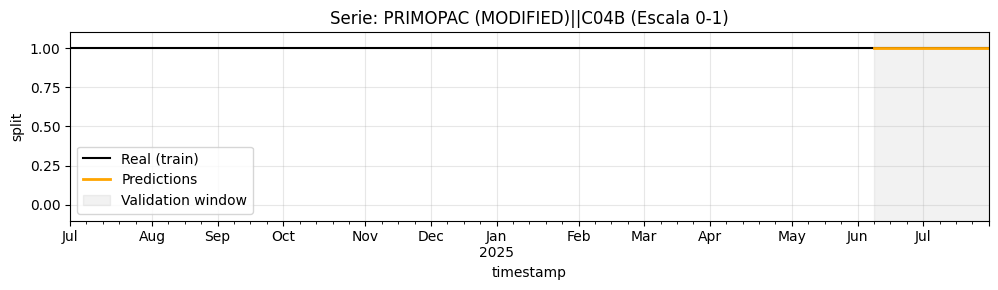


Serie: PROPAC||C04B
        y  pred  abs_error
77    1.0   1.0        0.0
216   1.0   1.0        0.0
355   1.0   1.0        0.0
494   1.0   1.0        0.0
633   1.0   1.0        0.0
772   1.0   1.0        0.0
911   1.0   1.0        0.0
1050  1.0   1.0        0.0
MAE 0.000000


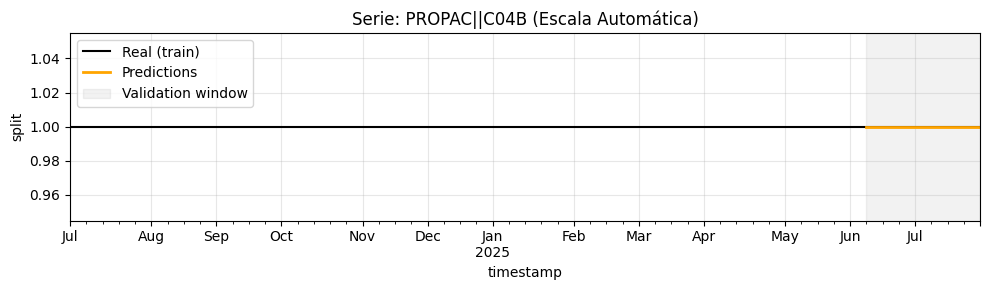

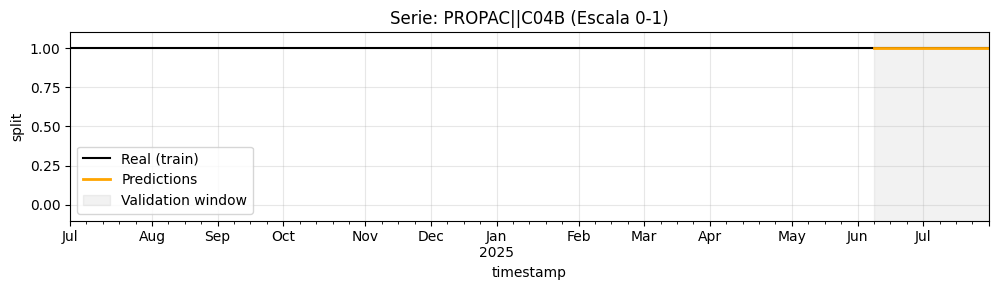


Serie: PROPAC (MODIFIED)||C04B
        y  pred  abs_error
76    1.0   1.0        0.0
215   1.0   1.0        0.0
354   1.0   1.0        0.0
493   1.0   1.0        0.0
632   1.0   1.0        0.0
771   1.0   1.0        0.0
910   1.0   1.0        0.0
1049  1.0   1.0        0.0
MAE 0.000000


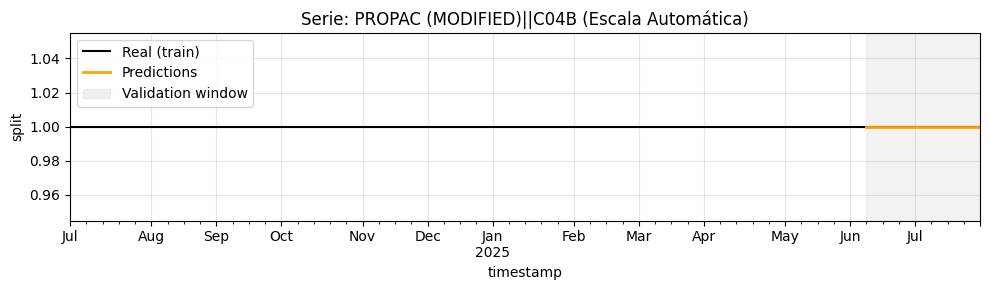

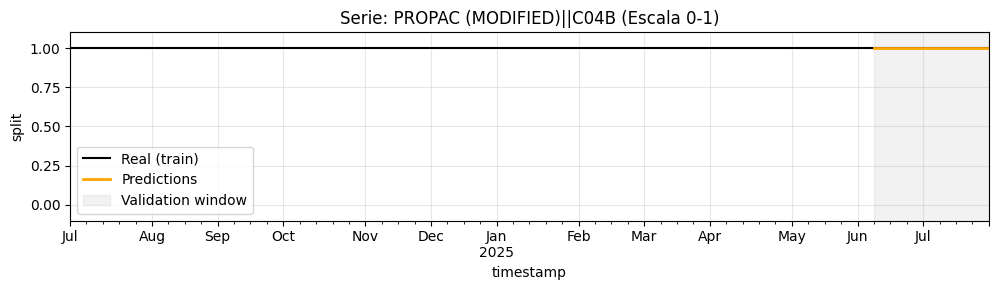


Serie: RAIDEN||EM_O84_NL_CN
        y  pred  abs_error
78    1.0   1.0        0.0
217   1.0   1.0        0.0
356   1.0   1.0        0.0
495   1.0   1.0        0.0
634   1.0   1.0        0.0
773   1.0   1.0        0.0
912   1.0   1.0        0.0
1051  1.0   1.0        0.0
MAE 0.000000


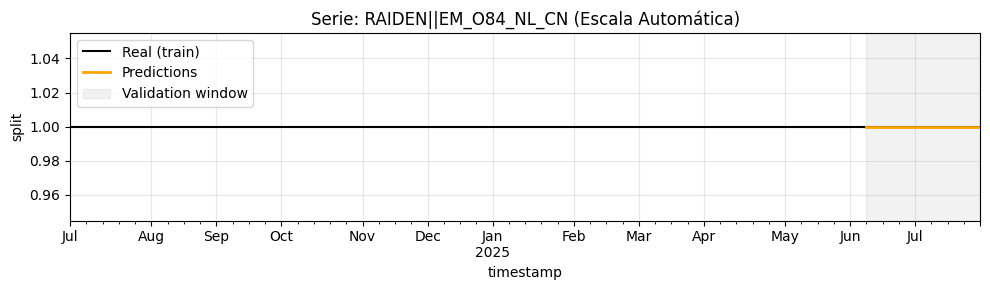

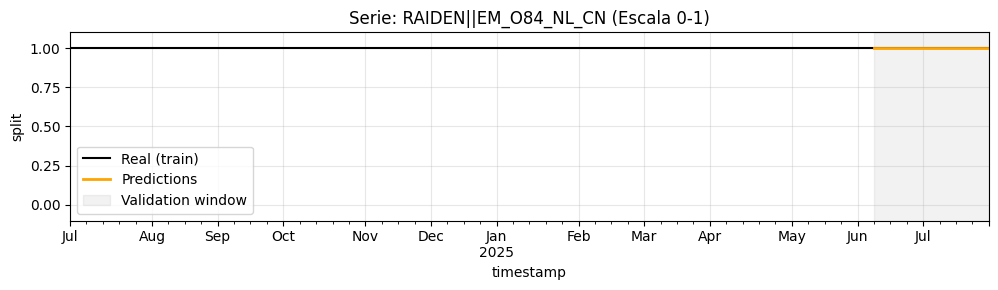


Serie: RAILWAY||A04
        y  pred  abs_error
79    1.0   1.0        0.0
218   1.0   1.0        0.0
357   1.0   1.0        0.0
496   1.0   1.0        0.0
635   1.0   1.0        0.0
774   1.0   1.0        0.0
913   1.0   1.0        0.0
1052  1.0   1.0        0.0
MAE 0.000000


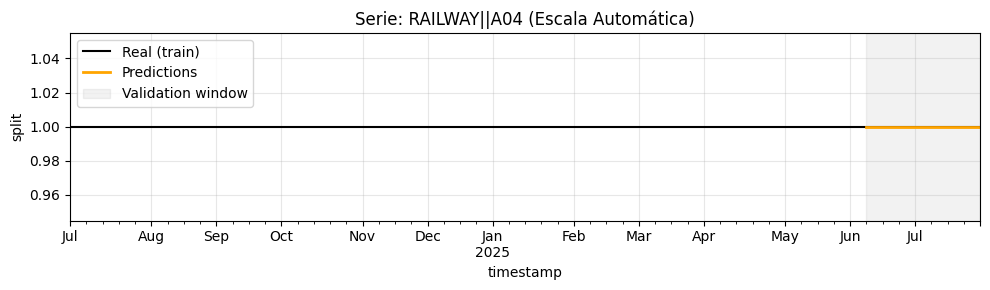

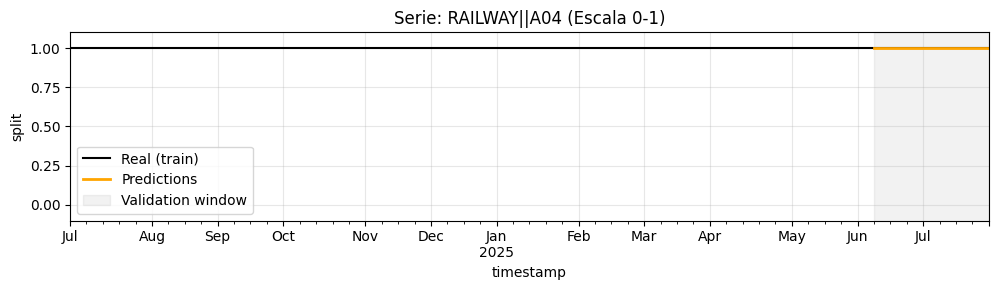


Serie: RAIN Sheath Transradial||A02D
        y  pred  abs_error
80    1.0   1.0        0.0
219   1.0   1.0        0.0
358   1.0   1.0        0.0
497   1.0   1.0        0.0
636   1.0   1.0        0.0
775   1.0   1.0        0.0
914   1.0   1.0        0.0
1053  1.0   1.0        0.0
MAE 0.000000


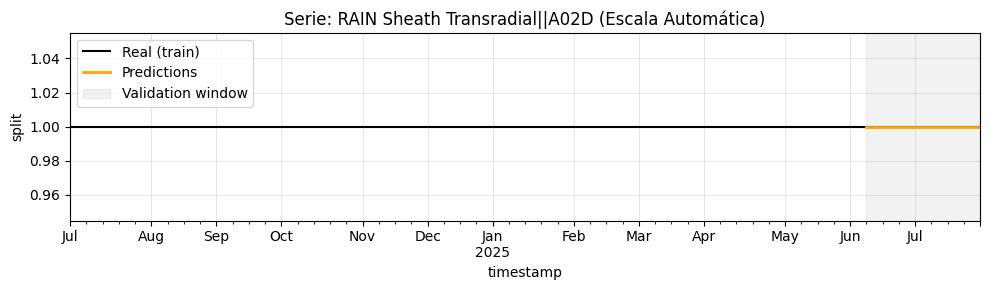

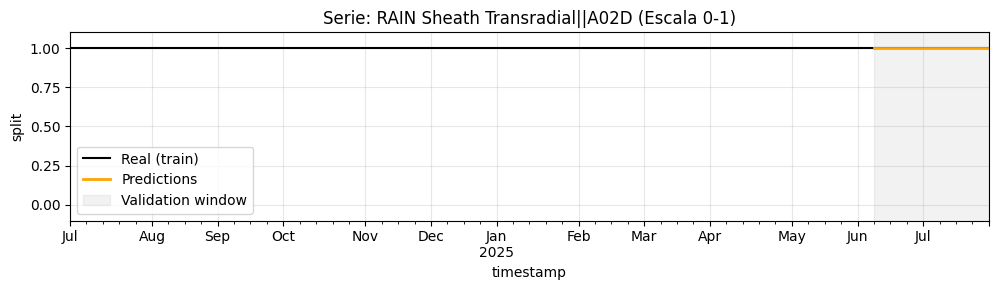


Serie: Rain Tibial/Pedal||A02D
        y  pred  abs_error
81    1.0   1.0        0.0
220   1.0   1.0        0.0
359   1.0   1.0        0.0
498   1.0   1.0        0.0
637   1.0   1.0        0.0
776   1.0   1.0        0.0
915   1.0   1.0        0.0
1054  1.0   1.0        0.0
MAE 0.000000


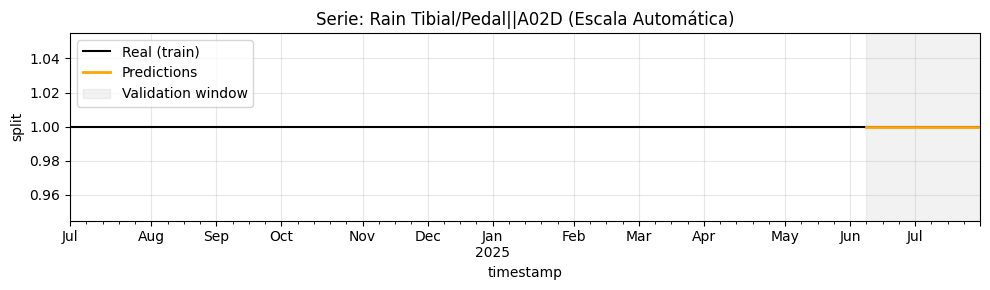

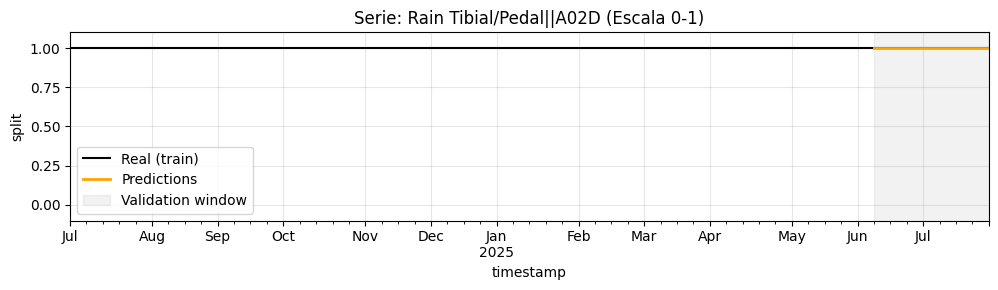


Serie: S.M.A.R.T. RADIANZ||T01D
        y  pred  abs_error
82    1.0   1.0        0.0
221   1.0   1.0        0.0
360   1.0   1.0        0.0
499   1.0   1.0        0.0
638   1.0   1.0        0.0
777   1.0   1.0        0.0
916   1.0   1.0        0.0
1055  1.0   1.0        0.0
MAE 0.000000


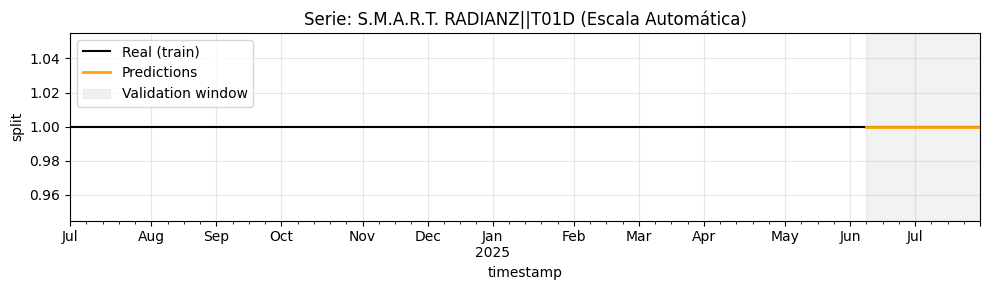

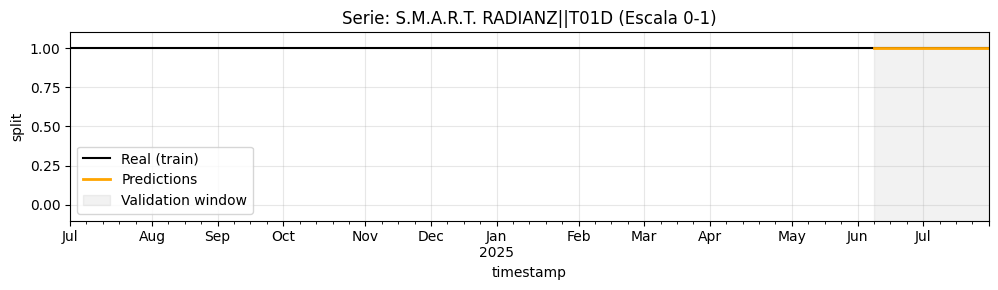


Serie: SABER||EM_D06
        y  pred  abs_error
88    1.0   1.0        0.0
227   1.0   1.0        0.0
366   1.0   1.0        0.0
505   1.0   1.0        0.0
644   1.0   1.0        0.0
783   1.0   1.0        0.0
922   1.0   1.0        0.0
1061  1.0   1.0        0.0
MAE 0.000000


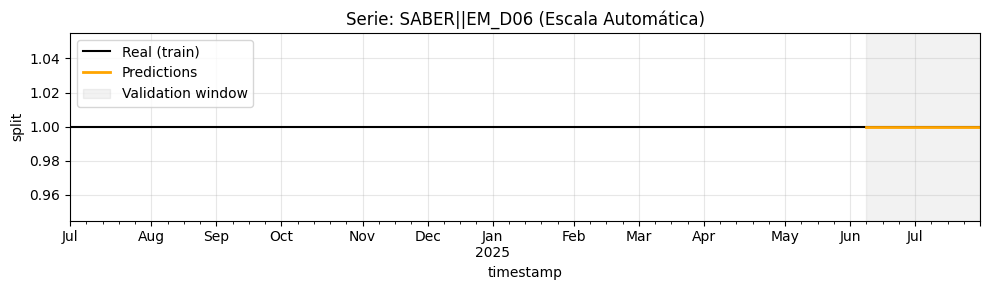

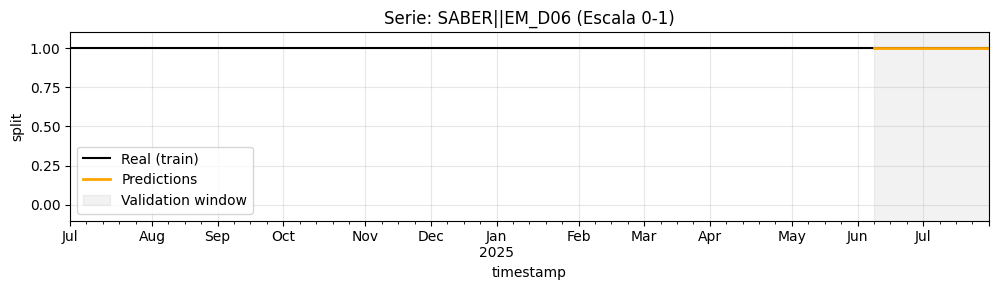


Serie: SABER .014||EM_O91
        y  pred  abs_error
83    1.0   1.0        0.0
222   1.0   1.0        0.0
361   1.0   1.0        0.0
500   1.0   1.0        0.0
639   1.0   1.0        0.0
778   1.0   1.0        0.0
917   1.0   1.0        0.0
1056  1.0   1.0        0.0
MAE 0.000000


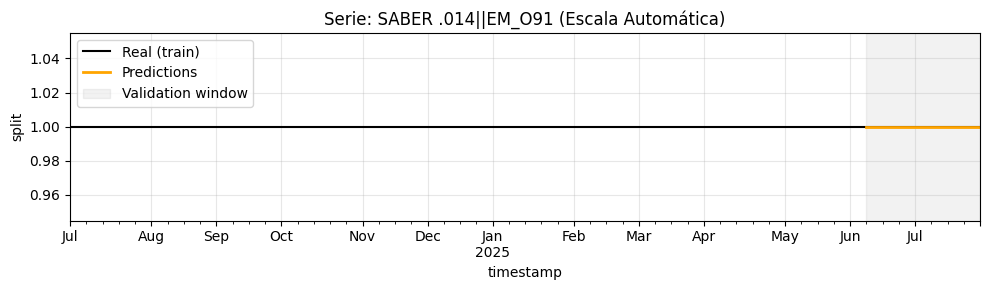

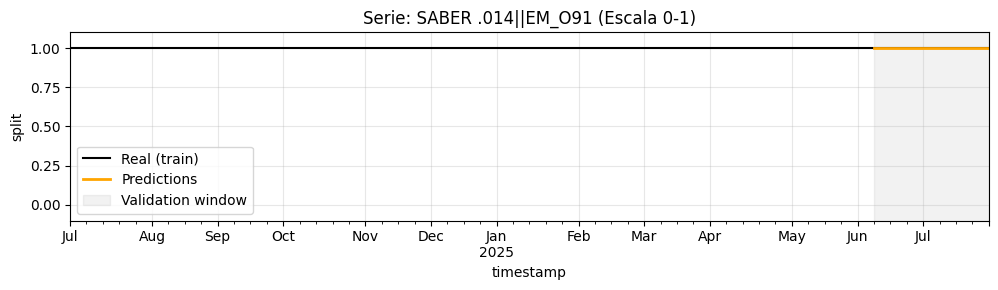


Serie: SABER .035||EM_D04
             y      pred  abs_error
84    0.999913  0.999845   0.000068
223   0.999908  0.999848   0.000061
362   0.999910  0.999834   0.000076
501   0.999912  0.999834   0.000079
640   0.999911  0.999834   0.000078
779   0.999910  0.999834   0.000076
918   0.999896  0.999834   0.000062
1057  0.999891  0.999834   0.000057
MAE 0.000069


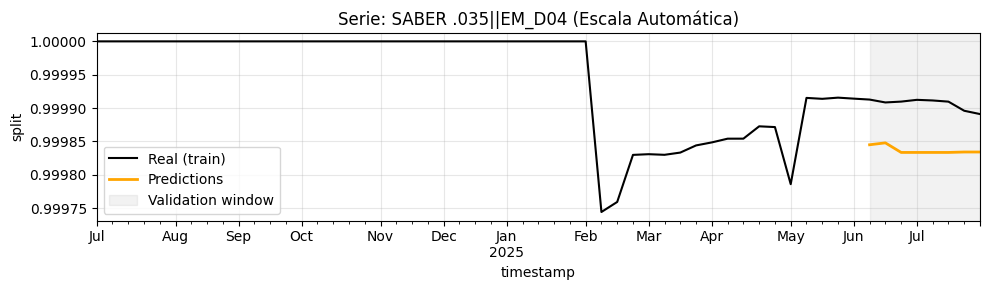

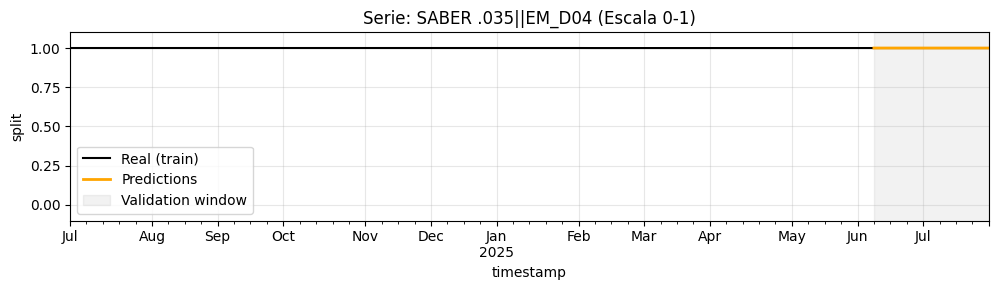


Serie: SABER .035||EM_D06
             y      pred  abs_error
85    0.000087  0.000155   0.000068
224   0.000092  0.000152   0.000061
363   0.000090  0.000166   0.000076
502   0.000088  0.000166   0.000079
641   0.000089  0.000166   0.000078
780   0.000090  0.000166   0.000076
919   0.000104  0.000166   0.000062
1058  0.000109  0.000166   0.000057
MAE 0.000069


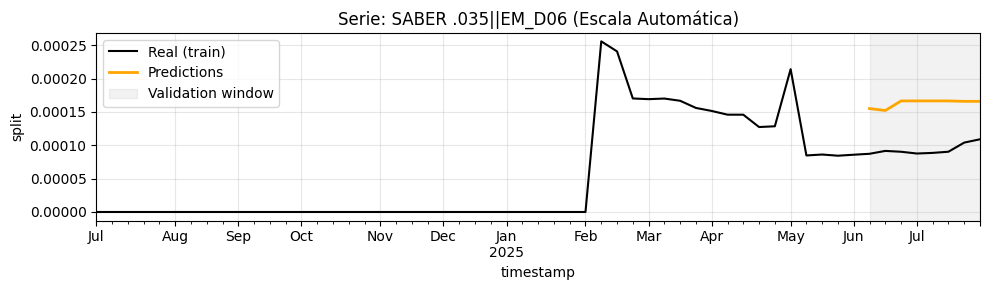

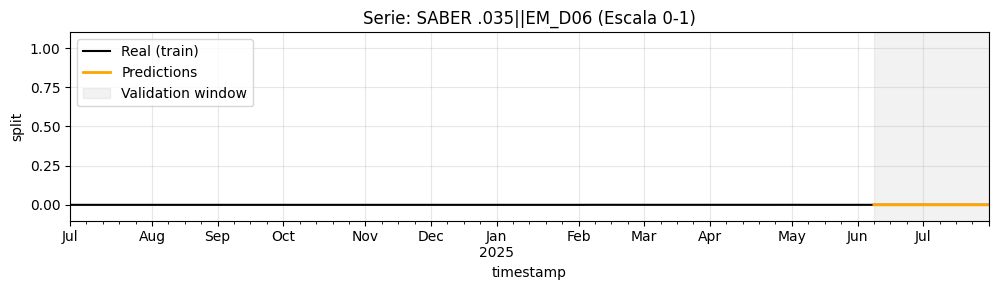


Serie: SABERX .014||EM_O91
        y  pred  abs_error
86    1.0   1.0        0.0
225   1.0   1.0        0.0
364   1.0   1.0        0.0
503   1.0   1.0        0.0
642   1.0   1.0        0.0
781   1.0   1.0        0.0
920   1.0   1.0        0.0
1059  1.0   1.0        0.0
MAE 0.000000


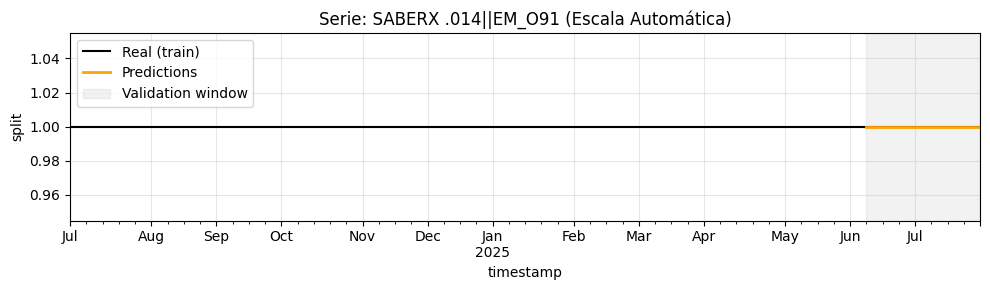

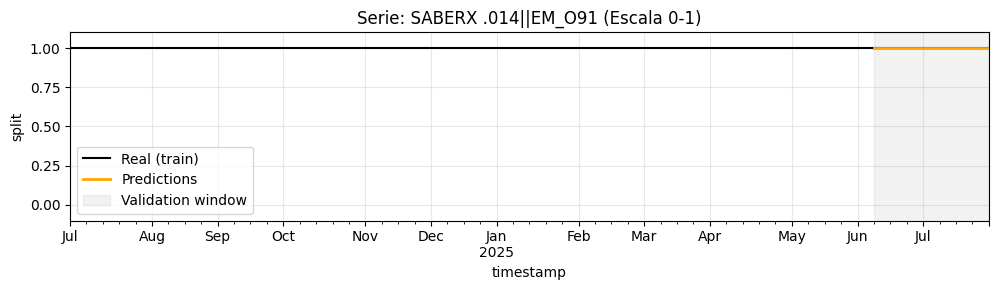


Serie: SABERX RADIANZ||EM_D06
        y  pred  abs_error
87    1.0   1.0        0.0
226   1.0   1.0        0.0
365   1.0   1.0        0.0
504   1.0   1.0        0.0
643   1.0   1.0        0.0
782   1.0   1.0        0.0
921   1.0   1.0        0.0
1060  1.0   1.0        0.0
MAE 0.000000


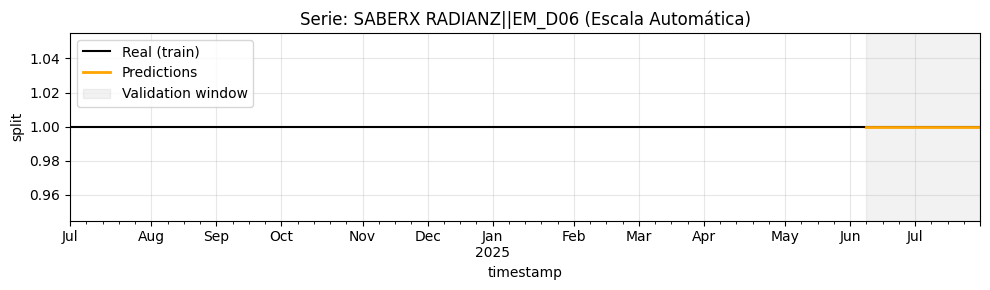

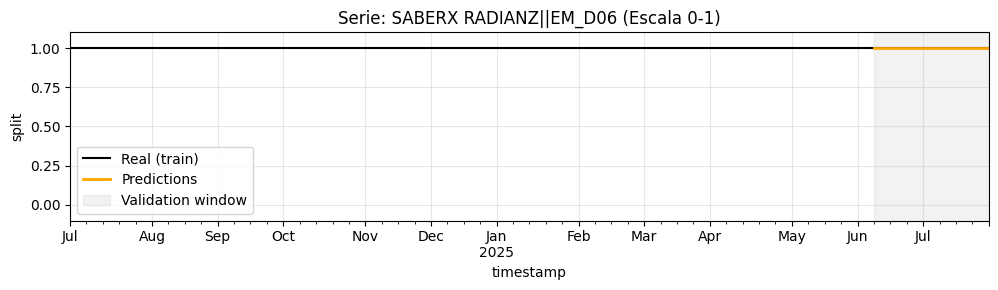


Serie: SHINOBI||EM_L51
        y  pred  abs_error
89    1.0   1.0        0.0
228   1.0   1.0        0.0
367   1.0   1.0        0.0
506   1.0   1.0        0.0
645   1.0   1.0        0.0
784   1.0   1.0        0.0
923   1.0   1.0        0.0
1062  1.0   1.0        0.0
MAE 0.000000


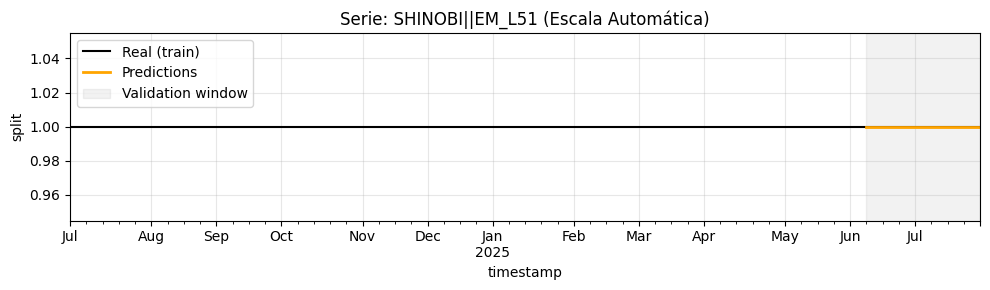

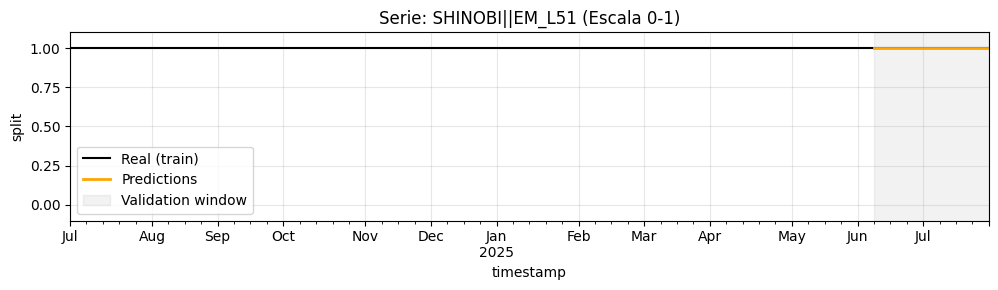


Serie: SLALOM||EM_D03
        y  pred  abs_error
90    1.0   1.0        0.0
229   1.0   1.0        0.0
368   1.0   1.0        0.0
507   1.0   1.0        0.0
646   1.0   1.0        0.0
785   1.0   1.0        0.0
924   1.0   1.0        0.0
1063  1.0   1.0        0.0
MAE 0.000000


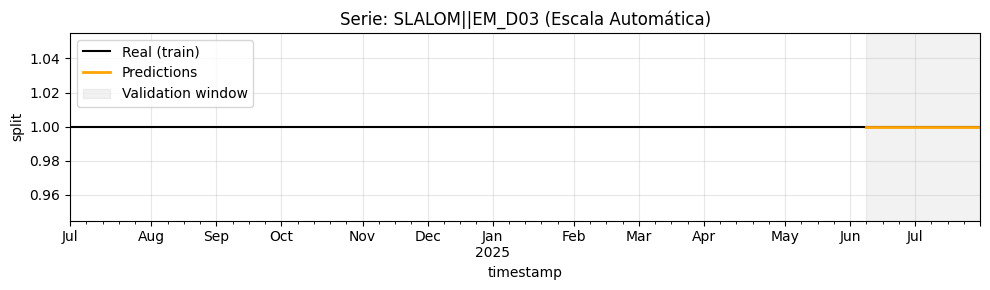

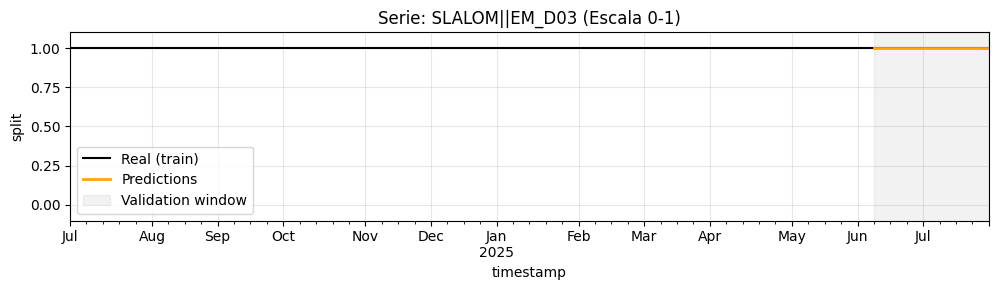


Serie: SLEEK||EM_O07_NL
        y  pred  abs_error
92    1.0   1.0        0.0
231   1.0   1.0        0.0
370   1.0   1.0        0.0
509   1.0   1.0        0.0
648   1.0   1.0        0.0
787   1.0   1.0        0.0
926   1.0   1.0        0.0
1065  1.0   1.0        0.0
MAE 0.000000


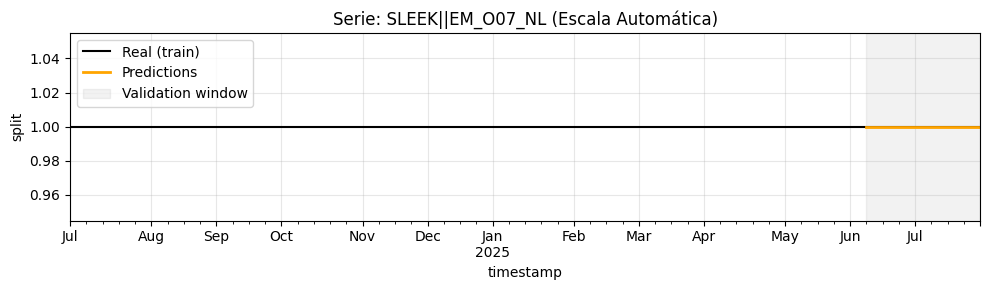

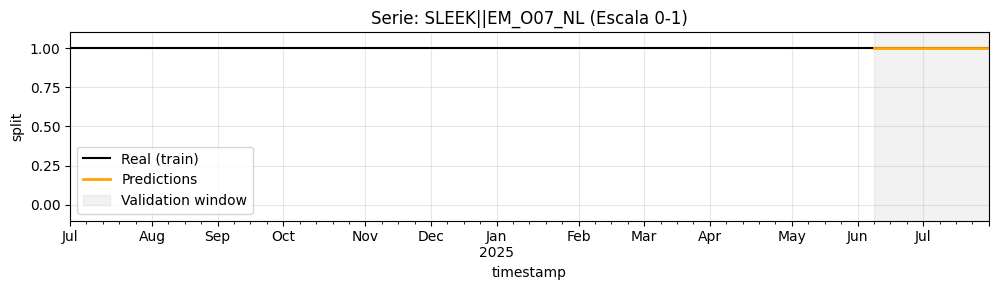


Serie: SLEEK OTW||EM_O07_NL
        y  pred  abs_error
91    1.0   1.0        0.0
230   1.0   1.0        0.0
369   1.0   1.0        0.0
508   1.0   1.0        0.0
647   1.0   1.0        0.0
786   1.0   1.0        0.0
925   1.0   1.0        0.0
1064  1.0   1.0        0.0
MAE 0.000000


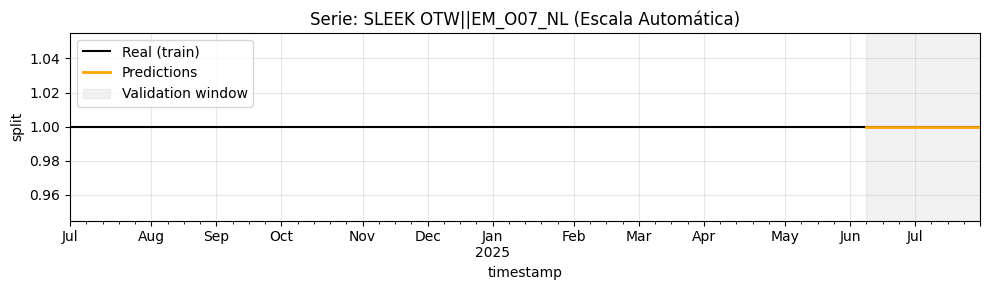

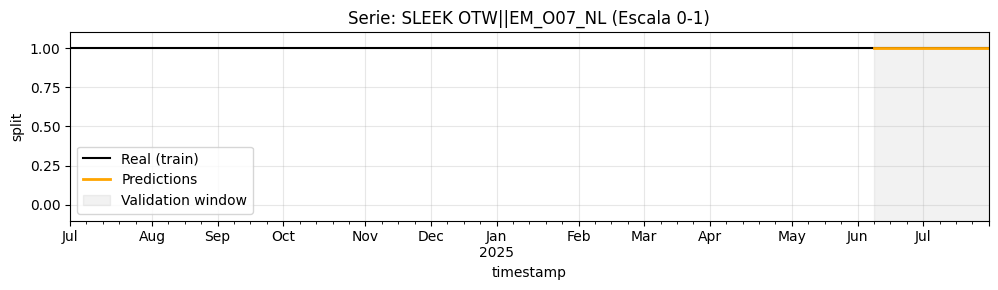


Serie: SMART||T01A
             y      pred  abs_error
94    0.109343  0.119483   0.010140
233   0.114728  0.116400   0.001672
372   0.114268  0.115762   0.001494
511   0.113423  0.115762   0.002339
650   0.112060  0.115762   0.003702
789   0.110283  0.115762   0.005479
928   0.127303  0.115762   0.011541
1067  0.124528  0.115762   0.008766
MAE 0.005642


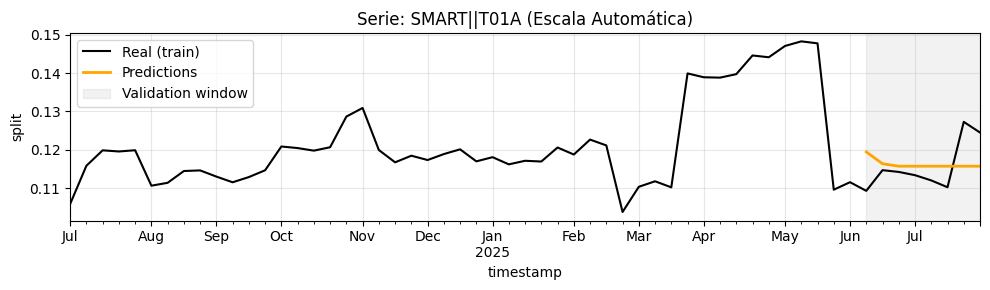

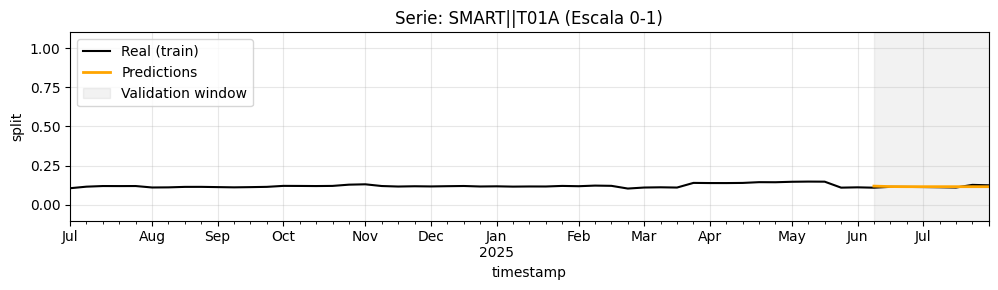


Serie: SMART||T01B
             y      pred  abs_error
95    0.106653  0.109534   0.002881
234   0.107282  0.109517   0.002235
373   0.104150  0.109735   0.005585
512   0.095725  0.109735   0.014009
651   0.096599  0.109735   0.013135
790   0.098038  0.109735   0.011697
929   0.109524  0.109735   0.000211
1068  0.109602  0.109735   0.000133
MAE 0.006236


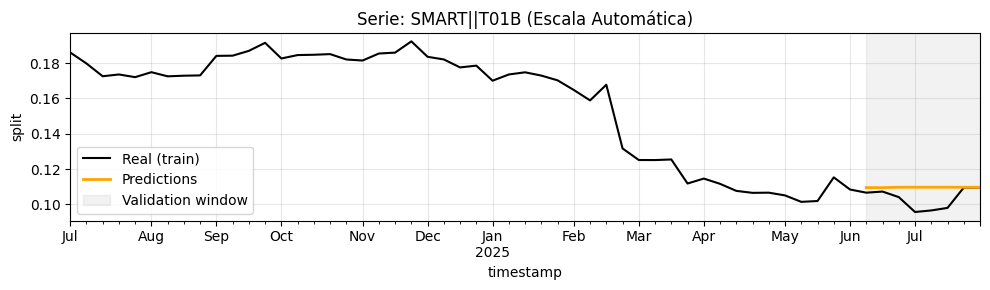

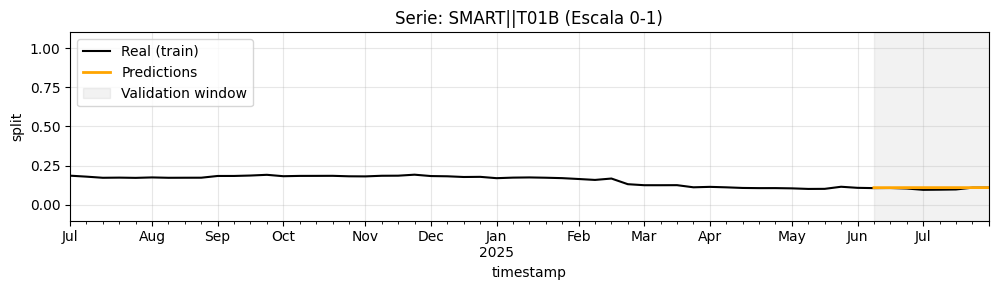


Serie: SMART||T01C
             y      pred  abs_error
96    0.784004  0.770983   0.013021
235   0.777990  0.774083   0.003907
374   0.781582  0.774503   0.007078
513   0.790852  0.774503   0.016349
652   0.791341  0.774503   0.016837
791   0.791679  0.774503   0.017176
930   0.763173  0.774503   0.011331
1069  0.765870  0.774503   0.008633
MAE 0.011792


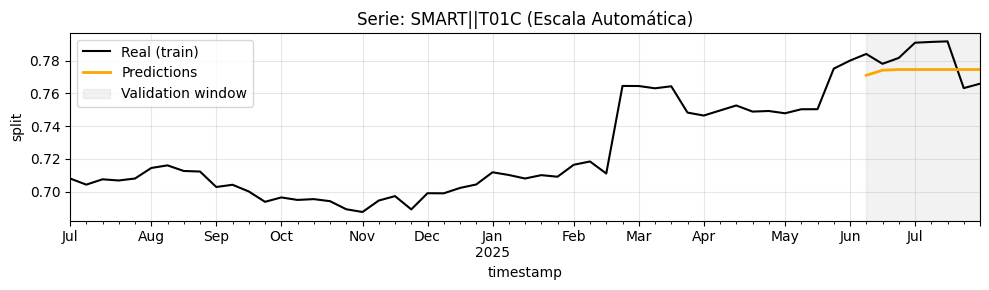

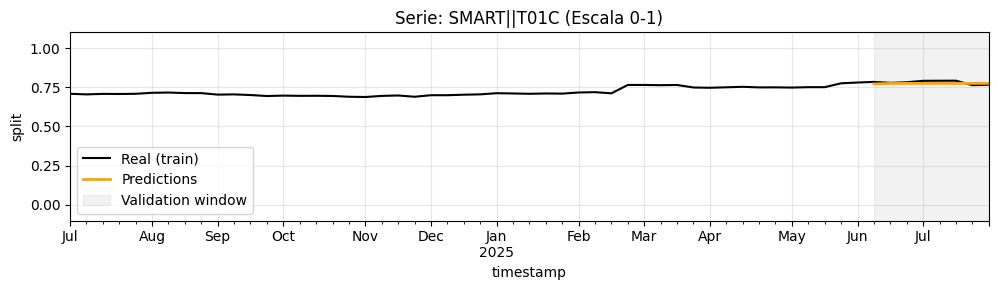


Serie: SMART FLEX||EM_O79
        y  pred  abs_error
93    1.0   1.0        0.0
232   1.0   1.0        0.0
371   1.0   1.0        0.0
510   1.0   1.0        0.0
649   1.0   1.0        0.0
788   1.0   1.0        0.0
927   1.0   1.0        0.0
1066  1.0   1.0        0.0
MAE 0.000000


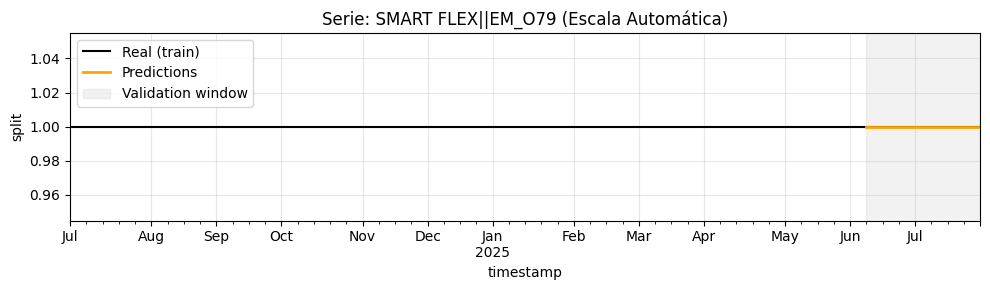

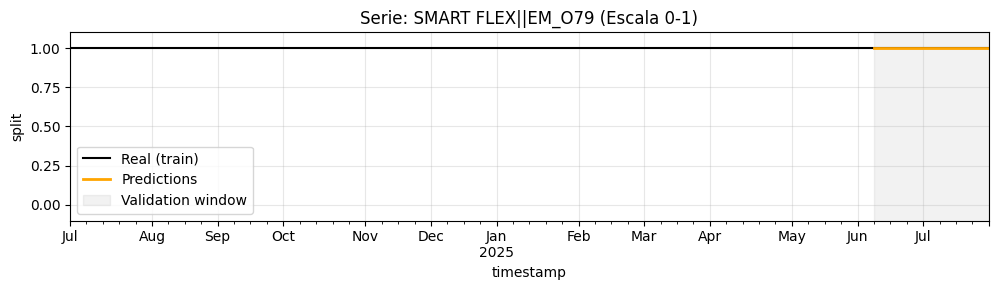


Serie: STABILIZER||EM_K60
        y  pred  abs_error
97    1.0   1.0        0.0
236   1.0   1.0        0.0
375   1.0   1.0        0.0
514   1.0   1.0        0.0
653   1.0   1.0        0.0
792   1.0   1.0        0.0
931   1.0   1.0        0.0
1070  1.0   1.0        0.0
MAE 0.000000


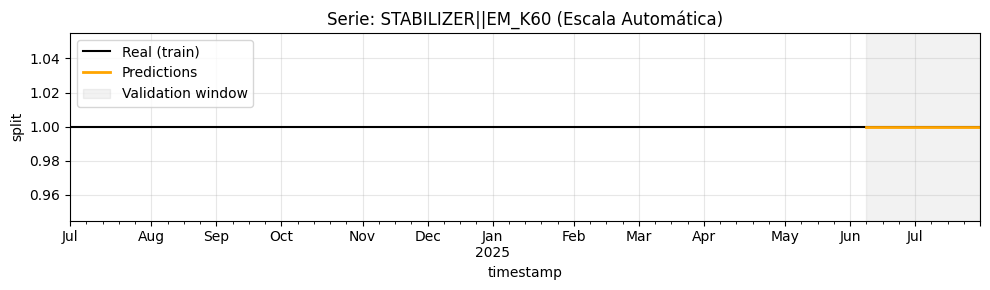

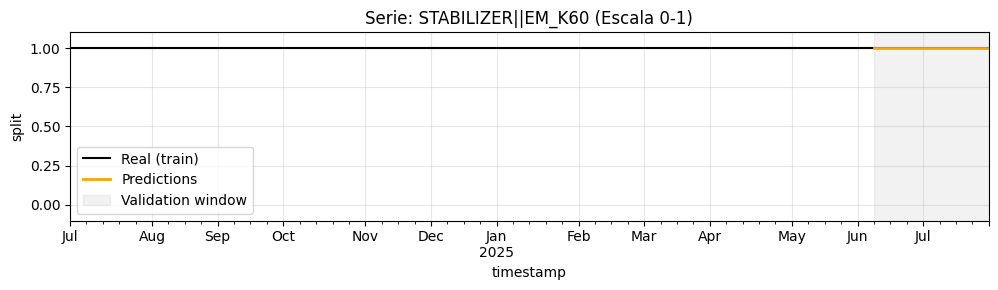


Serie: STORQ||EM_L60
        y  pred  abs_error
98    1.0   1.0        0.0
237   1.0   1.0        0.0
376   1.0   1.0        0.0
515   1.0   1.0        0.0
654   1.0   1.0        0.0
793   1.0   1.0        0.0
932   1.0   1.0        0.0
1071  1.0   1.0        0.0
MAE 0.000000


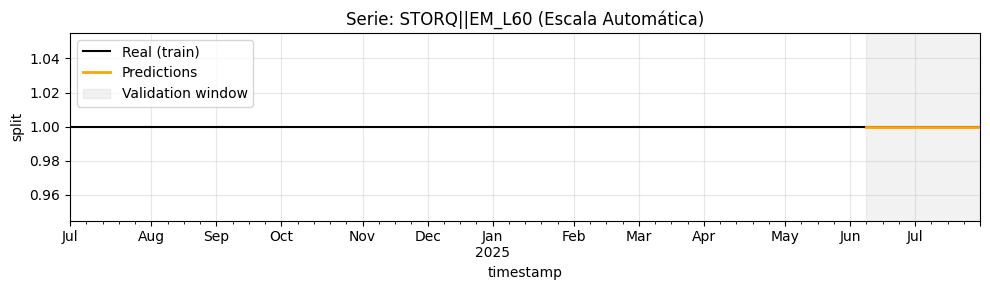

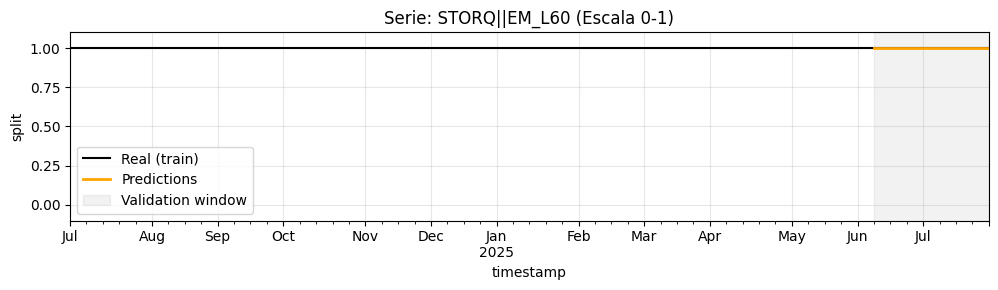


Serie: SUPER TORQUE MARKER BANDS||C04E
        y  pred  abs_error
99    1.0   1.0        0.0
238   1.0   1.0        0.0
377   1.0   1.0        0.0
516   1.0   1.0        0.0
655   1.0   1.0        0.0
794   1.0   1.0        0.0
933   1.0   1.0        0.0
1072  1.0   1.0        0.0
MAE 0.000000


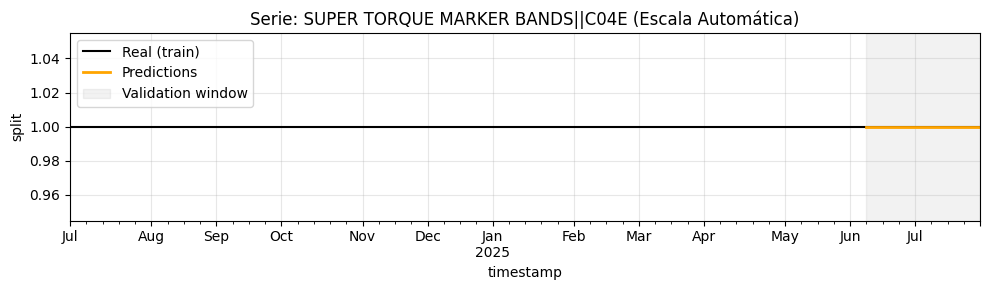

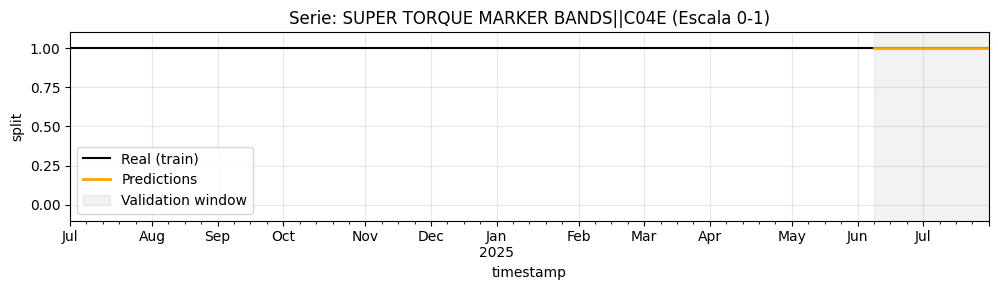


Serie: SUPERTORQUE||C03D
             y      pred  abs_error
107   0.138098  0.146585   0.008487
246   0.153938  0.150672   0.003266
385   0.151291  0.150476   0.000814
524   0.151913  0.150834   0.001079
663   0.148636  0.150821   0.002185
802   0.152068  0.150878   0.001191
941   0.136866  0.150883   0.014017
1080  0.134617  0.150889   0.016272
MAE 0.005914


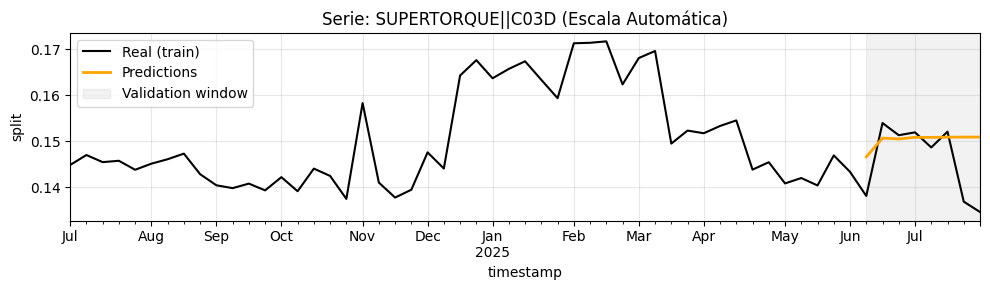

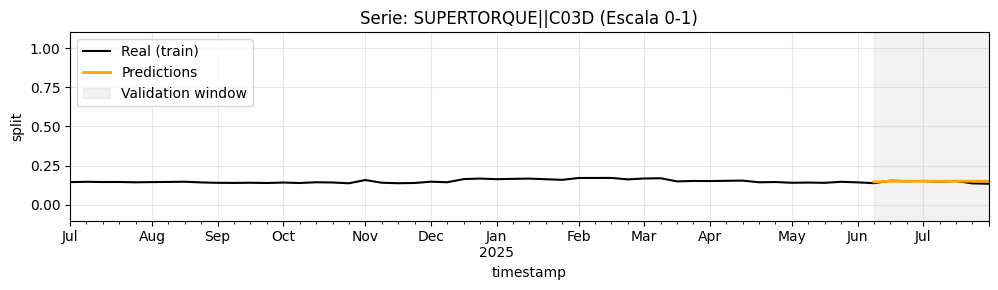


Serie: SUPERTORQUE||C03E
             y      pred  abs_error
108   0.170590  0.170491   0.000099
247   0.166437  0.168460   0.002023
386   0.167912  0.168248   0.000337
525   0.165898  0.166161   0.000264
664   0.166872  0.166147   0.000725
803   0.166801  0.166209   0.000592
942   0.176183  0.166215   0.009968
1081  0.174841  0.166222   0.008619
MAE 0.002828


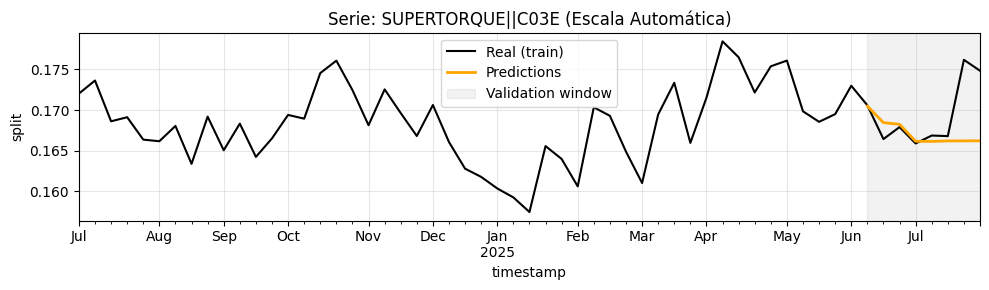

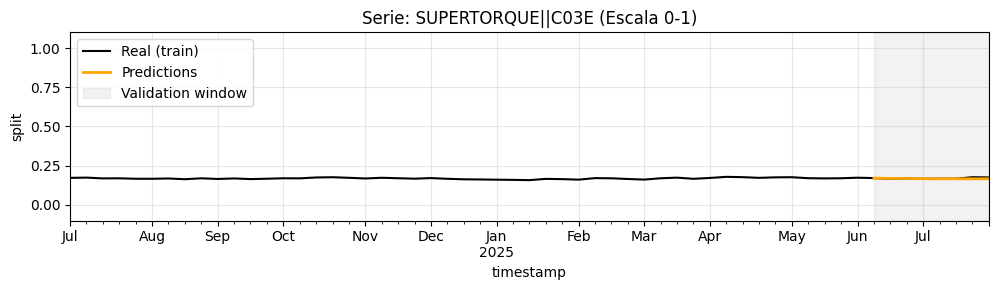


Serie: SUPERTORQUE||C04A
             y      pred  abs_error
109   0.003513  0.002891   0.000623
248   0.006003  0.002854   0.003149
387   0.005885  0.003283   0.002602
526   0.005787  0.003402   0.002385
665   0.005983  0.003488   0.002496
804   0.005950  0.003114   0.002836
943   0.001357  0.003081   0.001724
1082  0.001410  0.003037   0.001628
MAE 0.002180


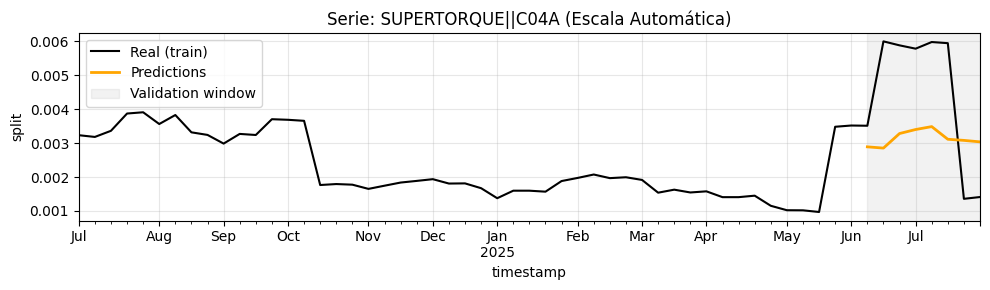

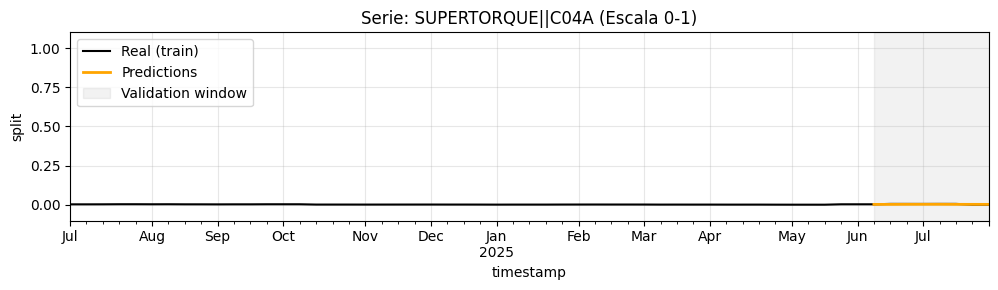


Serie: SUPERTORQUE||C12C
             y      pred  abs_error
110   0.687798  0.680033   0.007766
249   0.673622  0.678014   0.004393
388   0.674912  0.677992   0.003080
527   0.676401  0.679603   0.003201
666   0.678509  0.679544   0.001035
805   0.675181  0.679799   0.004618
944   0.685595  0.679822   0.005773
1083  0.689132  0.679851   0.009281
MAE 0.004893


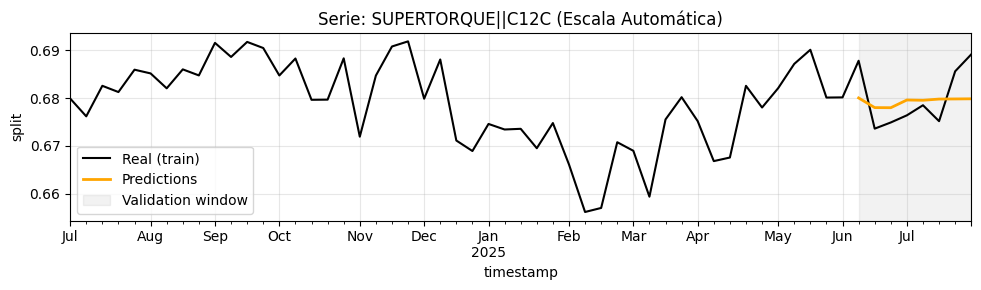

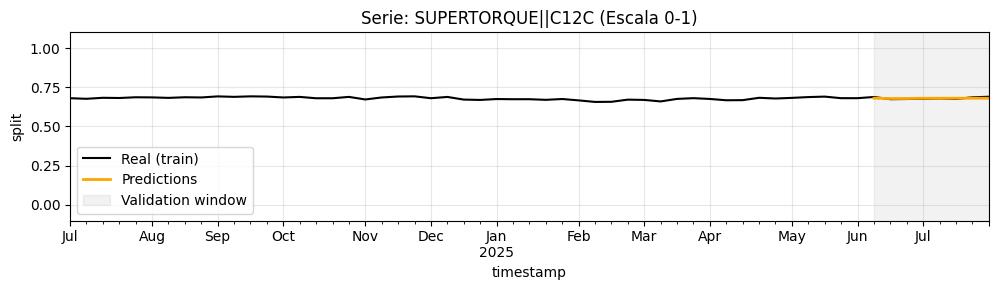


Serie: SUPERTORQUE (MODIFIED)||C05
        y  pred  abs_error
100   1.0   1.0        0.0
239   1.0   1.0        0.0
378   1.0   1.0        0.0
517   1.0   1.0        0.0
656   1.0   1.0        0.0
795   1.0   1.0        0.0
934   1.0   1.0        0.0
1073  1.0   1.0        0.0
MAE 0.000000


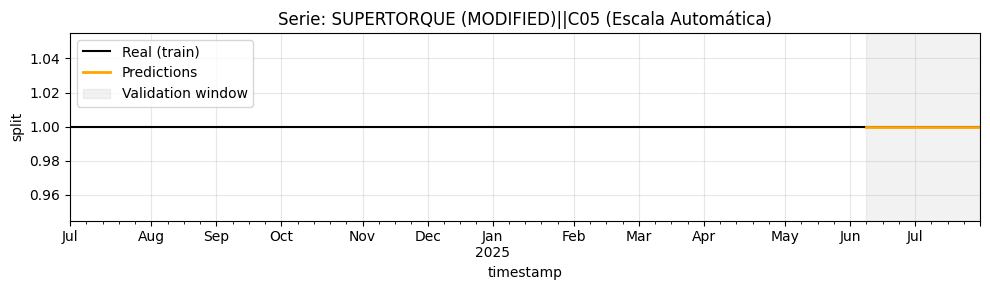

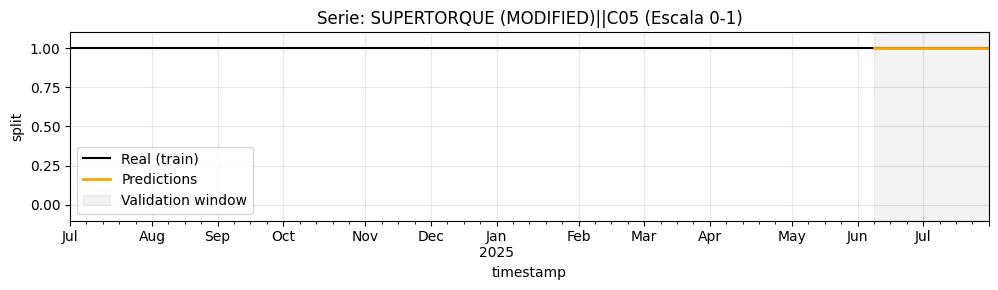


Serie: SUPERTORQUE PLUS||C03C
             y      pred  abs_error
103   0.520588  0.520942   0.000354
242   0.528560  0.522730   0.005830
381   0.524875  0.522365   0.002509
520   0.514049  0.522365   0.008317
659   0.506665  0.522365   0.015700
798   0.503464  0.522365   0.018902
937   0.514391  0.522365   0.007974
1076  0.511249  0.522365   0.011116
MAE 0.008838


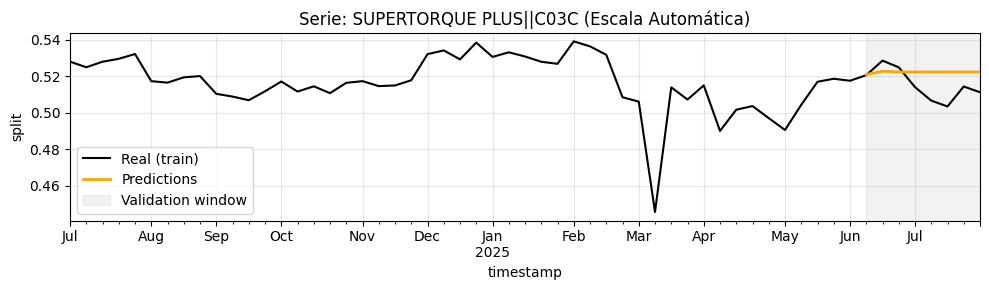

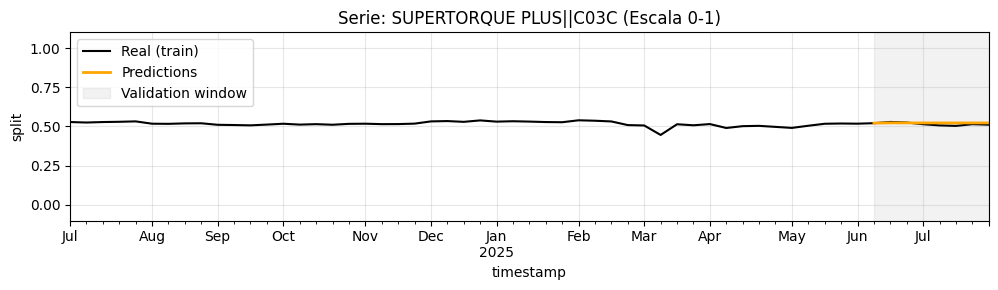


Serie: SUPERTORQUE PLUS||C04B
        y          pred     abs_error
104   0.0  9.771723e-07  9.771723e-07
243   0.0  9.559226e-07  9.559226e-07
382   0.0  9.840538e-07  9.840538e-07
521   0.0  9.840538e-07  9.840538e-07
660   0.0  9.840538e-07  9.840538e-07
799   0.0  9.840538e-07  9.840538e-07
938   0.0  9.802653e-07  9.802653e-07
1077  0.0  9.688429e-07  9.688429e-07
MAE 0.000001


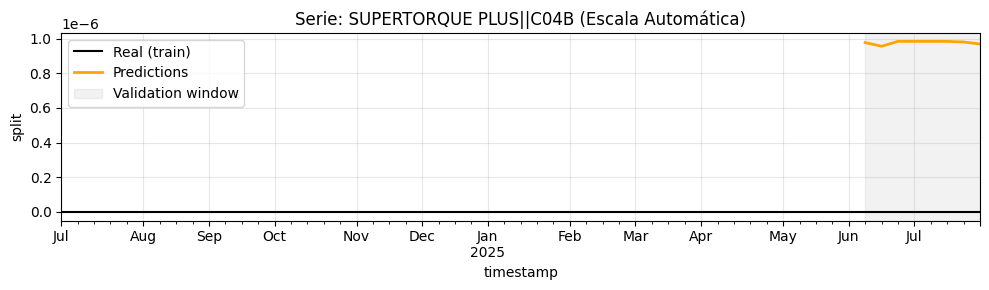

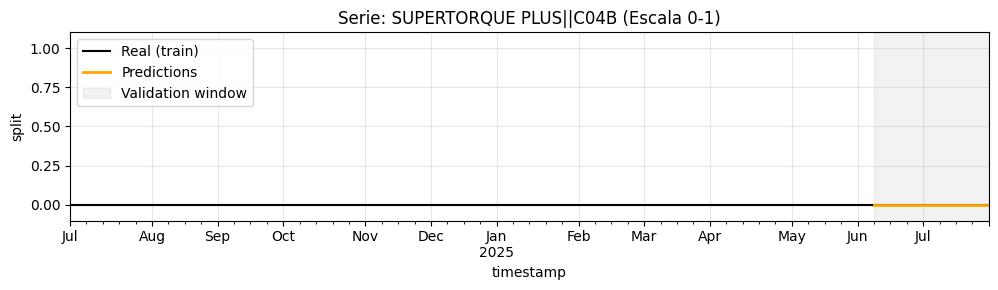


Serie: SUPERTORQUE PLUS||C04C
             y      pred  abs_error
105   0.008357  0.007841   0.000516
244   0.008503  0.007556   0.000947
383   0.008613  0.008308   0.000305
522   0.008704  0.008308   0.000396
661   0.008536  0.008308   0.000228
800   0.008509  0.008308   0.000201
939   0.008983  0.008308   0.000675
1078  0.008951  0.008308   0.000644
MAE 0.000489


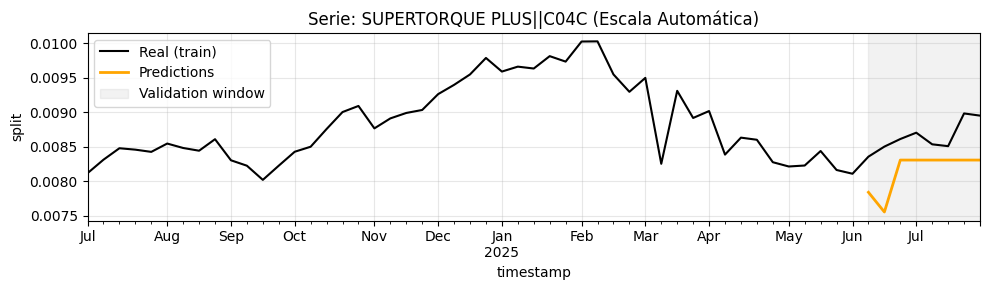

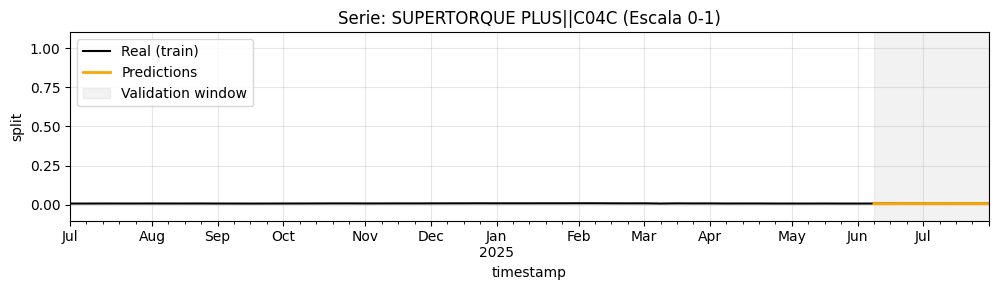


Serie: SUPERTORQUE PLUS||C12D
             y      pred  abs_error
106   0.471055  0.471216   0.000161
245   0.462938  0.469714   0.006776
384   0.466513  0.469326   0.002813
523   0.477247  0.469326   0.007921
662   0.484799  0.469326   0.015473
801   0.488027  0.469326   0.018701
940   0.476626  0.469326   0.007300
1079  0.479799  0.469326   0.010474
MAE 0.008702


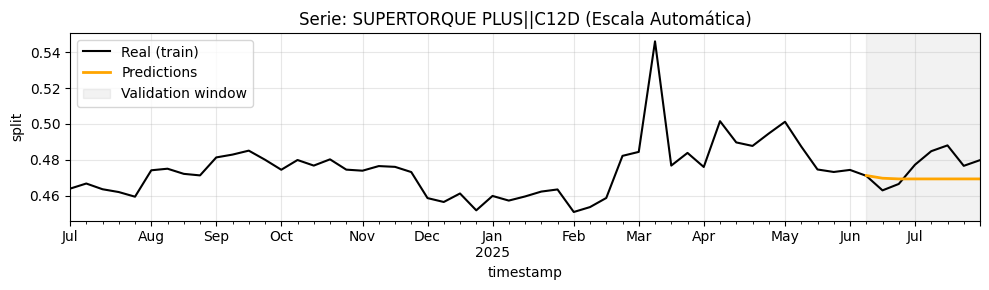

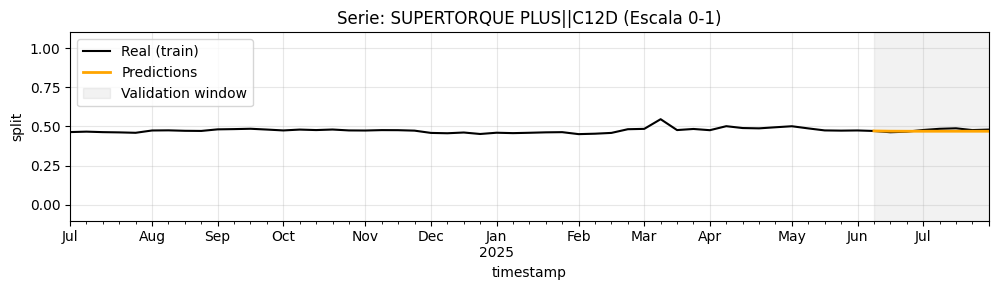


Serie: SUPERTORQUE PLUS (MODIFIED)||C04B
             y      pred  abs_error
101   0.187826  0.194835   0.007009
240   0.201433  0.192883   0.008550
379   0.200450  0.192379   0.008071
518   0.190206  0.192041   0.001835
657   0.187729  0.192041   0.004312
796   0.183224  0.192041   0.008817
935   0.193582  0.192041   0.001541
1074  0.190611  0.192041   0.001431
MAE 0.005196


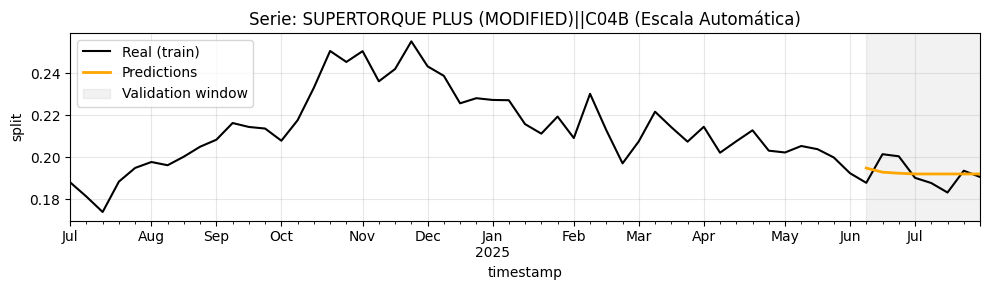

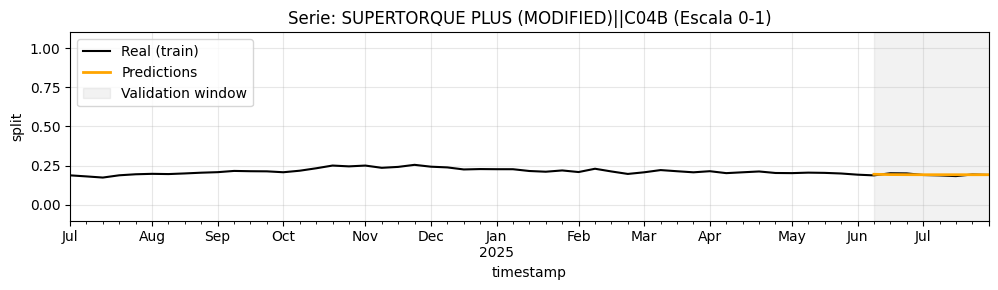


Serie: SUPERTORQUE PLUS (MODIFIED)||C05
             y      pred  abs_error
102   0.812174  0.805165   0.007009
241   0.798567  0.807117   0.008550
380   0.799550  0.807621   0.008071
519   0.809794  0.807959   0.001835
658   0.812271  0.807959   0.004312
797   0.816776  0.807959   0.008817
936   0.806418  0.807959   0.001541
1075  0.809389  0.807959   0.001431
MAE 0.005196


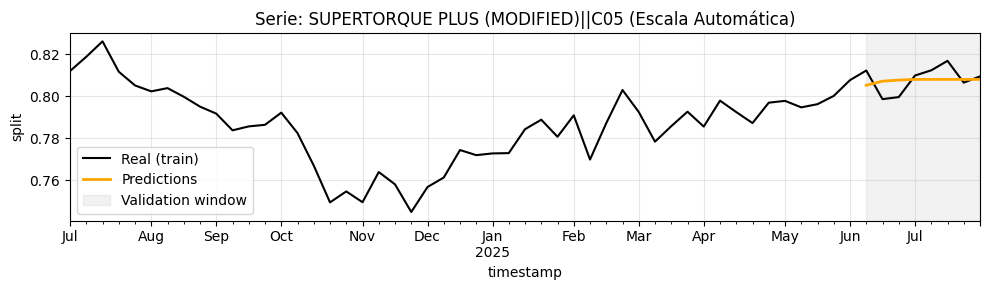

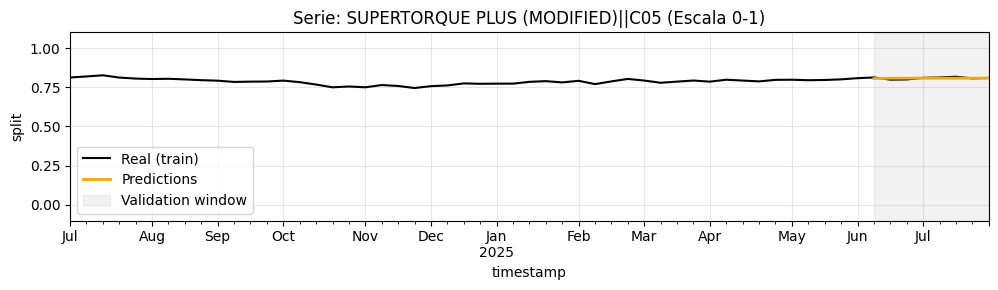


Serie: SV WIRE||EM_K60
        y  pred  abs_error
111   1.0   1.0        0.0
250   1.0   1.0        0.0
389   1.0   1.0        0.0
528   1.0   1.0        0.0
667   1.0   1.0        0.0
806   1.0   1.0        0.0
945   1.0   1.0        0.0
1084  1.0   1.0        0.0
MAE 0.000000


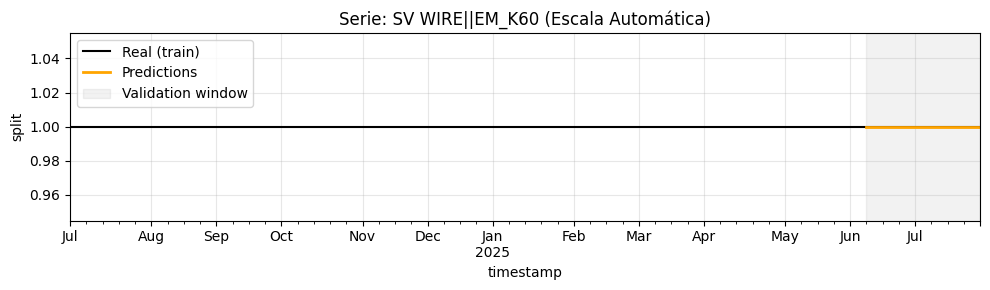

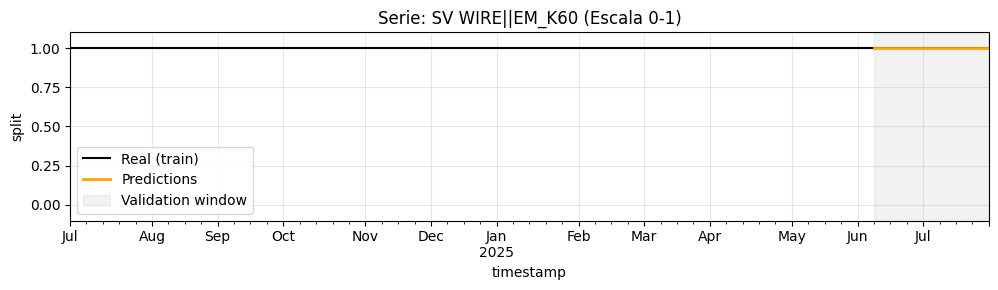


Serie: Selution SLR BTK 2-3.5||EM_O92
        y  pred  abs_error
112   1.0   1.0        0.0
251   1.0   1.0        0.0
390   1.0   1.0        0.0
529   1.0   1.0        0.0
668   1.0   1.0        0.0
807   1.0   1.0        0.0
946   1.0   1.0        0.0
1085  1.0   1.0        0.0
MAE 0.000000


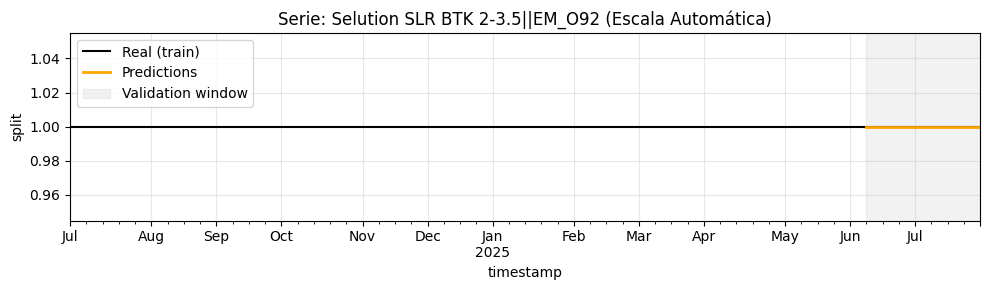

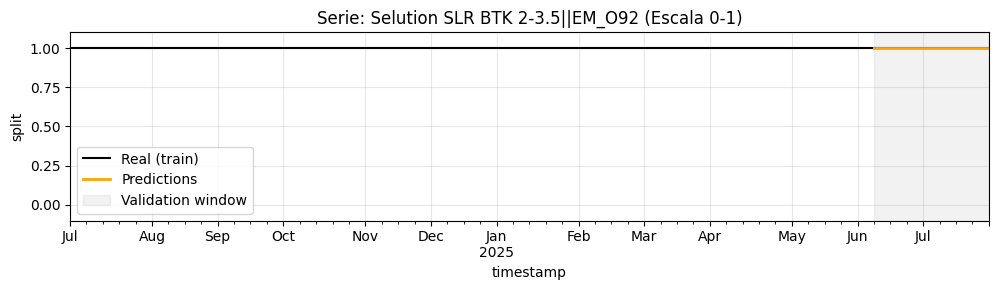


Serie: Selution SLR Coronary||EM_O92
        y  pred  abs_error
113   1.0   1.0        0.0
252   1.0   1.0        0.0
391   1.0   1.0        0.0
530   1.0   1.0        0.0
669   1.0   1.0        0.0
808   1.0   1.0        0.0
947   1.0   1.0        0.0
1086  1.0   1.0        0.0
MAE 0.000000


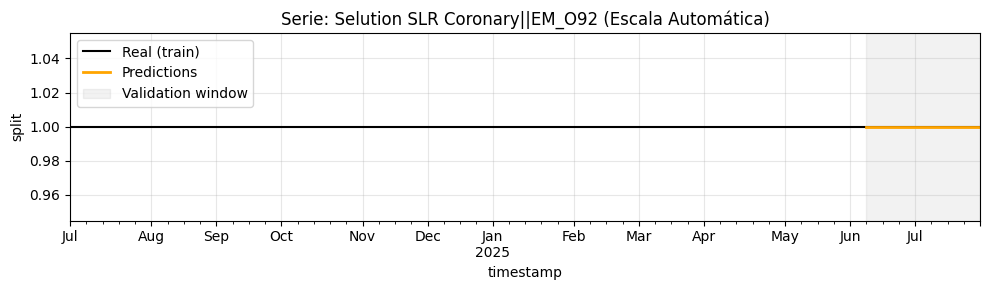

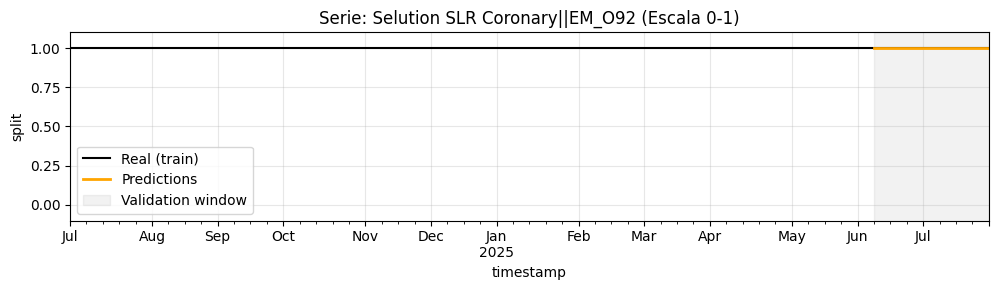


Serie: Selution SLR SFA 4-7||EM_O92
        y  pred  abs_error
114   1.0   1.0        0.0
253   1.0   1.0        0.0
392   1.0   1.0        0.0
531   1.0   1.0        0.0
670   1.0   1.0        0.0
809   1.0   1.0        0.0
948   1.0   1.0        0.0
1087  1.0   1.0        0.0
MAE 0.000000


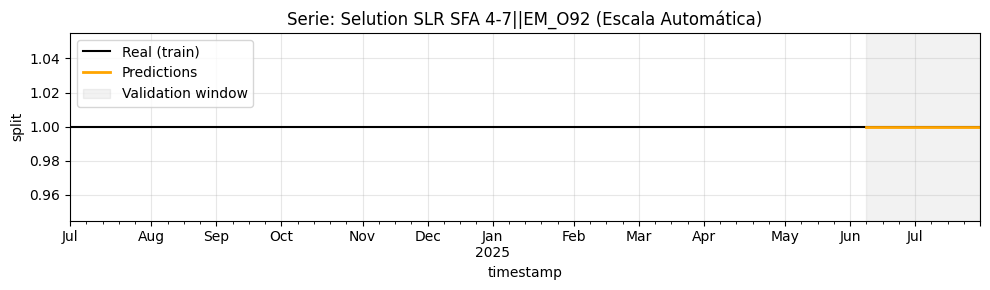

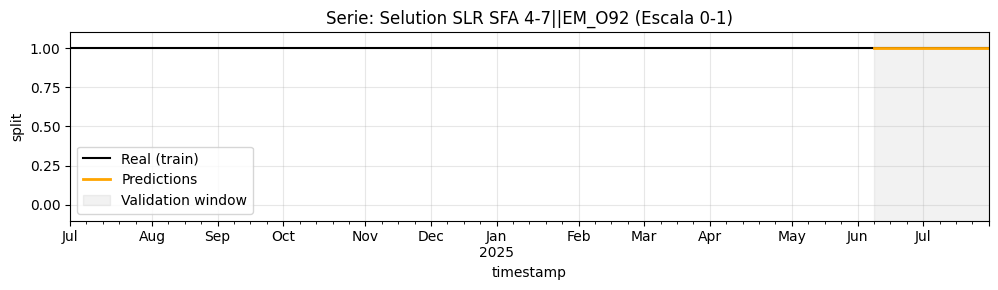


Serie: TEMPO||C03F
             y      pred  abs_error
118   0.349160  0.341035   0.008125
257   0.295459  0.334430   0.038971
396   0.302825  0.334256   0.031431
535   0.297268  0.334425   0.037157
674   0.298109  0.334653   0.036544
813   0.299414  0.334653   0.035240
952   0.325883  0.332881   0.006998
1091  0.327137  0.332881   0.005743
MAE 0.025026


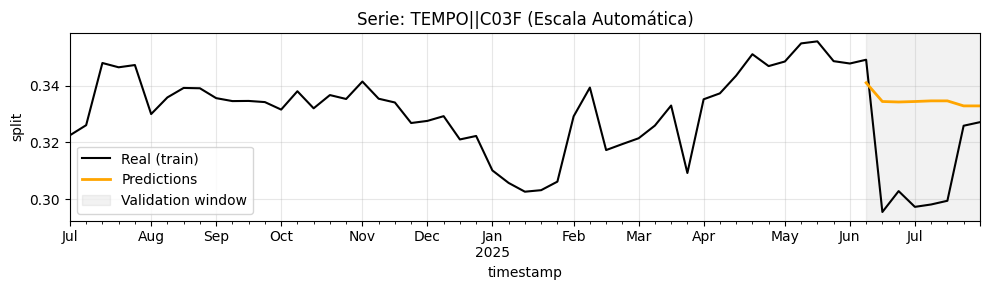

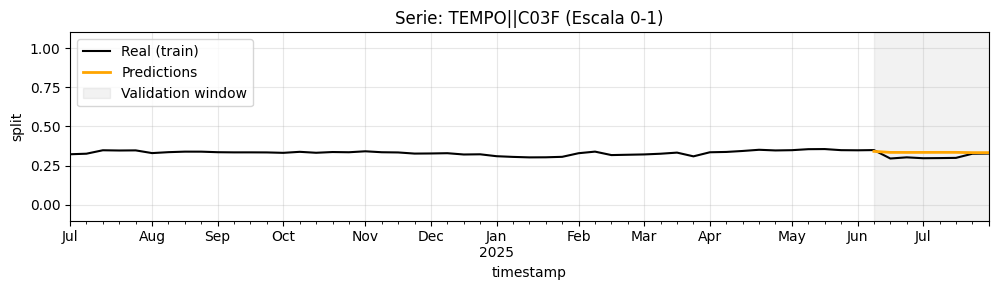


Serie: TEMPO||C03G
             y      pred  abs_error
119   0.650840  0.658965   0.008125
258   0.704541  0.665570   0.038971
397   0.697175  0.665744   0.031431
536   0.702732  0.665575   0.037157
675   0.701891  0.665347   0.036544
814   0.700586  0.665347   0.035240
953   0.674117  0.667119   0.006998
1092  0.672863  0.667119   0.005743
MAE 0.025026


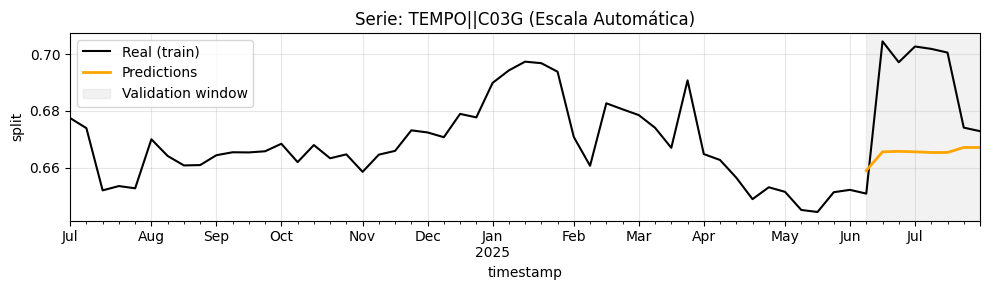

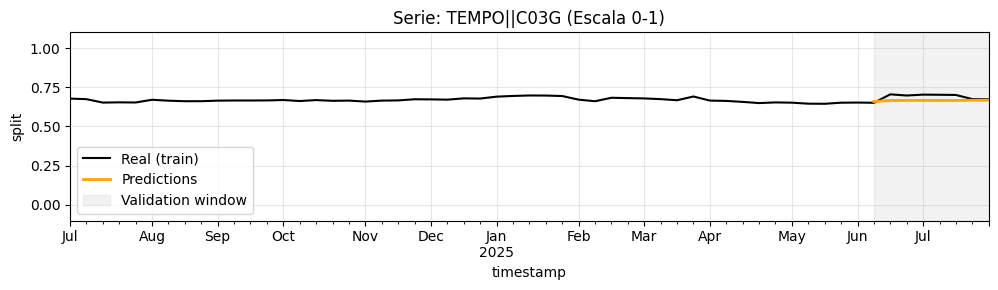


Serie: TEMPO (MODIFIED)||C05
        y  pred  abs_error
115   1.0   1.0        0.0
254   1.0   1.0        0.0
393   1.0   1.0        0.0
532   1.0   1.0        0.0
671   1.0   1.0        0.0
810   1.0   1.0        0.0
949   1.0   1.0        0.0
1088  1.0   1.0        0.0
MAE 0.000000


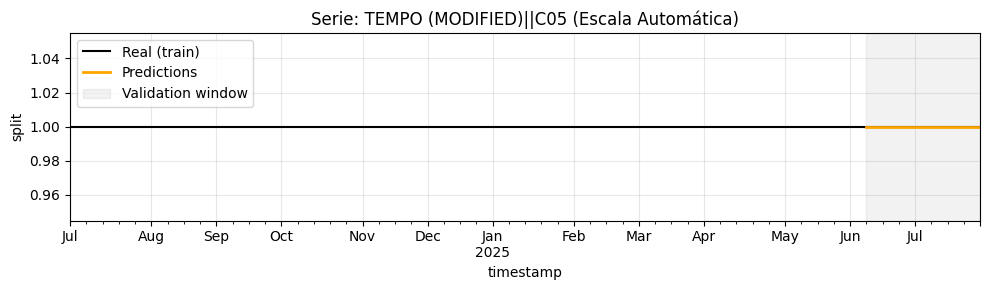

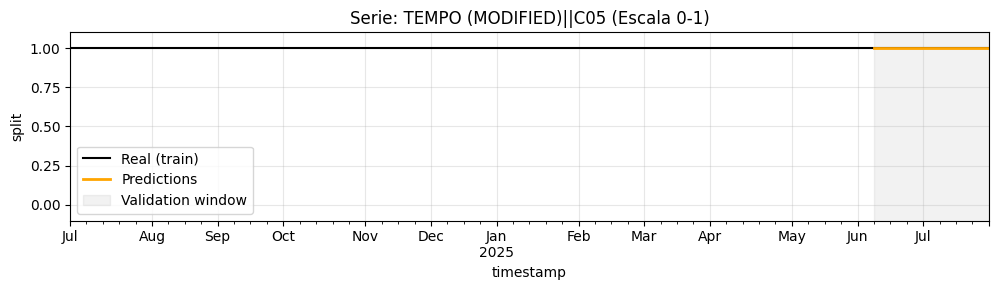


Serie: TEMPO AQUA||C03H
        y  pred  abs_error
117   1.0   1.0        0.0
256   1.0   1.0        0.0
395   1.0   1.0        0.0
534   1.0   1.0        0.0
673   1.0   1.0        0.0
812   1.0   1.0        0.0
951   1.0   1.0        0.0
1090  1.0   1.0        0.0
MAE 0.000000


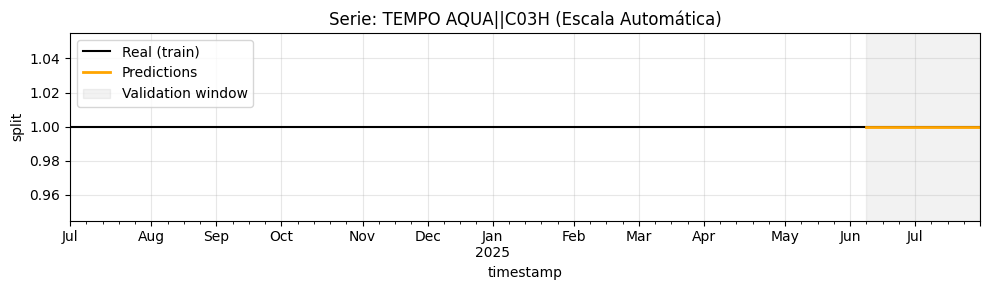

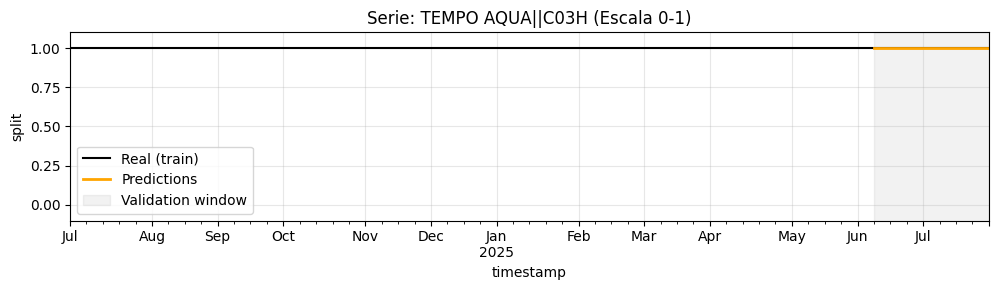


Serie: TEMPO AQUA (MODIFIED)||C05
        y  pred  abs_error
116   1.0   1.0        0.0
255   1.0   1.0        0.0
394   1.0   1.0        0.0
533   1.0   1.0        0.0
672   1.0   1.0        0.0
811   1.0   1.0        0.0
950   1.0   1.0        0.0
1089  1.0   1.0        0.0
MAE 0.000000


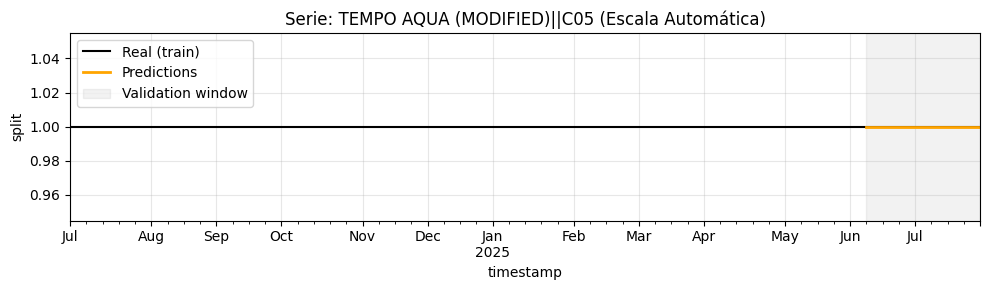

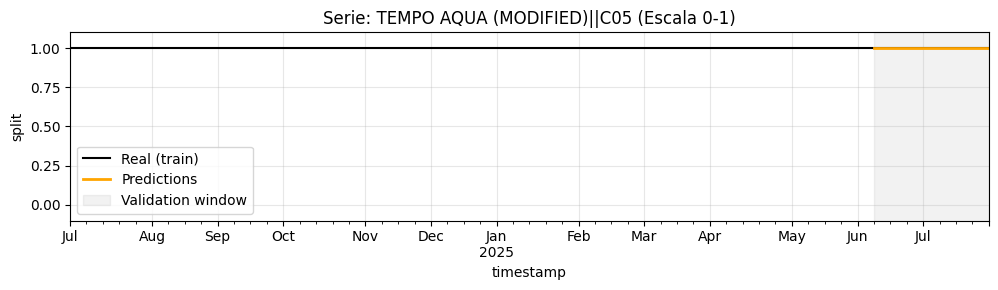


Serie: TORQUE DEVICE||EM_O02_NL
        y  pred  abs_error
120   1.0   1.0        0.0
259   1.0   1.0        0.0
398   1.0   1.0        0.0
537   1.0   1.0        0.0
676   1.0   1.0        0.0
815   1.0   1.0        0.0
954   1.0   1.0        0.0
1093  1.0   1.0        0.0
MAE 0.000000


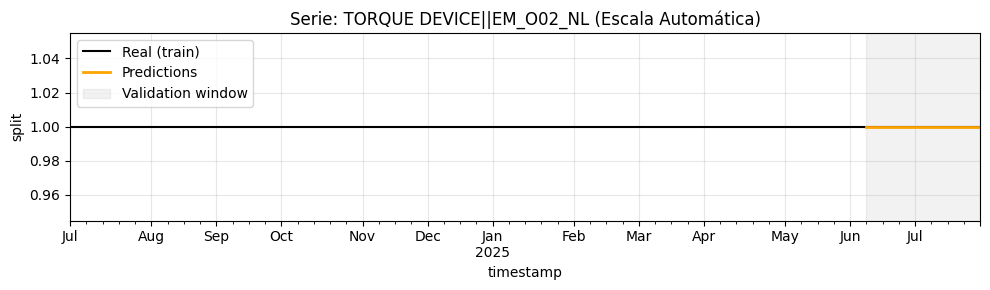

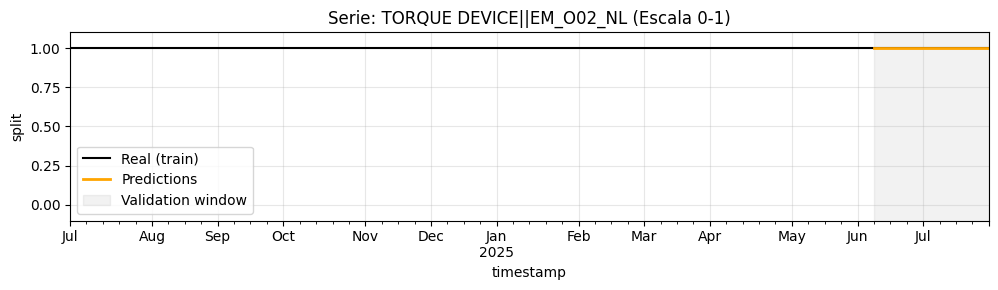


Serie: TRAPEASE||P00
        y  pred  abs_error
121   1.0   1.0        0.0
260   1.0   1.0        0.0
399   1.0   1.0        0.0
538   1.0   1.0        0.0
677   1.0   1.0        0.0
816   1.0   1.0        0.0
955   1.0   1.0        0.0
1094  1.0   1.0        0.0
MAE 0.000000


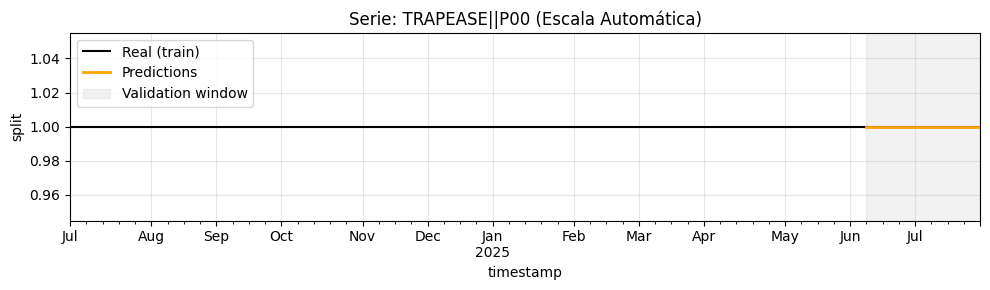

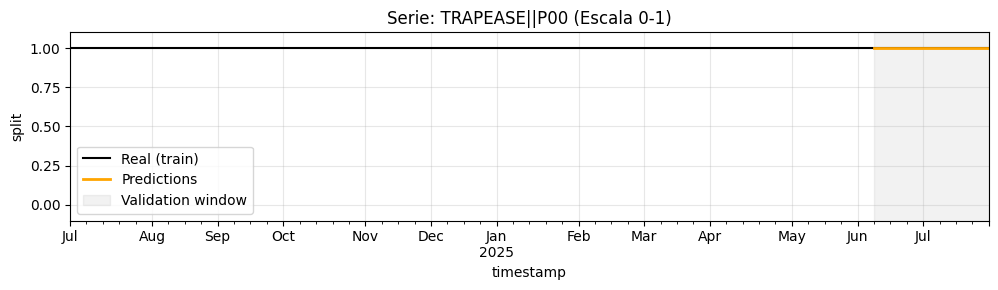


Serie: VASSALLO GT .014||EM_O90
        y  pred  abs_error
122   1.0   1.0        0.0
261   1.0   1.0        0.0
400   1.0   1.0        0.0
539   1.0   1.0        0.0
678   1.0   1.0        0.0
817   1.0   1.0        0.0
956   1.0   1.0        0.0
1095  1.0   1.0        0.0
MAE 0.000000


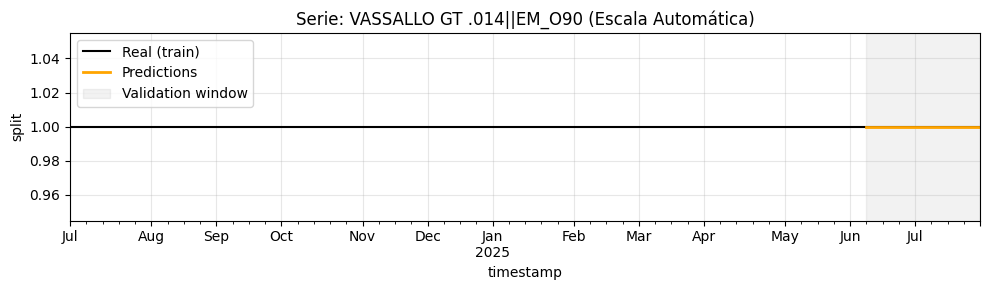

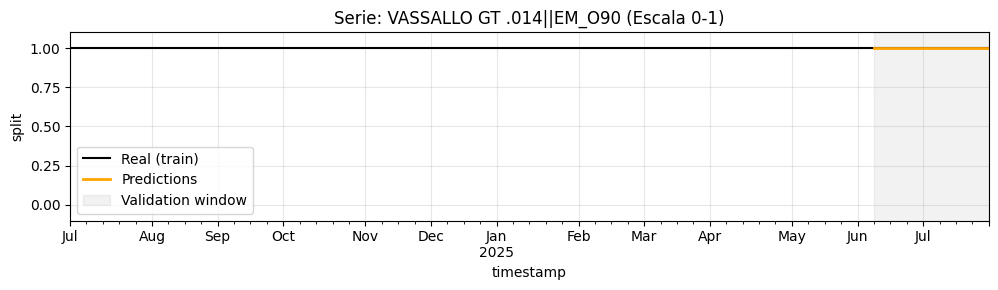


Serie: VASSALLO GT .018||EM_O90
        y  pred  abs_error
123   1.0   1.0        0.0
262   1.0   1.0        0.0
401   1.0   1.0        0.0
540   1.0   1.0        0.0
679   1.0   1.0        0.0
818   1.0   1.0        0.0
957   1.0   1.0        0.0
1096  1.0   1.0        0.0
MAE 0.000000


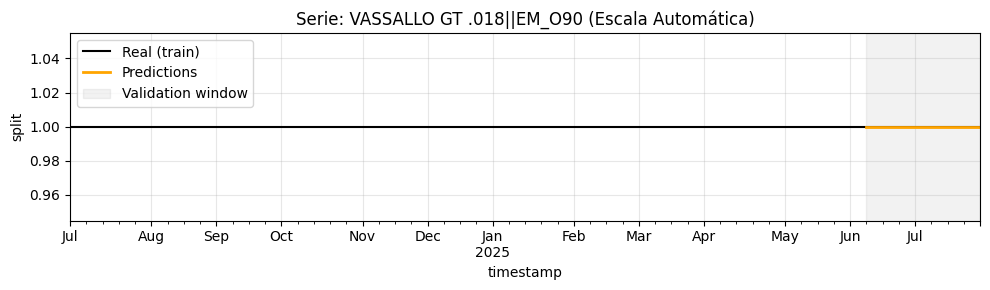

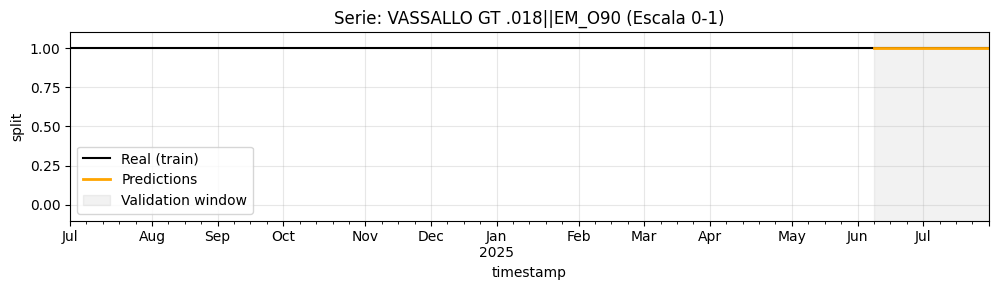


Serie: VASSALLO GT EXT GW||EM_O90
        y  pred  abs_error
124   1.0   1.0        0.0
263   1.0   1.0        0.0
402   1.0   1.0        0.0
541   1.0   1.0        0.0
680   1.0   1.0        0.0
819   1.0   1.0        0.0
958   1.0   1.0        0.0
1097  1.0   1.0        0.0
MAE 0.000000


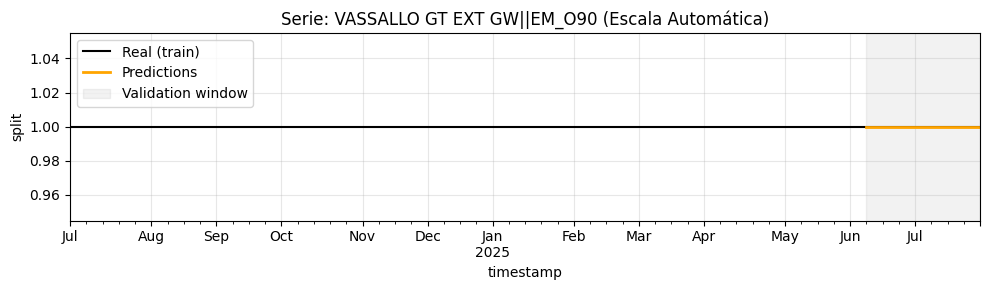

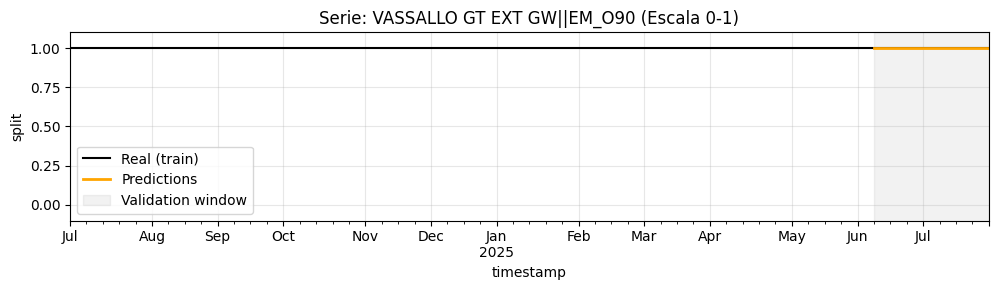


Serie: VESSEL DILATOR||A00B
        y  pred  abs_error
125   1.0   1.0        0.0
264   1.0   1.0        0.0
403   1.0   1.0        0.0
542   1.0   1.0        0.0
681   1.0   1.0        0.0
820   1.0   1.0        0.0
959   1.0   1.0        0.0
1098  1.0   1.0        0.0
MAE 0.000000


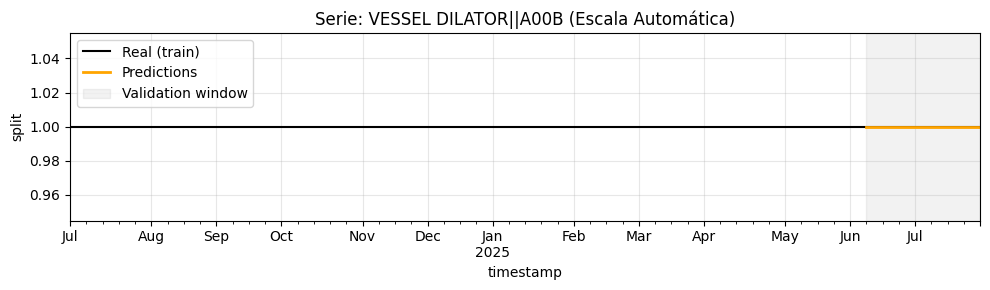

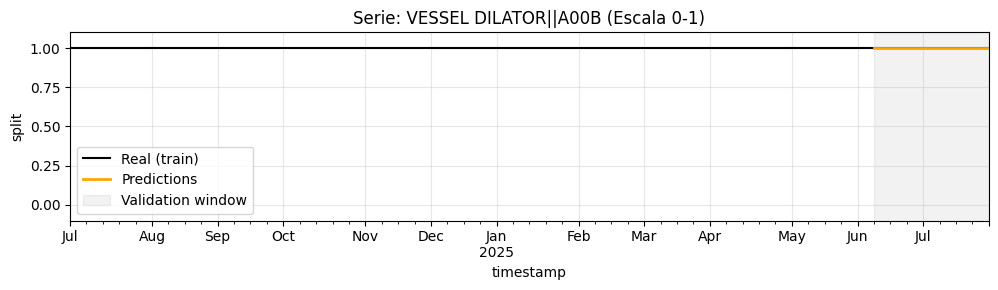


Serie: VISTA BRITE TIP||A01
             y      pred  abs_error
129   0.003919  0.003552   0.000368
268   0.004385  0.003190   0.001195
407   0.004481  0.003223   0.001259
546   0.004289  0.003290   0.001000
685   0.004333  0.003405   0.000927
824   0.004456  0.003396   0.001060
963   0.003779  0.003368   0.000412
1102  0.003644  0.003395   0.000249
MAE 0.000809


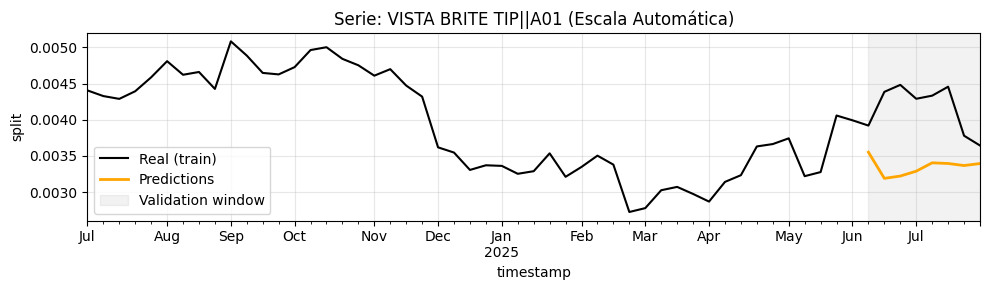

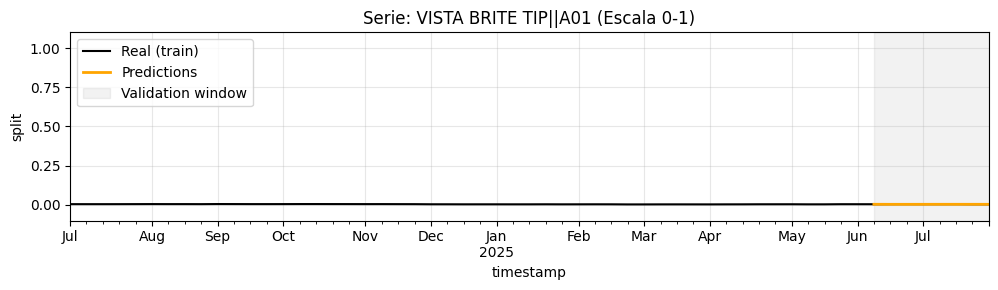


Serie: VISTA BRITE TIP||E00C
             y      pred  abs_error
130   0.000793  0.000330   0.000462
269   0.000789  0.000307   0.000482
408   0.000773  0.000320   0.000453
547   0.000717  0.000322   0.000396
686   0.000756  0.000330   0.000426
825   0.000777  0.000329   0.000448
964   0.002344  0.000328   0.002016
1103  0.002397  0.000328   0.002069
MAE 0.000844


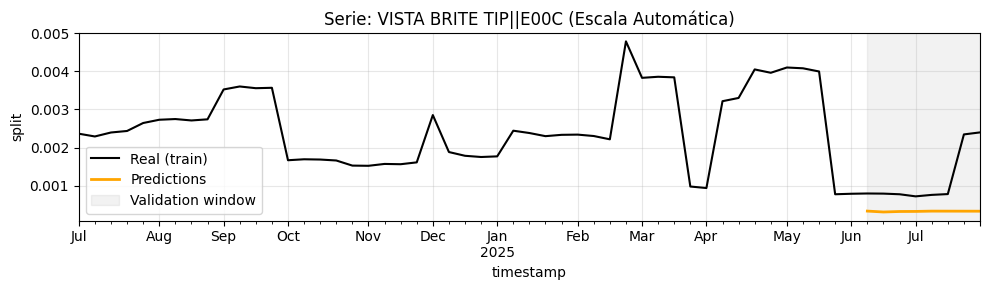

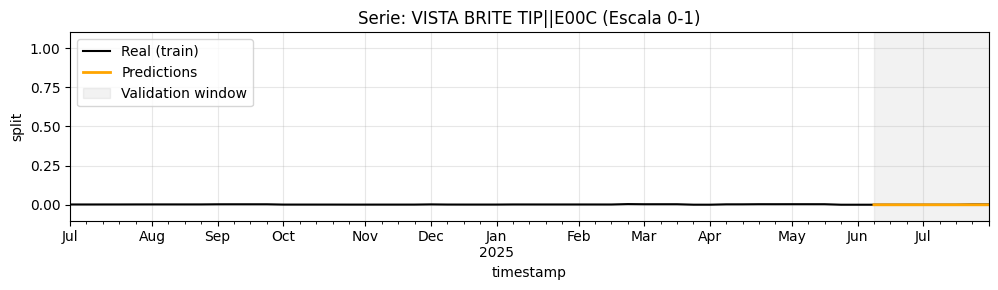


Serie: VISTA BRITE TIP||E01A
             y      pred  abs_error
131   0.037146  0.037863   0.000717
270   0.024936  0.037522   0.012586
409   0.024786  0.037115   0.012329
548   0.024299  0.037333   0.013034
687   0.023560  0.038260   0.014700
826   0.022896  0.038176   0.015280
965   0.024173  0.038253   0.014079
1104  0.024115  0.038168   0.014053
MAE 0.012097


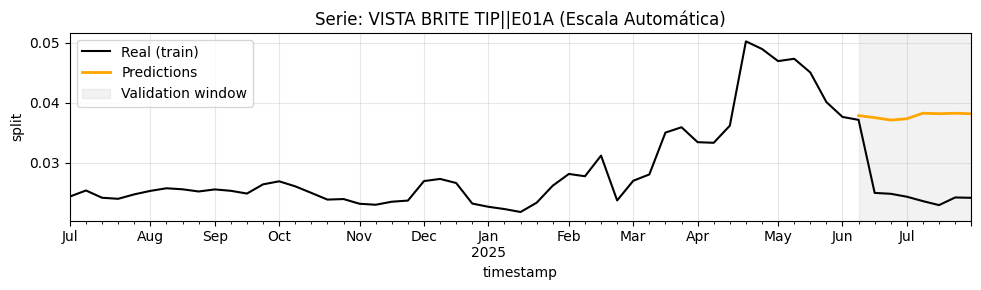

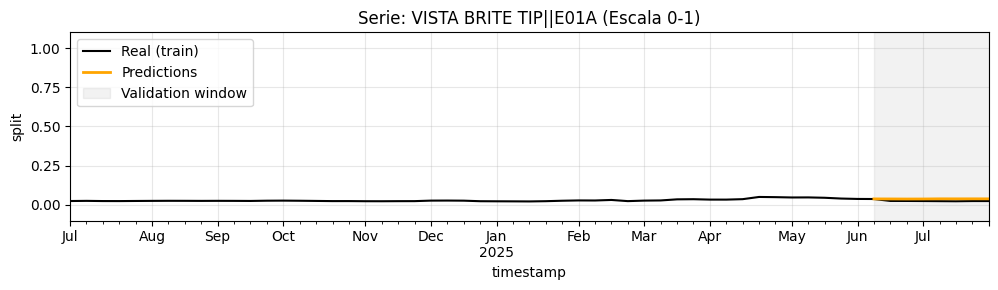


Serie: VISTA BRITE TIP||E01B
             y      pred  abs_error
132   0.527108  0.528113   0.001006
271   0.553674  0.523362   0.030312
410   0.549782  0.528690   0.021093
549   0.552062  0.528185   0.023877
688   0.544731  0.521856   0.022874
827   0.553119  0.520719   0.032400
966   0.545001  0.521985   0.023017
1105  0.548014  0.520828   0.027186
MAE 0.022721


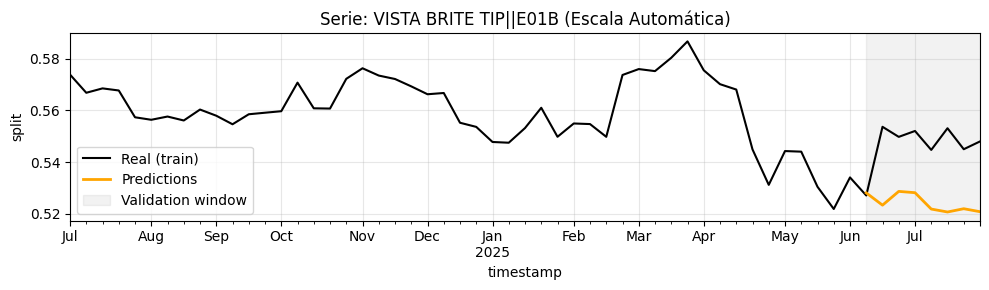

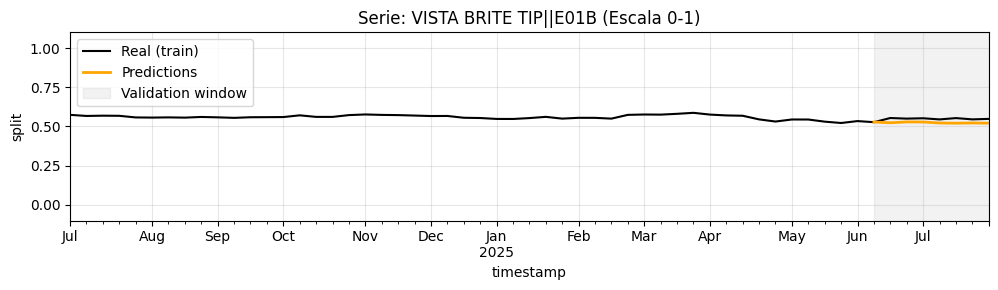


Serie: VISTA BRITE TIP||E02A
             y      pred  abs_error
133   0.264047  0.272103   0.008057
272   0.279950  0.279002   0.000948
411   0.275675  0.276481   0.000806
550   0.272677  0.282706   0.010029
689   0.275546  0.284305   0.008759
828   0.275295  0.285867   0.010571
967   0.276944  0.284251   0.007307
1106  0.278510  0.285803   0.007293
MAE 0.006721


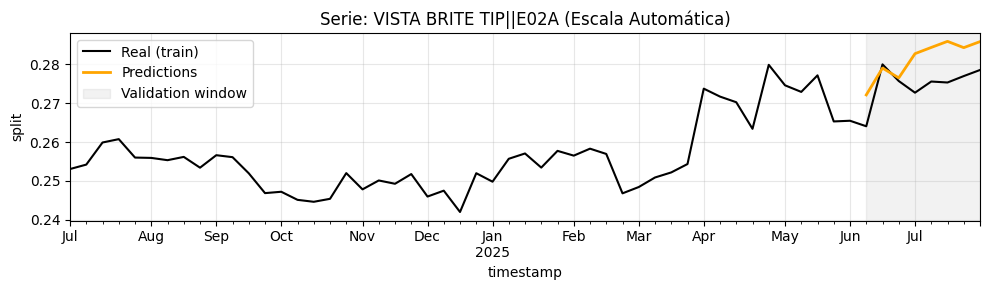

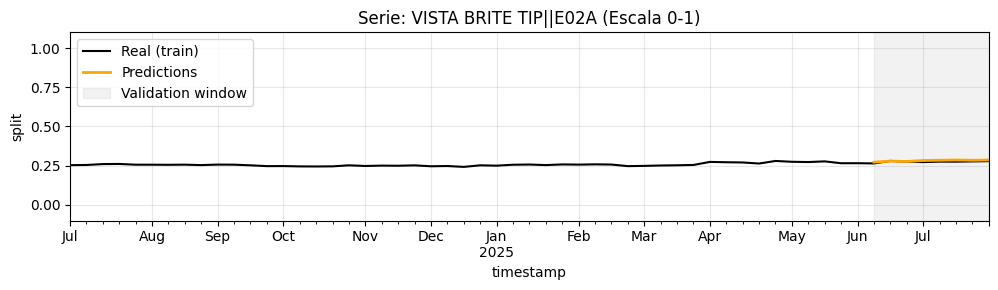


Serie: VISTA BRITE TIP||E02B
             y      pred  abs_error
134   0.106065  0.098518   0.007547
273   0.093201  0.097632   0.004431
412   0.104918  0.096417   0.008501
551   0.104770  0.096982   0.007787
690   0.104579  0.099390   0.005188
829   0.096514  0.099174   0.002660
968   0.104326  0.099372   0.004954
1107  0.098050  0.099152   0.001102
MAE 0.005271


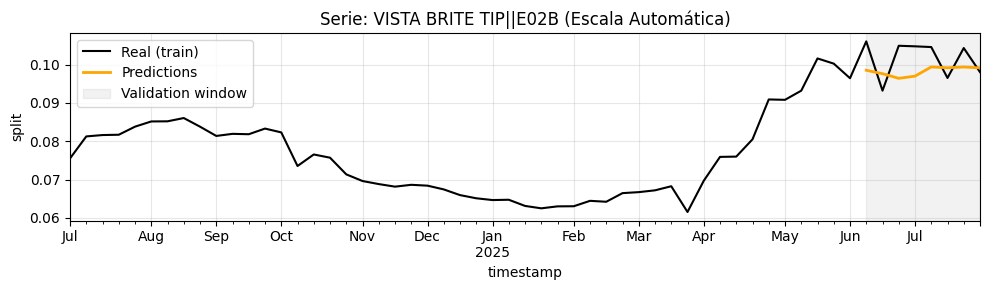

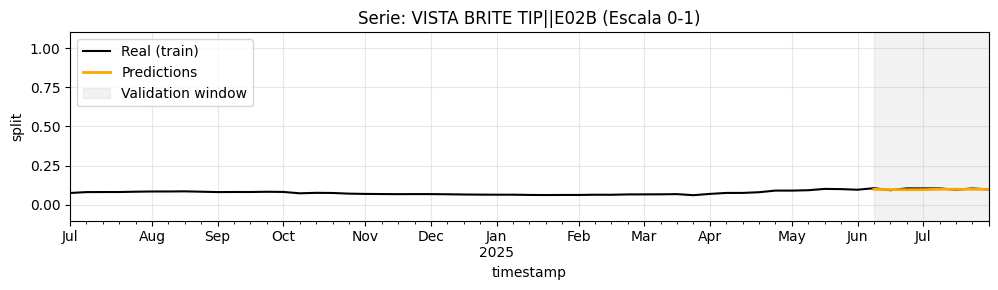


Serie: VISTA BRITE TIP||E02C
             y      pred  abs_error
135   0.060923  0.059520   0.001403
274   0.043065  0.058985   0.015919
413   0.039584  0.057754   0.018170
552   0.041186  0.051183   0.009997
691   0.046497  0.052454   0.005957
830   0.046942  0.052339   0.005397
969   0.043432  0.052444   0.009012
1108  0.045270  0.052327   0.007058
MAE 0.009114


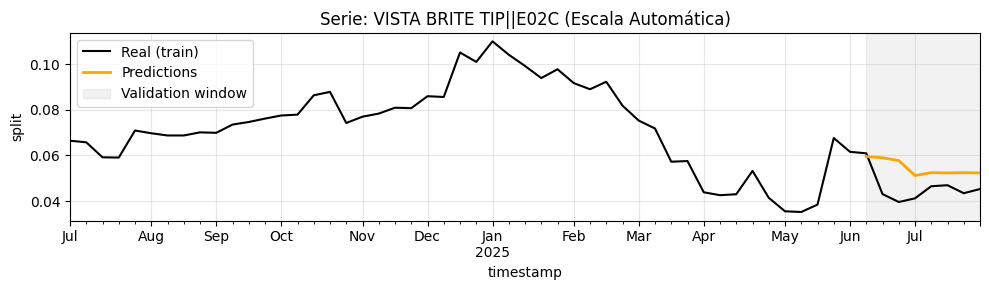

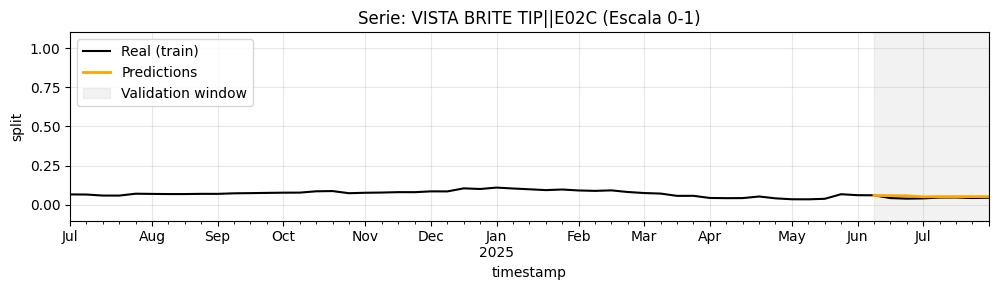


Serie: VISTA BRITE TIP (MODIFIED)||A00B
        y          pred     abs_error
126   0.0  9.864828e-07  9.864828e-07
265   0.0  9.678994e-07  9.678994e-07
404   0.0  9.951793e-07  9.951793e-07
543   0.0  9.951406e-07  9.951406e-07
682   0.0  9.951387e-07  9.951387e-07
821   0.0  9.951950e-07  9.951950e-07
960   0.0  9.913707e-07  9.913707e-07
1099  0.0  9.798189e-07  9.798189e-07
MAE 0.000001


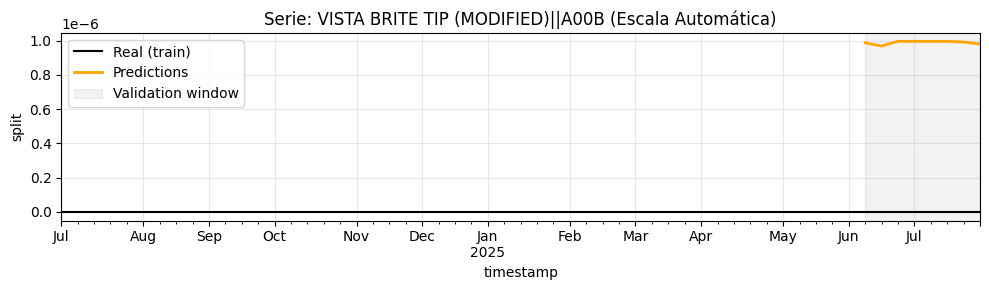

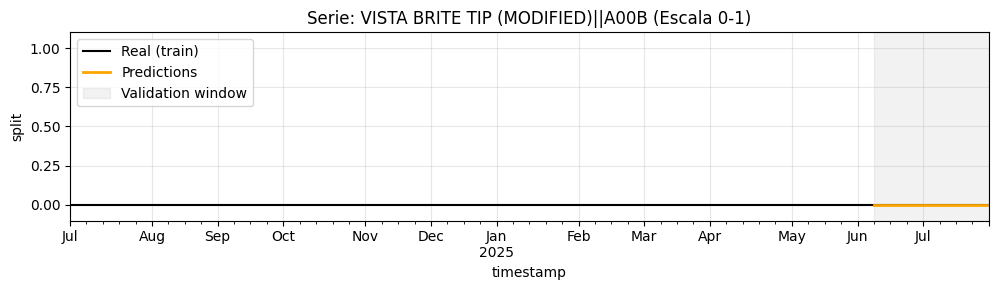


Serie: VISTA BRITE TIP (MODIFIED)||A01
             y      pred  abs_error
127   0.002970  0.002624   0.000346
266   0.003054  0.001625   0.001428
405   0.003061  0.001932   0.001129
544   0.002671  0.001885   0.000786
683   0.000000  0.001907   0.001907
822   0.000000  0.001875   0.001875
961   0.000000  0.001868   0.001868
1100  0.000000  0.001868   0.001868
MAE 0.001401


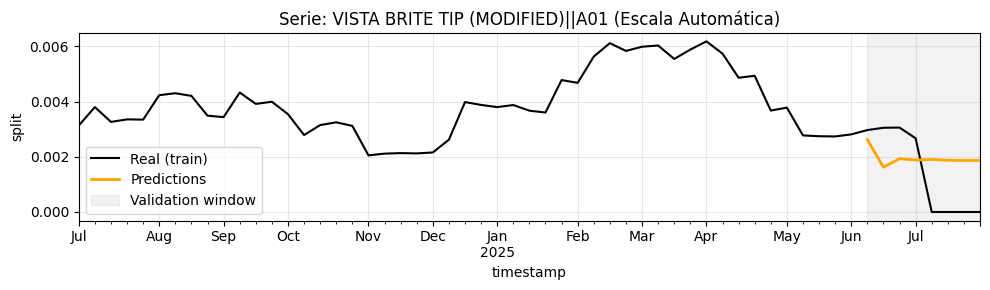

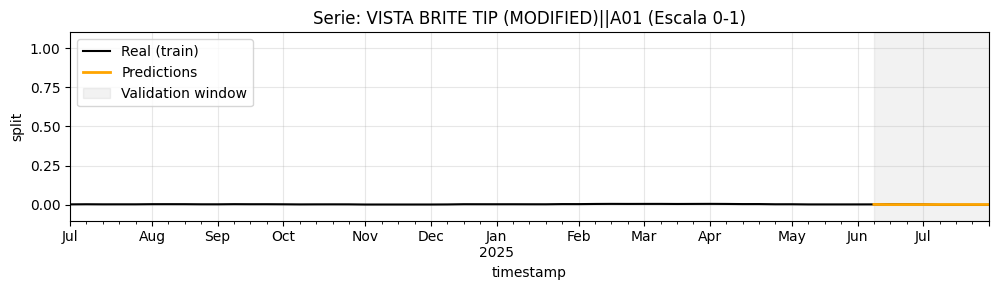


Serie: VISTA BRITE TIP (MODIFIED)||E00D
             y      pred  abs_error
128   0.997030  0.997375   0.000345
267   0.996946  0.998374   0.001427
406   0.996939  0.998067   0.001128
545   0.997329  0.998114   0.000785
684   1.000000  0.998092   0.001908
823   1.000000  0.998124   0.001876
962   1.000000  0.998131   0.001869
1101  1.000000  0.998131   0.001869
MAE 0.001401


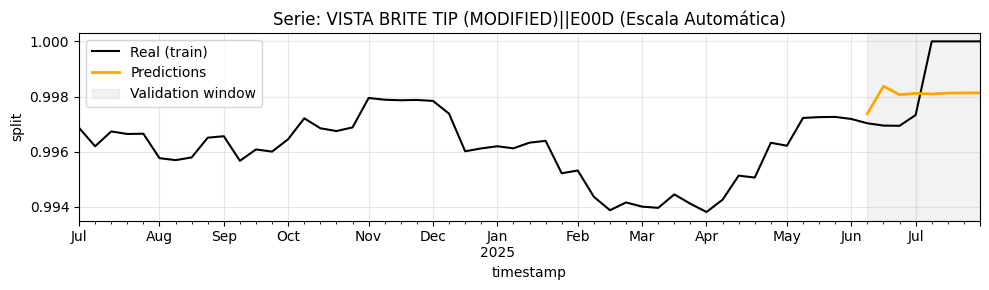

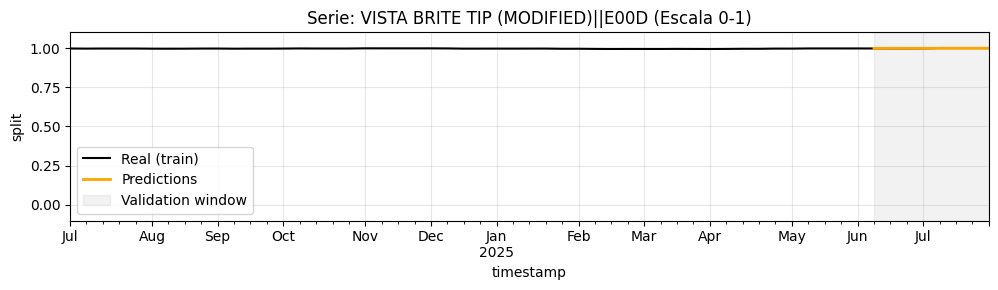


Serie: WIZDOM||EM_K60
        y      pred     abs_error
136   1.0  0.999999  8.997402e-07
275   1.0  0.999999  8.829889e-07
414   1.0  0.999999  8.862126e-07
553   1.0  0.999999  8.862126e-07
692   1.0  0.999999  8.862126e-07
831   1.0  0.999999  8.862126e-07
970   1.0  0.999999  8.828008e-07
1109  1.0  0.999999  8.725141e-07
MAE 0.000001


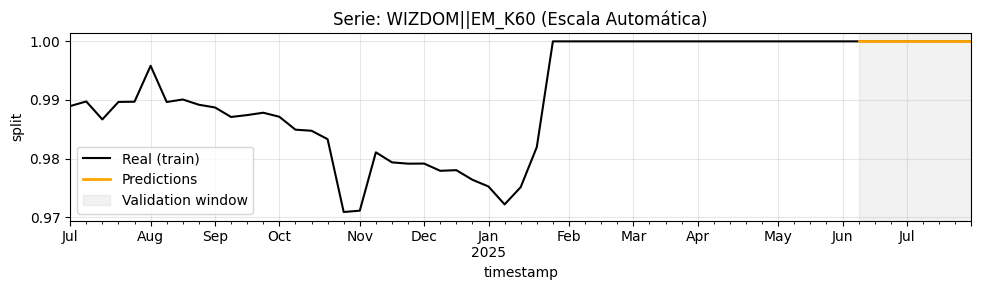

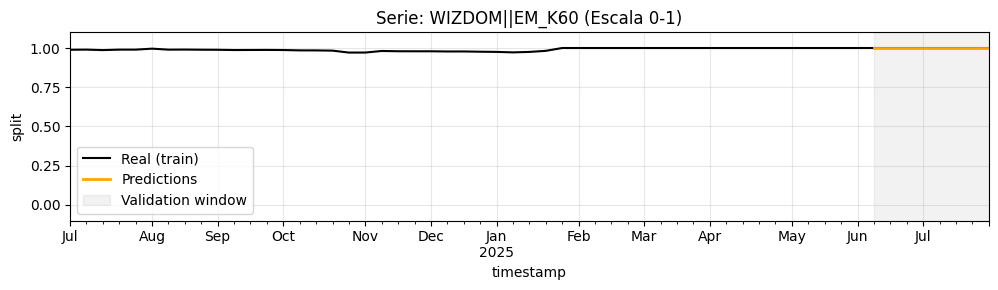


Serie: WIZDOM||EM_K60_NL
        y          pred     abs_error
137   0.0  8.997402e-07  8.997402e-07
276   0.0  8.829889e-07  8.829889e-07
415   0.0  8.862126e-07  8.862126e-07
554   0.0  8.862126e-07  8.862126e-07
693   0.0  8.862126e-07  8.862126e-07
832   0.0  8.862126e-07  8.862126e-07
971   0.0  8.828008e-07  8.828008e-07
1110  0.0  8.725141e-07  8.725141e-07
MAE 0.000001


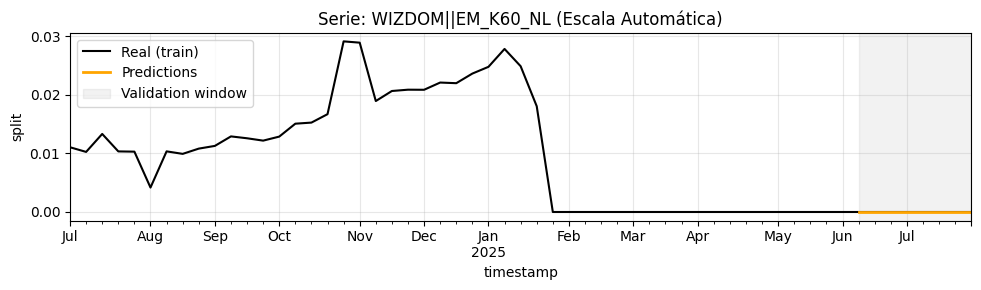

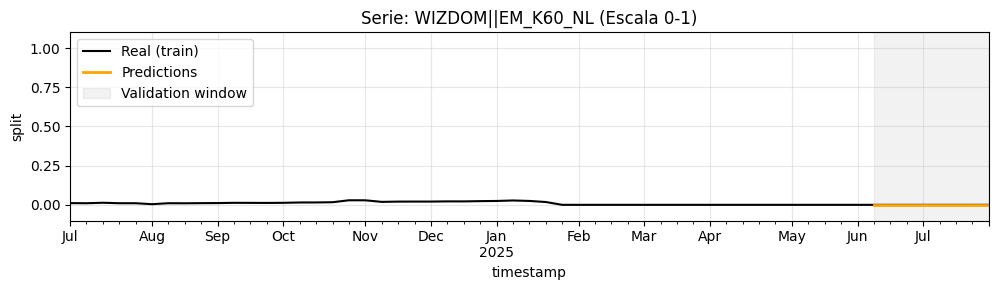


Serie: ZEPHYR||EM_O89
        y  pred  abs_error
138   1.0   1.0        0.0
277   1.0   1.0        0.0
416   1.0   1.0        0.0
555   1.0   1.0        0.0
694   1.0   1.0        0.0
833   1.0   1.0        0.0
972   1.0   1.0        0.0
1111  1.0   1.0        0.0
MAE 0.000000


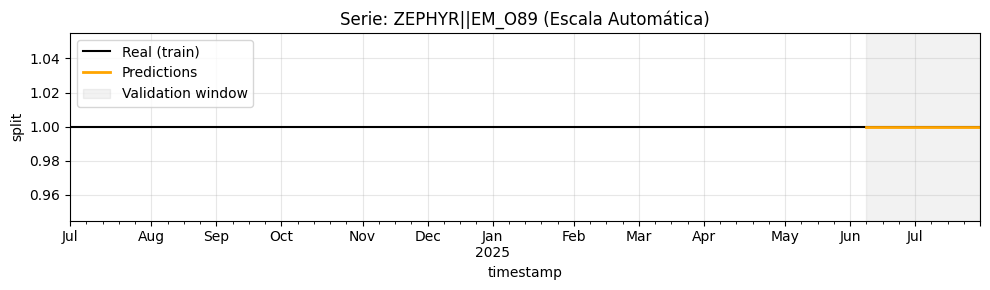

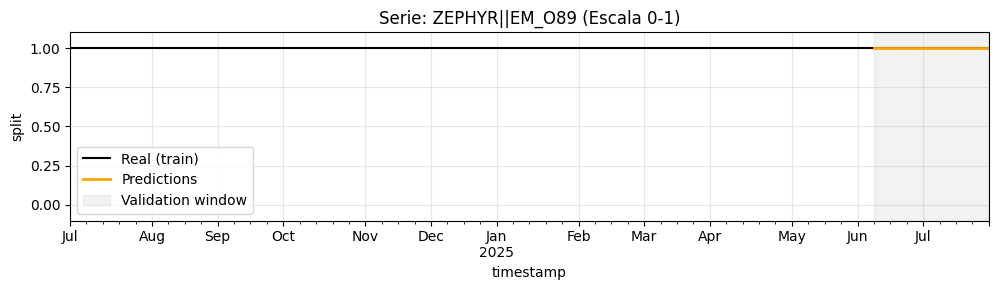

In [28]:
all_skus = series["series_id"].unique().tolist()

plot_results_dual_scale(predictions_df=f_predictions, 
             n_val_weeks = 8, 
             real_serie=series,
             n_plots=5,
             specific_series=all_skus,
             col='split')